# 💻Credit EDA Assignment💻

## Problem Statement:
 - The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history. Because of that, some consumers use it to their advantage by becoming a defaulter. Using EDA (Exploratory Data Analysis), we can analyse the patterns present in the data to ensure that the applicants capable of repaying the loan are not rejected.

## Business Understanding:

 - When the company receives a loan application, the company has to decide for loan approval based on the applicant’s profile. 

##### Two types of risks are associated with the bank’s decision:

 - If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

 - If the applicant is not likely to repay the loan, i.e., he/she is likely to default, then approving the loan may lead to a financial loss for the company.
 
## Business Objectives

 - This case study aims to identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study.

 - In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.

 

## 📚 Importing Necessary Libraries:

In [1]:
#Analysis
import numpy as np
import pandas as pd

#Visualization
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline

## ⚠️Supress Warnings:

In [2]:
import warnings
warnings.filterwarnings('ignore')

## ⚙️Environment Settings

In [3]:
pd.set_option('display.max_rows', 500)

## ⚙️Suppressing scientific notations in Pandas

In [4]:
pd.set_option('display.float_format', lambda x: '%.4f' % x) 

# APPLICATION DATA:

## 📝🧠 Reading & Understanding of APPLICATION DATA

In [5]:
#Loading the Dataset
df = pd.read_csv('application_data.csv')
#Checking the data
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0000,406597.5000,24700.5000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
1,100003,0,Cash loans,F,N,N,0,270000.0000,1293502.5000,35698.5000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0000,135000.0000,6750.0000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,100006,0,Cash loans,F,N,Y,0,135000.0000,312682.5000,29686.5000,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0000,513000.0000,21865.5000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [6]:
#Checking the Shape of the DataFrame
print('(No. of rows, No. of columns):', df.shape)

(No. of rows, No. of columns): (307511, 122)


In [7]:
# Getting the information about the DataFrame
df.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [8]:
# Generating descriptive statistics of the DataFrame. 
#It summarizes the central tendency, dispersion and shape of the dataset's distribution, excluding NaN values.
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307499.0000,307233.0000,307511.0000,307511.0000,307511.0000,...,307511.0000,307511.0000,307511.0000,307511.0000,265992.0000,265992.0000,265992.0000,265992.0000,265992.0000,265992.0000
mean,278180.5186,0.0807,0.4171,168797.9193,599025.9997,27108.5739,538396.2074,0.0209,-16036.9951,63815.0459,...,0.0081,0.0006,0.0005,0.0003,0.0064,0.0070,0.0344,0.2674,0.2655,1.9000
std,102790.1753,0.2724,0.7221,237123.1463,402490.7770,14493.7373,369446.4605,0.0138,4363.9886,141275.7665,...,0.0898,0.0244,0.0225,0.0183,0.0838,0.1108,0.2047,0.9160,0.7941,1.8693
min,100002.0000,0.0000,0.0000,25650.0000,45000.0000,1615.5000,40500.0000,0.0003,-25229.0000,-17912.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,189145.5000,0.0000,0.0000,112500.0000,270000.0000,16524.0000,238500.0000,0.0100,-19682.0000,-2760.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,278202.0000,0.0000,0.0000,147150.0000,513531.0000,24903.0000,450000.0000,0.0188,-15750.0000,-1213.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
75%,367142.5000,0.0000,1.0000,202500.0000,808650.0000,34596.0000,679500.0000,0.0287,-12413.0000,-289.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000
max,456255.0000,1.0000,19.0000,117000000.0000,4050000.0000,258025.5000,4050000.0000,0.0725,-7489.0000,365243.0000,...,1.0000,1.0000,1.0000,1.0000,4.0000,9.0000,8.0000,27.0000,261.0000,25.0000


## 🧹Data Cleansing & Manipulation

### 👉Reusable User Defined Function to get the percentage of missing values in the dataset

In [9]:
# Defining a reusable function to get an idea about missing data
def miss_perc(x):
    return 100*x.isnull().mean().sort_values(ascending = False)

In [10]:
# Getting missing values in df using User Defined Function
miss_perc(df)

COMMONAREA_MEDI                69.8723
COMMONAREA_AVG                 69.8723
COMMONAREA_MODE                69.8723
NONLIVINGAPARTMENTS_MODE       69.4330
NONLIVINGAPARTMENTS_AVG        69.4330
NONLIVINGAPARTMENTS_MEDI       69.4330
FONDKAPREMONT_MODE             68.3862
LIVINGAPARTMENTS_MODE          68.3550
LIVINGAPARTMENTS_AVG           68.3550
LIVINGAPARTMENTS_MEDI          68.3550
FLOORSMIN_AVG                  67.8486
FLOORSMIN_MODE                 67.8486
FLOORSMIN_MEDI                 67.8486
YEARS_BUILD_MEDI               66.4978
YEARS_BUILD_MODE               66.4978
YEARS_BUILD_AVG                66.4978
OWN_CAR_AGE                    65.9908
LANDAREA_MEDI                  59.3767
LANDAREA_MODE                  59.3767
LANDAREA_AVG                   59.3767
BASEMENTAREA_MEDI              58.5160
BASEMENTAREA_AVG               58.5160
BASEMENTAREA_MODE              58.5160
EXT_SOURCE_1                   56.3811
NONLIVINGAREA_MODE             55.1792
NONLIVINGAREA_AVG        

In [11]:
pip install missingno

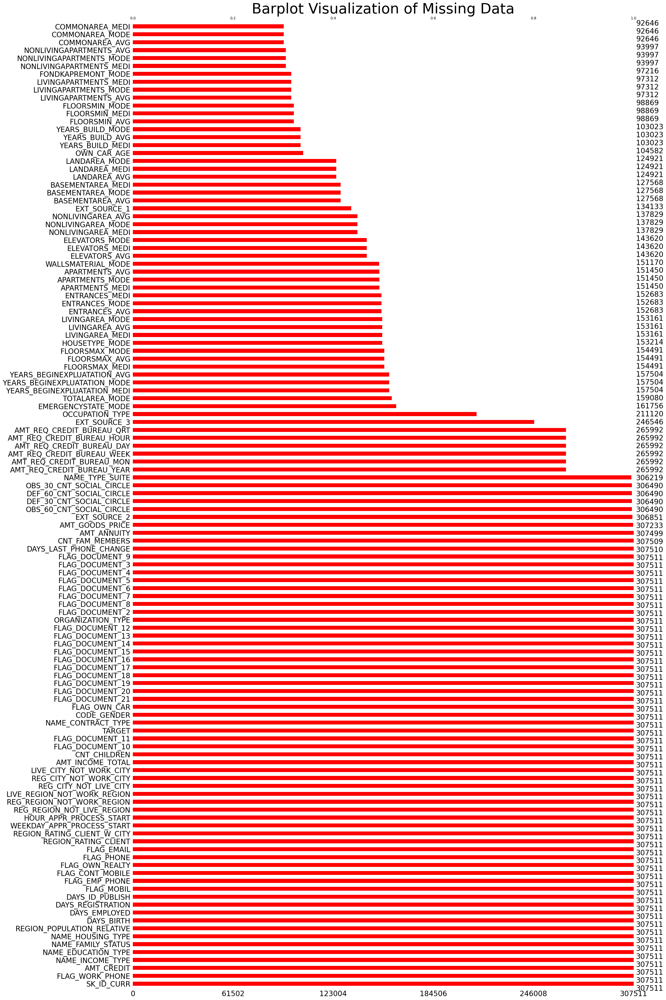

In [12]:
# missingno provides a clear visualization to understand the presence of missing data within the DataFrame
import missingno as msno
# Visualizing the missing data within the Appliction Data
msno.bar(df, color = ('red'), sort = 'descending', fontsize=20)
plt.title('Barplot Visualization of Missing Data', fontsize=40)
plt.show()
# The height of the bar indicates how complete that column is.

## Inferences from the missingno plot: 
 - The above bar plot shows some incomplete bars clearly i.e., there are some missing values in those columns.

### 👉Reusable User Defined Function to drop the columns with more than 35% missing values in the dataset

In [13]:
def rem_nulls(y):
    pre_shape = y.shape
    col_to_drop=list(y.columns[100*y.isnull().mean()>35])
    y.drop(labels=col_to_drop, axis=1, inplace=True)
    print("Number of Columns dropped\t: ", len(col_to_drop))
    print('***************************************')
    print('List of columns dropped:',col_to_drop)
    print('***************************************')
    print('\n(No. of rows, No. of columns) before dropping:', pre_shape,'\n(No. of rows, No. of columns) after dropping:', y.shape)
    return y.head()

In [14]:
rem_nulls(df)

Number of Columns dropped	:  49
***************************************
List of columns dropped: ['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'FO

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0000,406597.5000,24700.5000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
1,100003,0,Cash loans,F,N,N,0,270000.0000,1293502.5000,35698.5000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0000,135000.0000,6750.0000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,100006,0,Cash loans,F,N,Y,0,135000.0000,312682.5000,29686.5000,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0000,513000.0000,21865.5000,...,0,0,0,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


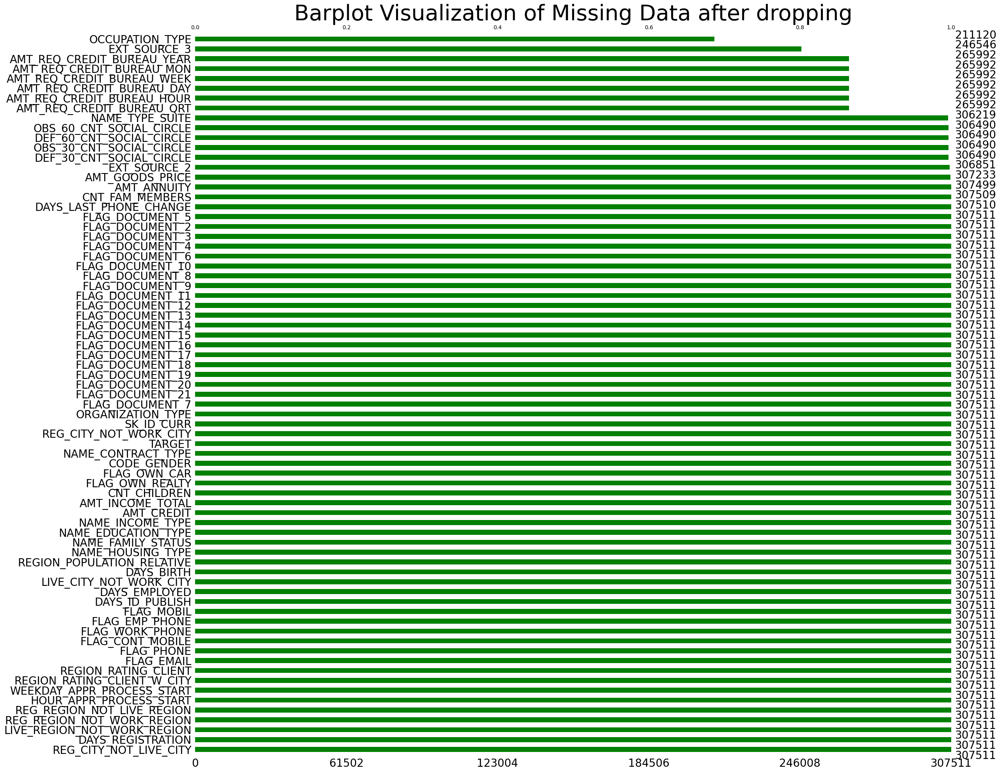

In [15]:
#Rechecking whether the columns are dropped or not, using missingno bar plot
import missingno as msno
msno.bar(df, color = ('green'), sort = 'descending', fontsize=20)
plt.title('Barplot Visualization of Missing Data after dropping', fontsize=40)
plt.show()

## Inferences from the missingno plot: 
 - The above bar plot shows that all the columns with more than 35% missing values have been removed.

### Now, let's deal with the columns with the missing values less than or equal to 35%

In [16]:
# Rechecking missing value percentage
miss_perc(df)

OCCUPATION_TYPE               31.3455
EXT_SOURCE_3                  19.8253
AMT_REQ_CREDIT_BUREAU_YEAR    13.5016
AMT_REQ_CREDIT_BUREAU_QRT     13.5016
AMT_REQ_CREDIT_BUREAU_MON     13.5016
AMT_REQ_CREDIT_BUREAU_WEEK    13.5016
AMT_REQ_CREDIT_BUREAU_DAY     13.5016
AMT_REQ_CREDIT_BUREAU_HOUR    13.5016
NAME_TYPE_SUITE                0.4201
OBS_30_CNT_SOCIAL_CIRCLE       0.3320
DEF_30_CNT_SOCIAL_CIRCLE       0.3320
OBS_60_CNT_SOCIAL_CIRCLE       0.3320
DEF_60_CNT_SOCIAL_CIRCLE       0.3320
EXT_SOURCE_2                   0.2146
AMT_GOODS_PRICE                0.0904
AMT_ANNUITY                    0.0039
CNT_FAM_MEMBERS                0.0007
DAYS_LAST_PHONE_CHANGE         0.0003
FLAG_DOCUMENT_17               0.0000
FLAG_DOCUMENT_18               0.0000
FLAG_DOCUMENT_21               0.0000
FLAG_DOCUMENT_20               0.0000
FLAG_DOCUMENT_19               0.0000
FLAG_DOCUMENT_2                0.0000
FLAG_DOCUMENT_3                0.0000
FLAG_DOCUMENT_4                0.0000
FLAG_DOCUMEN

In [17]:
# Now, let's drop the columns which play minor role in the Analysis of Data to make it easy
un_imp_cols = ['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3','FLAG_DOCUMENT_4',
                'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6','FLAG_DOCUMENT_7', 
                'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9','FLAG_DOCUMENT_10', 
                'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12','FLAG_DOCUMENT_13',
                'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15','FLAG_DOCUMENT_16', 
                'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18','FLAG_DOCUMENT_19', 
                'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21','FLAG_MOBIL', 
                'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                'FLAG_PHONE', 'FLAG_EMAIL','WEEKDAY_APPR_PROCESS_START', 
                'HOUR_APPR_PROCESS_START', 'DAYS_REGISTRATION',
                'REGION_RATING_CLIENT','FLAG_OWN_CAR', 'REGION_POPULATION_RELATIVE']

In [18]:
# Dropping all the columns which play minor role in Analysing the data
print('(No. of rows, No. of columns) before dropping:', df.shape)
print('**********************************************************')
df.drop(labels=un_imp_cols, axis=1, inplace=True)
print('No. of unwanted columns dropped:',len(un_imp_cols) )
print('(No. of rows, No. of columns) after dropping:', df.shape)

(No. of rows, No. of columns) before dropping: (307511, 73)
**********************************************************
No. of unwanted columns dropped: 32
(No. of rows, No. of columns) after dropping: (307511, 41)


In [19]:
# Now, again generating descriptive statistics of the DataFrame after dropping the columns.
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307499.0000,307233.0000,307511.0000,307511.0000,307511.0000,...,306490.0000,306490.0000,306490.0000,307510.0000,265992.0000,265992.0000,265992.0000,265992.0000,265992.0000,265992.0000
mean,278180.5186,0.0807,0.4171,168797.9193,599025.9997,27108.5739,538396.2074,-16036.9951,63815.0459,-2994.2024,...,0.1434,1.4053,0.1000,-962.8588,0.0064,0.0070,0.0344,0.2674,0.2655,1.9000
std,102790.1753,0.2724,0.7221,237123.1463,402490.7770,14493.7373,369446.4605,4363.9886,141275.7665,1509.4504,...,0.4467,2.3798,0.3623,826.8085,0.0838,0.1108,0.2047,0.9160,0.7941,1.8693
min,100002.0000,0.0000,0.0000,25650.0000,45000.0000,1615.5000,40500.0000,-25229.0000,-17912.0000,-7197.0000,...,0.0000,0.0000,0.0000,-4292.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,189145.5000,0.0000,0.0000,112500.0000,270000.0000,16524.0000,238500.0000,-19682.0000,-2760.0000,-4299.0000,...,0.0000,0.0000,0.0000,-1570.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,278202.0000,0.0000,0.0000,147150.0000,513531.0000,24903.0000,450000.0000,-15750.0000,-1213.0000,-3254.0000,...,0.0000,0.0000,0.0000,-757.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
75%,367142.5000,0.0000,1.0000,202500.0000,808650.0000,34596.0000,679500.0000,-12413.0000,-289.0000,-1720.0000,...,0.0000,2.0000,0.0000,-274.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000
max,456255.0000,1.0000,19.0000,117000000.0000,4050000.0000,258025.5000,4050000.0000,-7489.0000,365243.0000,0.0000,...,34.0000,344.0000,24.0000,0.0000,4.0000,9.0000,8.0000,27.0000,261.0000,25.0000


## 🚰 Data Imputation

In [20]:
df.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 41 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_REALTY              307511 non-null  object 
 5   CNT_CHILDREN                 307511 non-null  int64  
 6   AMT_INCOME_TOTAL             307511 non-null  float64
 7   AMT_CREDIT                   307511 non-null  float64
 8   AMT_ANNUITY                  307499 non-null  float64
 9   AMT_GOODS_PRICE              307233 non-null  float64
 10  NAME_TYPE_SUITE              306219 non-null  object 
 11  NAME_INCOME_TYPE             307511 non-null  object 
 12  NAME_EDUCATION_TYPE          307511 non-null  object 
 13 

In [21]:
#Checking what kind of occupation the clients have
100*df["OCCUPATION_TYPE"].value_counts(normalize=True)

Laborers                26.1396
Sales staff             15.2056
Core staff              13.0589
Managers                10.1227
Drivers                  8.8116
High skill tech staff    5.3903
Accountants              4.6481
Medicine staff           4.0437
Security staff           3.1835
Cooking staff            2.8164
Cleaning staff           2.2040
Private service staff    1.2562
Low-skill Laborers       0.9914
Waiters/barmen staff     0.6385
Secretaries              0.6181
Realty agents            0.3557
HR staff                 0.2667
IT staff                 0.2491
Name: OCCUPATION_TYPE, dtype: float64

In [22]:
# We can see 'OCCUPATION_TYPE' has the highest null percentage(31.346%) among the remaining columns. 
#Let's impute them with 'To_be_filled' as the missing occupation type can be anything as per above value_counts info and its datatype is 'object'.
#We can't even consider them to be un-employed as there can be Students.
df['OCCUPATION_TYPE'].fillna(value="To_be_filled", inplace=True)

In [23]:
# Checking 'XNA' values in the Gender column of the Application Data
df['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

## Observation: 
 - There are 4 only 'XNA' values in Gender column. It's negligible when compared to the count 'F' and 'M'. It's observed that Female clients are almost double the Male clients and . If we impute 'XNA' values with 'F', our analysis on the data is not at all affected.

In [24]:
# Imputing 'XNA' in 'CODE_GENDER' column with 'F'
df.loc[ df['CODE_GENDER'] == "XNA", 'CODE_GENDER'] = 'F'

In [25]:
#Rechecking the imputation
df['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

In [26]:
df['NAME_FAMILY_STATUS'].value_counts(normalize = True) * 100

Married                63.8780
Single / not married   14.7780
Civil marriage          9.6826
Separated               6.4290
Widow                   5.2317
Unknown                 0.0007
Name: NAME_FAMILY_STATUS, dtype: float64

In [27]:
df['NAME_FAMILY_STATUS'].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

### Assumption:
 - Let's assume Clients with Unknown Family Status as 'Married' as the number of Unknown Values is just 2.

In [28]:
df['NAME_FAMILY_STATUS'] = df['NAME_FAMILY_STATUS'].apply(lambda x: 'Married' if x == 'Unknown' else x)

In [29]:
df['NAME_FAMILY_STATUS'].value_counts(normalize = True) * 100

Married                63.8787
Single / not married   14.7780
Civil marriage          9.6826
Separated               6.4290
Widow                   5.2317
Name: NAME_FAMILY_STATUS, dtype: float64

In [30]:
miss_perc(df)

EXT_SOURCE_3                  19.8253
AMT_REQ_CREDIT_BUREAU_YEAR    13.5016
AMT_REQ_CREDIT_BUREAU_QRT     13.5016
AMT_REQ_CREDIT_BUREAU_MON     13.5016
AMT_REQ_CREDIT_BUREAU_WEEK    13.5016
AMT_REQ_CREDIT_BUREAU_DAY     13.5016
AMT_REQ_CREDIT_BUREAU_HOUR    13.5016
NAME_TYPE_SUITE                0.4201
OBS_60_CNT_SOCIAL_CIRCLE       0.3320
OBS_30_CNT_SOCIAL_CIRCLE       0.3320
DEF_30_CNT_SOCIAL_CIRCLE       0.3320
DEF_60_CNT_SOCIAL_CIRCLE       0.3320
EXT_SOURCE_2                   0.2146
AMT_GOODS_PRICE                0.0904
AMT_ANNUITY                    0.0039
CNT_FAM_MEMBERS                0.0007
DAYS_LAST_PHONE_CHANGE         0.0003
LIVE_REGION_NOT_WORK_REGION    0.0000
ORGANIZATION_TYPE              0.0000
LIVE_CITY_NOT_WORK_CITY        0.0000
REG_CITY_NOT_WORK_CITY         0.0000
REG_CITY_NOT_LIVE_CITY         0.0000
SK_ID_CURR                     0.0000
REG_REGION_NOT_WORK_REGION     0.0000
REG_REGION_NOT_LIVE_REGION     0.0000
NAME_CONTRACT_TYPE             0.0000
CODE_GENDER 

In [31]:
df.nunique().sort_values(ascending=False)

SK_ID_CURR                     307511
EXT_SOURCE_2                   119831
DAYS_BIRTH                      17460
AMT_ANNUITY                     13672
DAYS_EMPLOYED                   12574
DAYS_ID_PUBLISH                  6168
AMT_CREDIT                       5603
DAYS_LAST_PHONE_CHANGE           3773
AMT_INCOME_TOTAL                 2548
AMT_GOODS_PRICE                  1002
EXT_SOURCE_3                      814
ORGANIZATION_TYPE                  58
OBS_60_CNT_SOCIAL_CIRCLE           33
OBS_30_CNT_SOCIAL_CIRCLE           33
AMT_REQ_CREDIT_BUREAU_YEAR         25
AMT_REQ_CREDIT_BUREAU_MON          24
OCCUPATION_TYPE                    19
CNT_FAM_MEMBERS                    17
CNT_CHILDREN                       15
AMT_REQ_CREDIT_BUREAU_QRT          11
DEF_30_CNT_SOCIAL_CIRCLE           10
AMT_REQ_CREDIT_BUREAU_WEEK          9
AMT_REQ_CREDIT_BUREAU_DAY           9
DEF_60_CNT_SOCIAL_CIRCLE            9
NAME_INCOME_TYPE                    8
NAME_TYPE_SUITE                     7
NAME_HOUSING

In [32]:
df.nunique().sort_values(ascending=False).index

Index(['SK_ID_CURR', 'EXT_SOURCE_2', 'DAYS_BIRTH', 'AMT_ANNUITY',
       'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'AMT_CREDIT',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE',
       'EXT_SOURCE_3', 'ORGANIZATION_TYPE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'AMT_REQ_CREDIT_BUREAU_MON', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'CNT_CHILDREN', 'AMT_REQ_CREDIT_BUREAU_QRT', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE',
       'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'NAME_EDUCATION_TYPE', 'REGION_RATING_CLIENT_W_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY', 'FLAG_OWN_REALTY',
       'REG_CITY_NOT_LIVE_CITY', 'CODE_GENDER', 'LIVE_REGION_NOT_WORK_REGION',
       'NAME_CONTRACT_TYPE', 'REG_REGION_NOT_WORK_REGION',
       'REG_REGI

## Segregating the columns into Categorical, Continuous and ID columns.

In [33]:
# The below are the categorical columns. Categorical columns are the columns which have very less unique values.
cat_cols=['ORGANIZATION_TYPE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'AMT_REQ_CREDIT_BUREAU_MON', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE',
       'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'REGION_RATING_CLIENT_W_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'FLAG_OWN_REALTY', 'REG_CITY_NOT_WORK_CITY', 'CODE_GENDER',
       'REG_CITY_NOT_LIVE_CITY', 'NAME_CONTRACT_TYPE',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_WORK_REGION', 'TARGET',
       'REG_REGION_NOT_LIVE_REGION','CNT_CHILDREN']
#The below are the Continuous/Numerical columns. Numerical columns can have a very high unique values.
cont_cols =['EXT_SOURCE_2', 'DAYS_BIRTH', 'AMT_ANNUITY',
       'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'AMT_CREDIT', 'AMT_INCOME_TOTAL',
       'AMT_GOODS_PRICE', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE']
# As the no of unique values in 'SK_ID_CURR' is equal to the total no of rows, it can be considered to be ID column.
id_col = ['SK_ID_CURR']

In [34]:
miss_cat_cols = [i for i in cat_cols if df[i].isnull().mean()>0]
print('Categorical Columns with missing values:', miss_cat_cols)
print('*********************************************************')
miss_cont_cols= [i for i in cont_cols if df[i].isnull().mean()>0]
print('Continuous Columns with missing values:', miss_cont_cols)

Categorical Columns with missing values: ['OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_MON', 'CNT_FAM_MEMBERS', 'AMT_REQ_CREDIT_BUREAU_QRT', 'DEF_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY', 'DEF_60_CNT_SOCIAL_CIRCLE', 'NAME_TYPE_SUITE', 'AMT_REQ_CREDIT_BUREAU_HOUR']
*********************************************************
Continuous Columns with missing values: ['EXT_SOURCE_2', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE']


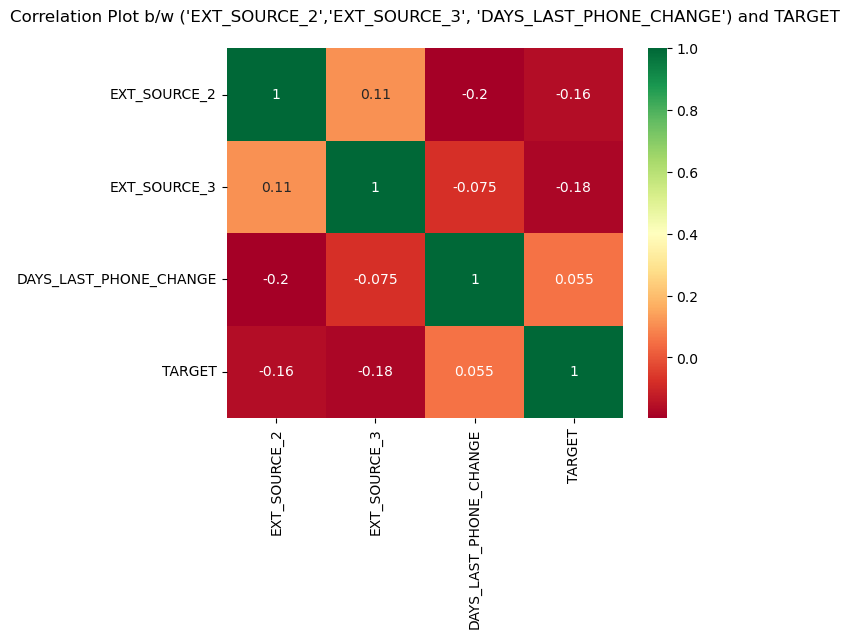

In [35]:
# Checking correlation between 3 continuous columns('EXT_SOURCE_2','EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE') and TARGET
l = df[['EXT_SOURCE_2','EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'TARGET']]
sns.heatmap(l.corr(), annot = True, cmap='RdYlGn')
plt.title("Correlation Plot b/w ('EXT_SOURCE_2','EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE') and TARGET\n")
plt.show()

## 🌹Inferences from the above heatmap: 
 - The above heatmap clearly shows that there is a negligible correlation b/w ('EXT_SOURCE_2','EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE') and TARGET🌹

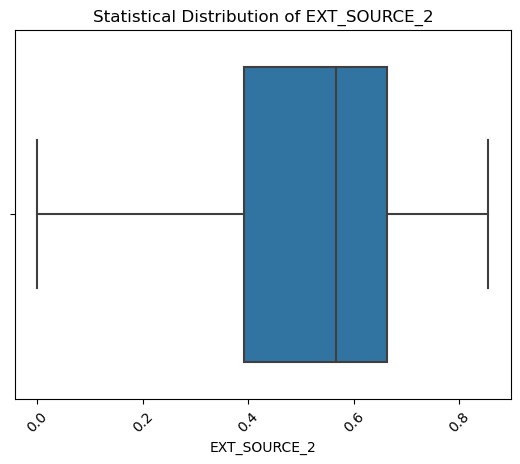

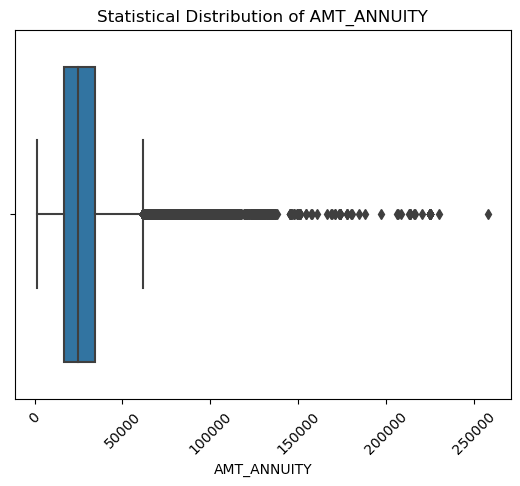

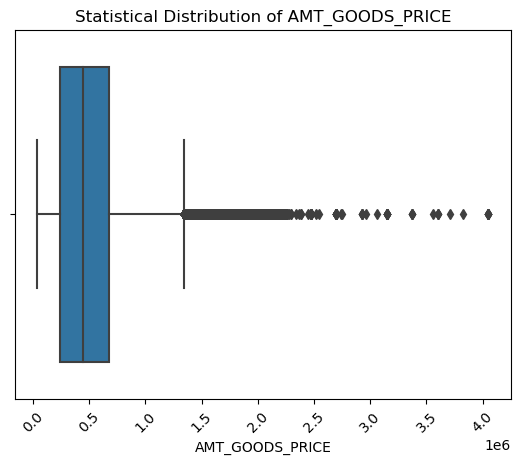

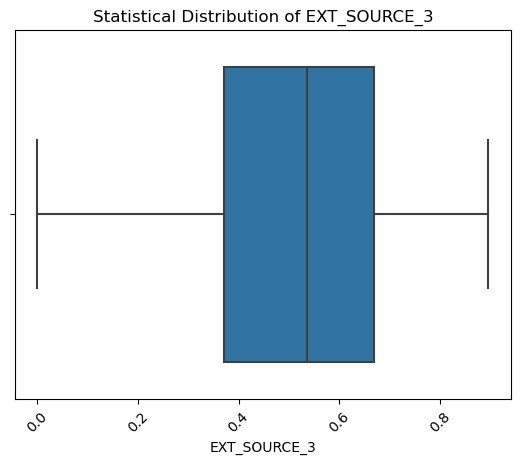

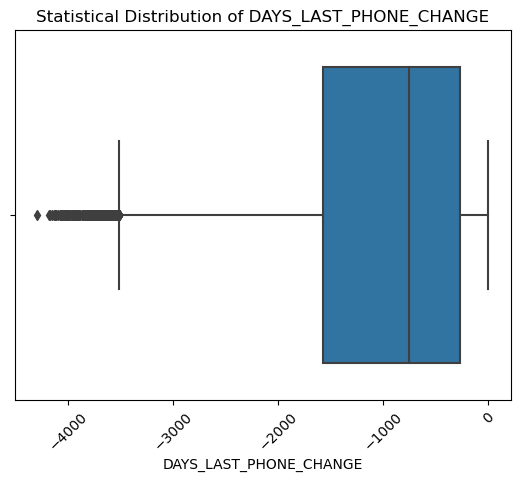

In [36]:
for i in miss_cont_cols:
    sns.boxplot(df[i])
    plt.xlabel(i)
    plt.title("Statistical Distribution of "+i)
    plt.xticks(rotation=45)
    plt.show()

## 🌹Inferences:
 - As we can see from boxplots of Continuous Columns with missing values, there are outliers. So, it's advisable to impute the missing values with Median rather than Mean.🌹


In [37]:
# Let's impute missing values in Continuous Columns with Median.
for i in miss_cont_cols:
    med=df[i].median()
    df[i].fillna(med, inplace=True)

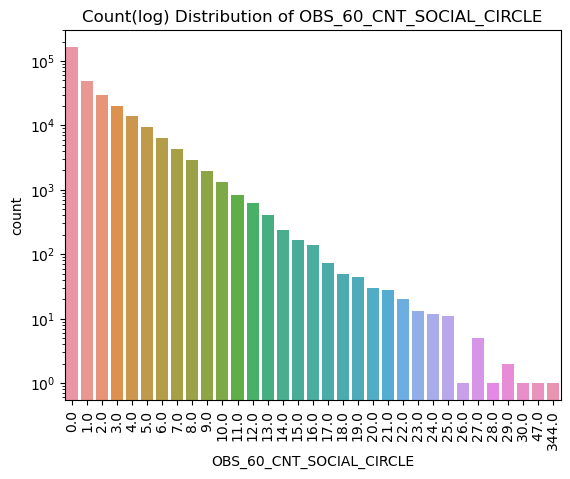

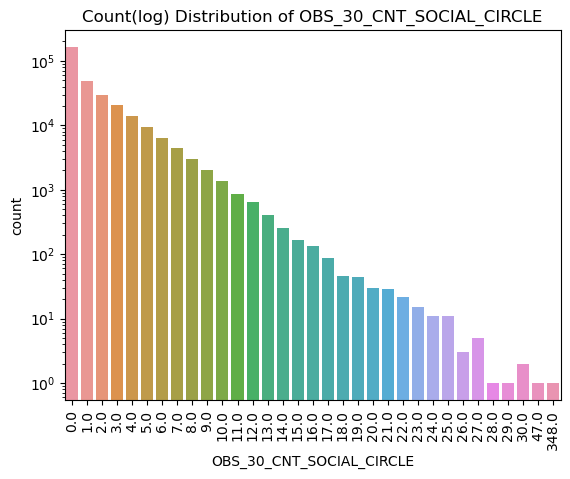

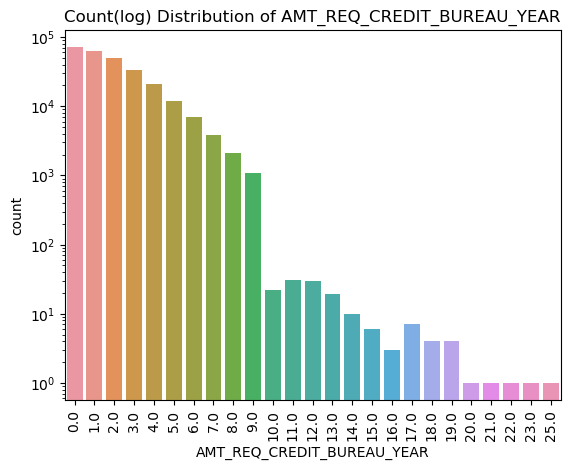

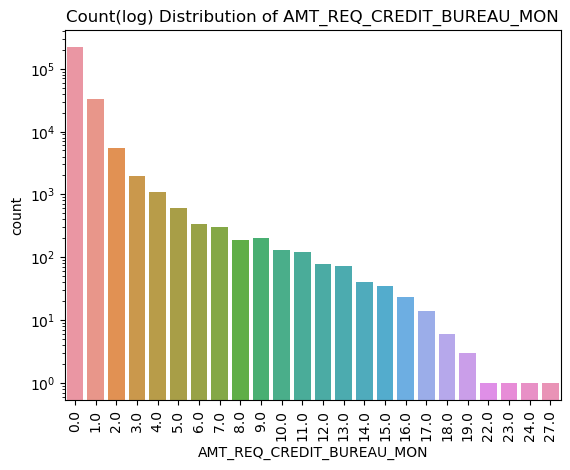

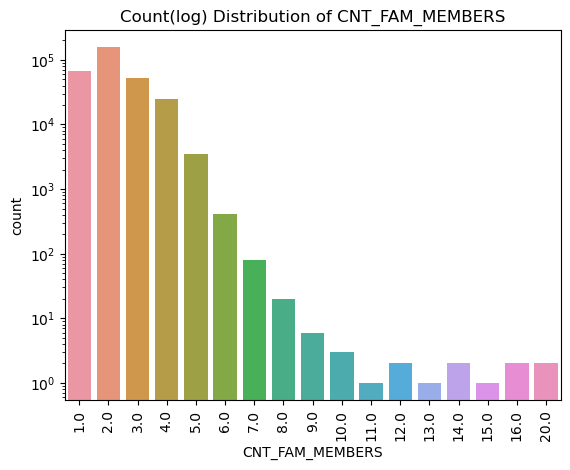

...

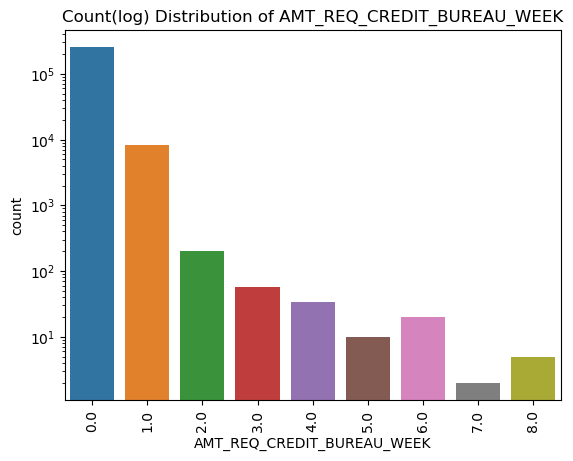

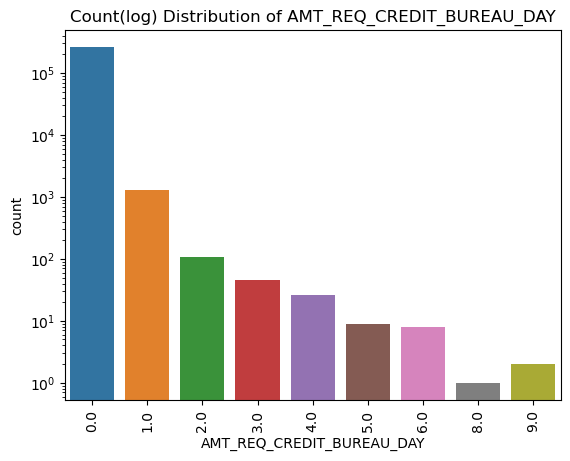

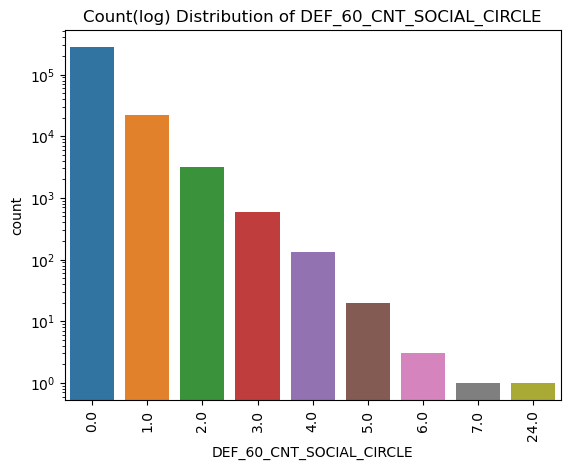

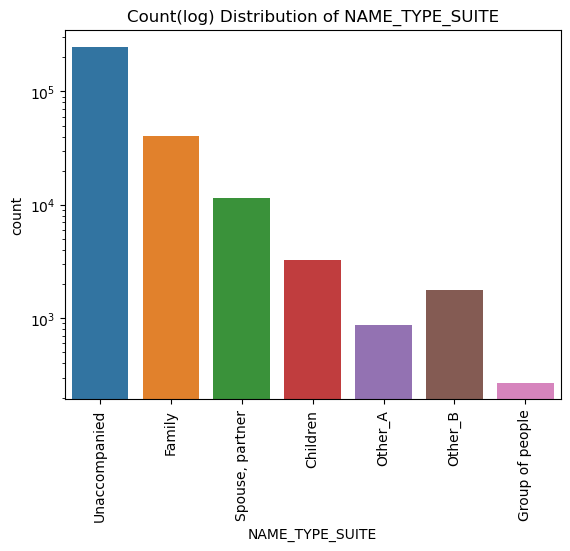

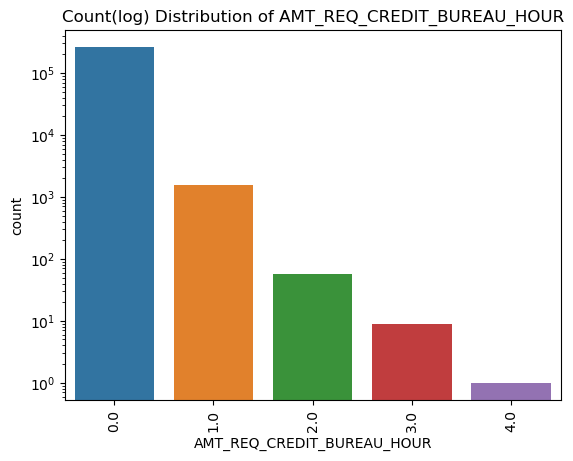

In [38]:
for i in miss_cat_cols:
    sns.countplot(df[i])
    plt.xlabel(i)
    plt.title("Count(log) Distribution of "+i)
    plt.xticks(rotation=90)
    plt.yscale('log')
    plt.show()

In [39]:
# By taking the inferences from Countplot, we can say that imputing missing values with the most frequent value i.e., mode is advisable.
for i in miss_cat_cols:
    mod=df[i].mode()[0]
    df[i].fillna(mod, inplace=True)

In [40]:
#Rechecking the Application Data for Null Values
miss_perc(df)

SK_ID_CURR                    0.0000
REG_REGION_NOT_LIVE_REGION    0.0000
LIVE_REGION_NOT_WORK_REGION   0.0000
REG_CITY_NOT_LIVE_CITY        0.0000
REG_CITY_NOT_WORK_CITY        0.0000
LIVE_CITY_NOT_WORK_CITY       0.0000
ORGANIZATION_TYPE             0.0000
EXT_SOURCE_2                  0.0000
EXT_SOURCE_3                  0.0000
OBS_30_CNT_SOCIAL_CIRCLE      0.0000
DEF_30_CNT_SOCIAL_CIRCLE      0.0000
OBS_60_CNT_SOCIAL_CIRCLE      0.0000
DEF_60_CNT_SOCIAL_CIRCLE      0.0000
DAYS_LAST_PHONE_CHANGE        0.0000
AMT_REQ_CREDIT_BUREAU_HOUR    0.0000
AMT_REQ_CREDIT_BUREAU_DAY     0.0000
AMT_REQ_CREDIT_BUREAU_WEEK    0.0000
AMT_REQ_CREDIT_BUREAU_MON     0.0000
AMT_REQ_CREDIT_BUREAU_QRT     0.0000
REG_REGION_NOT_WORK_REGION    0.0000
REGION_RATING_CLIENT_W_CITY   0.0000
TARGET                        0.0000
CNT_FAM_MEMBERS               0.0000
NAME_CONTRACT_TYPE            0.0000
CODE_GENDER                   0.0000
FLAG_OWN_REALTY               0.0000
CNT_CHILDREN                  0.0000
A

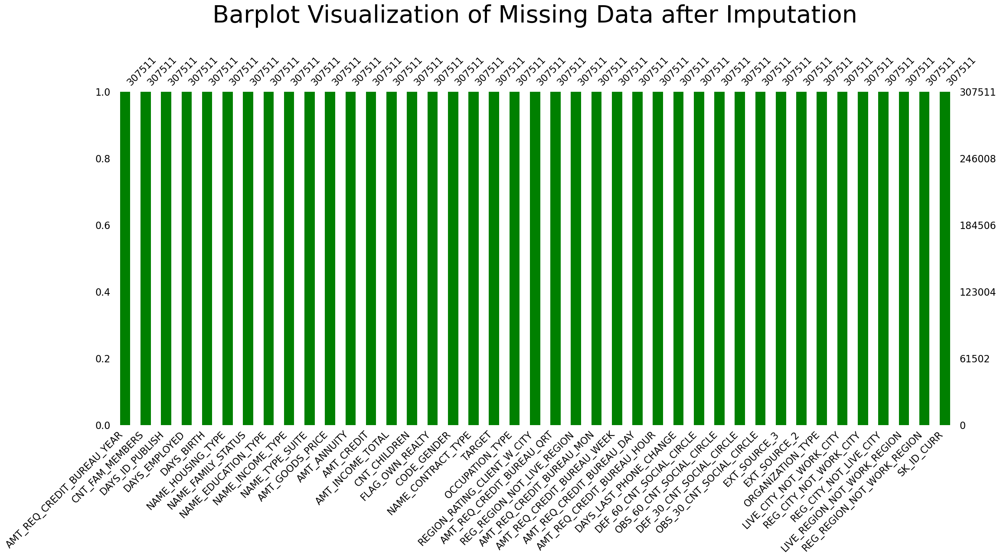

In [41]:
msno.bar(df, color = ('green'), sort = 'descending', fontsize=16)
plt.title('Barplot Visualization of Missing Data after Imputation\n', fontsize=40)
plt.show()

## 🌟Missing Value Treatment for the columns of Application Data with suitable value is completed.🌟

## Dealing with incorrect/negative values in the data

In [42]:
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,...,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000
mean,278180.5186,0.0807,0.4171,168797.9193,599025.9997,27108.4878,538316.2944,-16036.9951,63815.0459,-2994.2024,...,0.1429,1.4006,0.0997,-962.8581,0.0055,0.0061,0.0297,0.2313,0.2296,1.6434
std,102790.1753,0.2724,0.7221,237123.1463,402490.7770,14493.4611,369288.9822,4363.9886,141275.7665,1509.4504,...,0.4460,2.3772,0.3617,826.8072,0.0780,0.1030,0.1907,0.8568,0.7441,1.8558
min,100002.0000,0.0000,0.0000,25650.0000,45000.0000,1615.5000,40500.0000,-25229.0000,-17912.0000,-7197.0000,...,0.0000,0.0000,0.0000,-4292.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,189145.5000,0.0000,0.0000,112500.0000,270000.0000,16524.0000,238500.0000,-19682.0000,-2760.0000,-4299.0000,...,0.0000,0.0000,0.0000,-1570.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,278202.0000,0.0000,0.0000,147150.0000,513531.0000,24903.0000,450000.0000,-15750.0000,-1213.0000,-3254.0000,...,0.0000,0.0000,0.0000,-757.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
75%,367142.5000,0.0000,1.0000,202500.0000,808650.0000,34596.0000,679500.0000,-12413.0000,-289.0000,-1720.0000,...,0.0000,2.0000,0.0000,-274.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000
max,456255.0000,1.0000,19.0000,117000000.0000,4050000.0000,258025.5000,4050000.0000,-7489.0000,365243.0000,0.0000,...,34.0000,344.0000,24.0000,0.0000,4.0000,9.0000,8.0000,27.0000,261.0000,25.0000


## Observation: 
 - If the above description is observed, we can find negative values in the columns (DAYS_BIRTH, DAYS_EMPLOYED, DAYS_ID_PUBLISH, DAYS_LAST_PHONE_CHANGE)

In [43]:
# Let's change them into positive
neg_columns = ['DAYS_BIRTH','DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']
for i in neg_columns:
    df[i]=df[i].apply(lambda x: -x if x < 0 else x)

In [44]:
# Converting Days into Years
for i in neg_columns:
    df[i]=df[i].apply(lambda x : x/365)
# Renaming Columns
df.rename(columns={"DAYS_BIRTH":"YEARS_BIRTH",
                    "DAYS_EMPLOYED":"YEARS_EMPLOYED",
                    "DAYS_LAST_PHONE_CHANGE":"YEARS_LAST_PHONE_CHANGE",
                    "DAYS_ID_PUBLISH":"YEARS_ID_PUBLISH"},
                    inplace= True)

In [45]:
df.describe()
# We can see that all the negative values are changed to positive

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_ID_PUBLISH,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,...,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000
mean,278180.5186,0.0807,0.4171,168797.9193,599025.9997,27108.4878,538316.2944,43.9370,185.5472,8.2033,...,0.1429,1.4006,0.0997,2.6380,0.0055,0.0061,0.0297,0.2313,0.2296,1.6434
std,102790.1753,0.2724,0.7221,237123.1463,402490.7770,14493.4611,369288.9822,11.9561,382.0377,4.1355,...,0.4460,2.3772,0.3617,2.2652,0.0780,0.1030,0.1907,0.8568,0.7441,1.8558
min,100002.0000,0.0000,0.0000,25650.0000,45000.0000,1615.5000,40500.0000,20.5178,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,189145.5000,0.0000,0.0000,112500.0000,270000.0000,16524.0000,238500.0000,34.0082,2.5562,4.7123,...,0.0000,0.0000,0.0000,0.7507,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,278202.0000,0.0000,0.0000,147150.0000,513531.0000,24903.0000,450000.0000,43.1507,6.0795,8.9151,...,0.0000,0.0000,0.0000,2.0740,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
75%,367142.5000,0.0000,1.0000,202500.0000,808650.0000,34596.0000,679500.0000,53.9233,15.6356,11.7781,...,0.0000,2.0000,0.0000,4.3014,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000
max,456255.0000,1.0000,19.0000,117000000.0000,4050000.0000,258025.5000,4050000.0000,69.1205,1000.6658,19.7178,...,34.0000,344.0000,24.0000,11.7589,4.0000,9.0000,8.0000,27.0000,261.0000,25.0000


In [46]:
df["CNT_FAM_MEMBERS"].value_counts().index

Float64Index([ 2.0,  1.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0, 10.0, 14.0,
              12.0, 20.0, 16.0, 13.0, 15.0, 11.0],
             dtype='float64')

In [47]:
# For better readability, let's change float64 to int64
df["CNT_FAM_MEMBERS"] = df["CNT_FAM_MEMBERS"].astype("int64")
df["CNT_FAM_MEMBERS"].value_counts().index

Int64Index([2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 14, 12, 20, 16, 13, 15, 11], dtype='int64')

In [48]:
df["CNT_FAM_MEMBERS"].value_counts()

2     158359
1      67847
3      52601
4      24697
5       3478
6        408
7         81
8         20
9          6
10         3
14         2
12         2
20         2
16         2
13         1
15         1
11         1
Name: CNT_FAM_MEMBERS, dtype: int64

## Binning Columns

In [49]:
# Creating a Reusable User Defined function for Binning. Let's insert the new column to the df next to the old column
def bin_func(data, old_col, new_col):
    bins = [0,100000,200000,300000,400000,500000,600000,700000,800000,900000,1000000,5000000]
    grp = ['0-100K','100K-200K', '200K-300K','300K-400K','400K-500K','500K-600K','600K-700K','700K-800K',
       '800K-900K','900K-1M', '1M+']
    location =(list(data.columns).index(old_col))+1
    df_col = pd.cut(data[old_col],bins=bins,labels=grp)
    data.insert(location, new_col, df_col)

In [50]:
bin_func(df,'AMT_INCOME_TOTAL', 'AMT_INCOME_GRP')
bin_func(df,'AMT_CREDIT', 'AMT_CREDIT_GRP')
bin_func(df,'AMT_GOODS_PRICE', 'AMT_GOODS_PRICE_GRP')

In [51]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_INCOME_GRP,AMT_CREDIT,AMT_CREDIT_GRP,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,Y,0,202500.0000,200K-300K,406597.5000,400K-500K,...,2.0000,2.0000,2.0000,3.1068,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
1,100003,0,Cash loans,F,N,0,270000.0000,200K-300K,1293502.5000,1M+,...,0.0000,1.0000,0.0000,2.2685,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,100004,0,Revolving loans,M,Y,0,67500.0000,0-100K,135000.0000,100K-200K,...,0.0000,0.0000,0.0000,2.2329,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,100006,0,Cash loans,F,Y,0,135000.0000,100K-200K,312682.5000,300K-400K,...,0.0000,2.0000,0.0000,1.6904,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,100007,0,Cash loans,M,Y,0,121500.0000,100K-200K,513000.0000,500K-600K,...,0.0000,0.0000,0.0000,3.0301,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


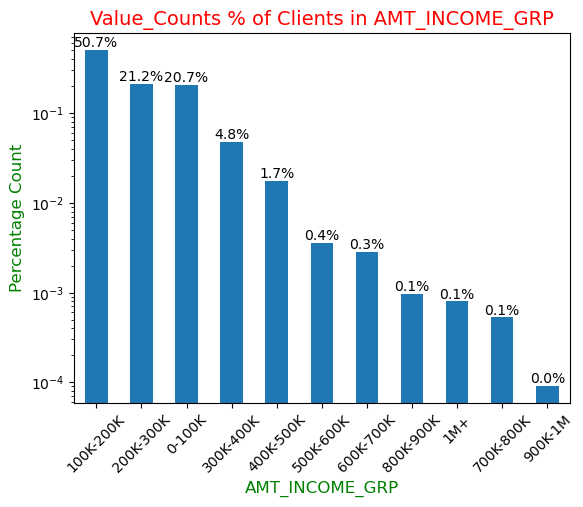

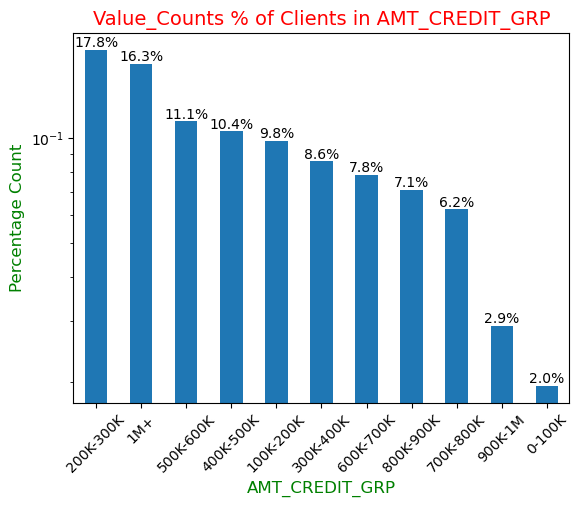

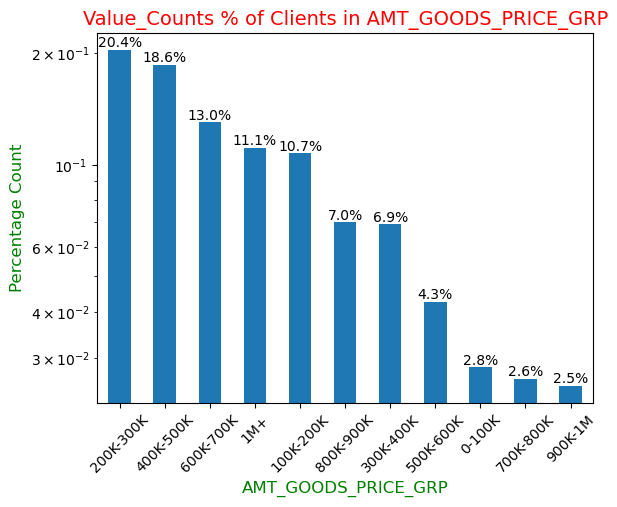

In [52]:
amt_col = ['AMT_INCOME_GRP','AMT_CREDIT_GRP', 'AMT_GOODS_PRICE_GRP']
for i in amt_col:
    ax=(df[i].value_counts(normalize=True)).plot.bar()
    plt.title('Value_Counts % of Clients in '+i, fontdict={'fontsize': 14, 'fontweight': 14, 'color': 'red'})
    plt.ylabel("Percentage Count",fontsize=12,color="green")
    plt.xlabel(i,fontsize=12,color="green")
    plt.xticks(rotation=45)
    plt.yscale('log')
    
    for p in ax.patches:
        percentage='{:.1f}%'.format(100*p.get_height())
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
    plt.show()


In [53]:
100*df['AMT_INCOME_GRP'].value_counts(normalize=True)

100K-200K   50.6975
200K-300K   21.1950
0-100K      20.7144
300K-400K    4.7726
400K-500K    1.7434
500K-600K    0.3561
600K-700K    0.2826
800K-900K    0.0969
1M+          0.0797
700K-800K    0.0527
900K-1M      0.0091
Name: AMT_INCOME_GRP, dtype: float64

## Inferences:
### From AMT_INCOME_GRP:
 - From the above barplot and value_counts, we can say that almost 50.7% of the loan applicants have their income range as 100K-200K
 - Very less i.e., 0.0091% of the loan applicants have their income range as 900K-1M
 - It's obvious that very few high income range people apply for loan. 
 - But, it's surprising to see that the applicants with >1M are more when compared to those with income range 700K-800K and 900K-1M

In [54]:
100*df['AMT_CREDIT_GRP'].value_counts(normalize=True)

200K-300K   17.8247
1M+         16.2547
500K-600K   11.1320
400K-500K   10.4185
100K-200K    9.8013
300K-400K    8.5649
600K-700K    7.8205
800K-900K    7.0866
700K-800K    6.2414
900K-1M      2.9030
0-100K       1.9525
Name: AMT_CREDIT_GRP, dtype: float64

## Inferences:
### From AMT_CREDIT_GRP:
 - From the above barplot and value_counts, we can say that almost 17.8%(highest) of the loan applicants applied for 200K-300K loan amount.
 - Very less i.e., 1.9525% of the loan applicants applied for <100K loan amount.
 - It's surprising to see that 16.25%(2nd highest) of the loan applicants applied for >1M loan amount.

In [55]:
100*df['AMT_GOODS_PRICE_GRP'].value_counts(normalize=True)

200K-300K   20.4094
400K-500K   18.6175
600K-700K   13.0155
1M+         11.0952
100K-200K   10.7170
800K-900K    6.9864
300K-400K    6.9002
500K-600K    4.2655
0-100K       2.8321
700K-800K    2.6373
900K-1M      2.5238
Name: AMT_GOODS_PRICE_GRP, dtype: float64

In [56]:
# Creating YEAR_BIRTH_RANGE column for readability
bins = [0,10,20,30,40,50,60,70,200]
range = ['0-10','10-20', '20-30', '30-40', '40-50', '50-60', '60-70','70+']
location =(list(df.columns).index('YEARS_BIRTH'))+1
year_col = pd.cut(df['YEARS_BIRTH'],bins=bins,labels=range)
df.insert(location, 'YEARS_BIRTH_RANGE', year_col)

In [57]:
bins = [0,5,10,15,20,25,30,35,40,45,50,100]
group = ['0-5', '5-10','10-15', '15-20', '20-25', '25-30', '30-35', '35-40', '40-45', '45-50', '50+']
loc =(list(df.columns).index('YEARS_EMPLOYED'))+1
emp_col = pd.cut(df['YEARS_EMPLOYED'],bins=bins,labels=group)
df.insert(loc, 'YEARS_EMPLOYED_RANGE', emp_col)

In [58]:
100*df['YEARS_BIRTH_RANGE'].value_counts(normalize=True)

30-40   26.7659
40-50   24.8905
50-60   22.1332
20-30   14.6405
60-70   11.5700
0-10     0.0000
10-20    0.0000
70+      0.0000
Name: YEARS_BIRTH_RANGE, dtype: float64

In [59]:
100*df['YEARS_EMPLOYED_RANGE'].value_counts(normalize=True)

0-5     54.0619
5-10    25.7291
10-15   10.9263
15-20    4.3029
20-25    2.4761
25-30    1.3120
30-35    0.7690
35-40    0.3300
40-45    0.0833
45-50    0.0095
50+      0.0000
Name: YEARS_EMPLOYED_RANGE, dtype: float64

In [60]:
# Now, let's update the lists of categorical and continuous columns as they are changed due to Binning activity.
cat_cols=['ORGANIZATION_TYPE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'AMT_REQ_CREDIT_BUREAU_MON', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE',
       'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'REGION_RATING_CLIENT_W_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'FLAG_OWN_REALTY', 'REG_CITY_NOT_WORK_CITY', 'CODE_GENDER',
       'REG_CITY_NOT_LIVE_CITY', 'NAME_CONTRACT_TYPE',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_WORK_REGION', 'TARGET',
       'REG_REGION_NOT_LIVE_REGION','AMT_INCOME_GRP','AMT_CREDIT_GRP', 'AMT_GOODS_PRICE_GRP',
          'YEARS_BIRTH_RANGE','YEARS_EMPLOYED_RANGE', "CNT_CHILDREN"]

cont_cols =['EXT_SOURCE_2', 'YEARS_BIRTH', 'AMT_ANNUITY',
       'YEARS_EMPLOYED', 'YEARS_ID_PUBLISH', 'AMT_CREDIT', 'AMT_INCOME_TOTAL',
       'AMT_GOODS_PRICE', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE']

## Outlier Analysis using (Kernel Distribution plot + Boxplot)

In [61]:
#Let's define a Reusable User defined function to check for outliers in some important columns
def kde_box_fn(dataset,column):
    plt.subplots(1,2 ,figsize = (10,3))
    plt.subplots_adjust(wspace=0.4,hspace=0.5)

    plt.subplot(1,2,1)
    sns.kdeplot(dataset[column], color = 'green', shade = True)
    plt.title('kdeplot of ' + column, color = 'red')
    plt.xticks(rotation=45)

    plt.subplot(1,2,2)
    red_d = dict(markerfacecolor='r', marker='D')
    sns.boxplot(y = column, data = dataset, flierprops = red_d)
    plt.title('Boxplot of ' + column, color = 'red')
    plt.show()

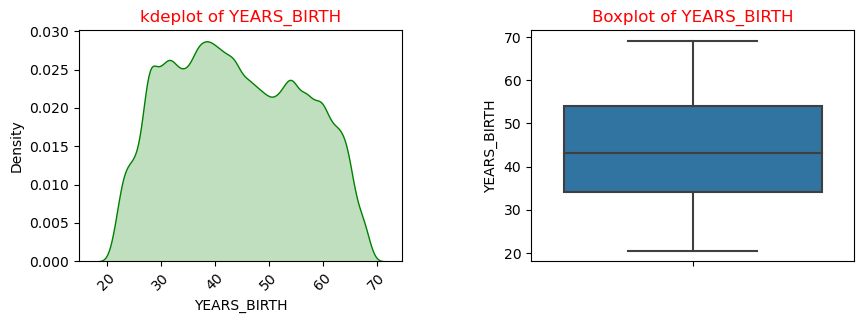

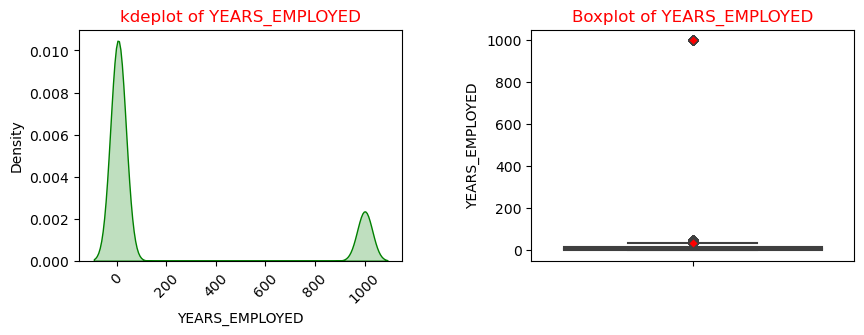

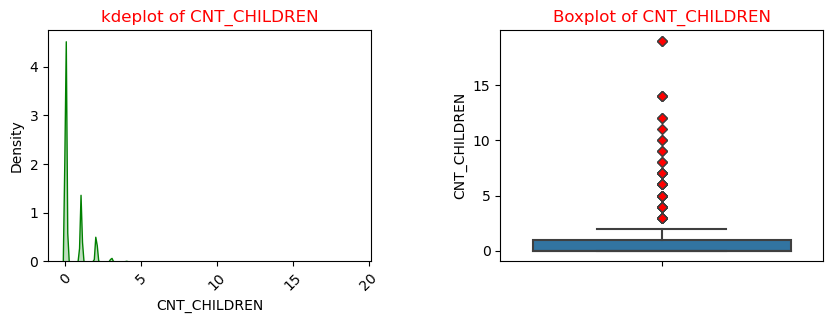

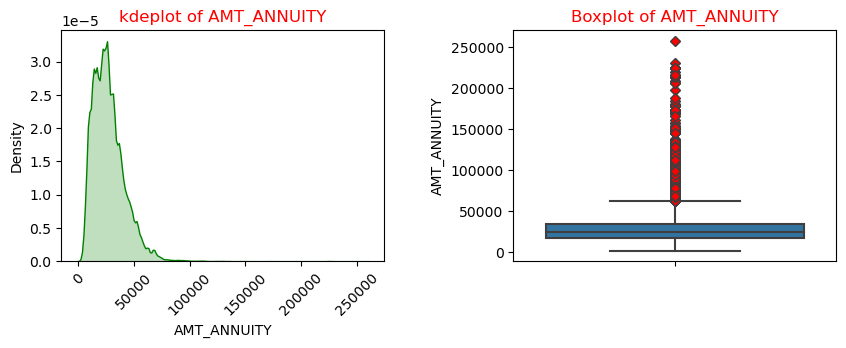

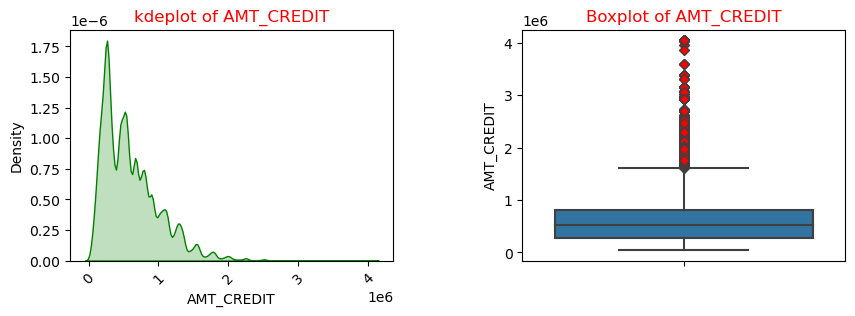

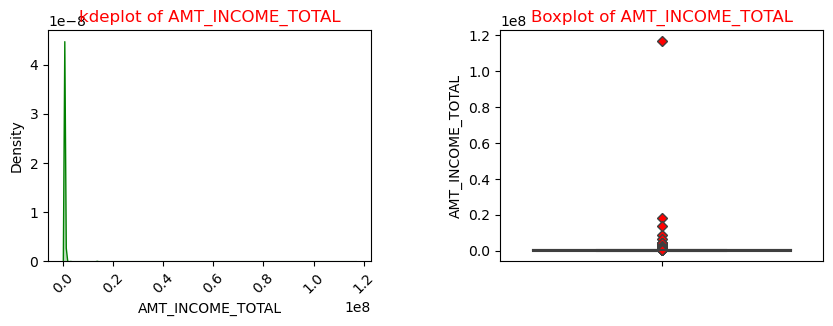

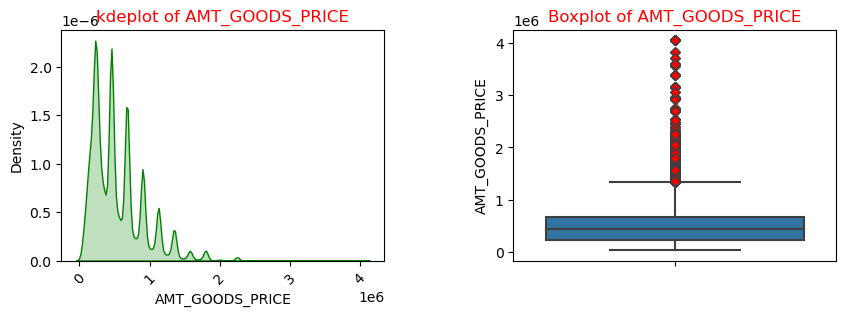

In [62]:
# Now, let's check outliers of the following columns visually using the User Defined function kde_box_fn(dataset,column)
outlier_columns = ['YEARS_BIRTH','YEARS_EMPLOYED','CNT_CHILDREN','AMT_ANNUITY','AMT_CREDIT', 'AMT_INCOME_TOTAL','AMT_GOODS_PRICE']
for i in outlier_columns:
    kde_box_fn(df,i)    

In [63]:
df[outlier_columns].describe()

,YEARS_BIRTH,YEARS_EMPLOYED,CNT_CHILDREN,AMT_ANNUITY,AMT_CREDIT,AMT_INCOME_TOTAL,AMT_GOODS_PRICE
count,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000,307511.0000
mean,43.9370,185.5472,0.4171,27108.4878,599025.9997,168797.9193,538316.2944
std,11.9561,382.0377,0.7221,14493.4611,402490.7770,237123.1463,369288.9822
min,20.5178,0.0000,0.0000,1615.5000,45000.0000,25650.0000,40500.0000
25%,34.0082,2.5562,0.0000,16524.0000,270000.0000,112500.0000,238500.0000
50%,43.1507,6.0795,0.0000,24903.0000,513531.0000,147150.0000,450000.0000
75%,53.9233,15.6356,1.0000,34596.0000,808650.0000,202500.0000,679500.0000
max,69.1205,1000.6658,19.0000,258025.5000,4050000.0000,117000000.0000,4050000.0000


## Observation: 
 - 'YEARS_BIRTH' is normalized fairly. It has no outliers.
 - The rest are not normalized and have outliers.
 - Maximum of YEARS_EMPLOYED is 1000.6658. It's not possible. Some wrong entry might have happened.
 - Maximum of CNT_CHILDREN is 19. I think it's not possible. Some wrong entry might have happen.
 - Outliers can be handled using Capping and Flooring method. 

## 🕵️‍♀️Data Analysis

### Checking imbalance for TARGET column

In [64]:
#Checking imbalance for TARGET column
df['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

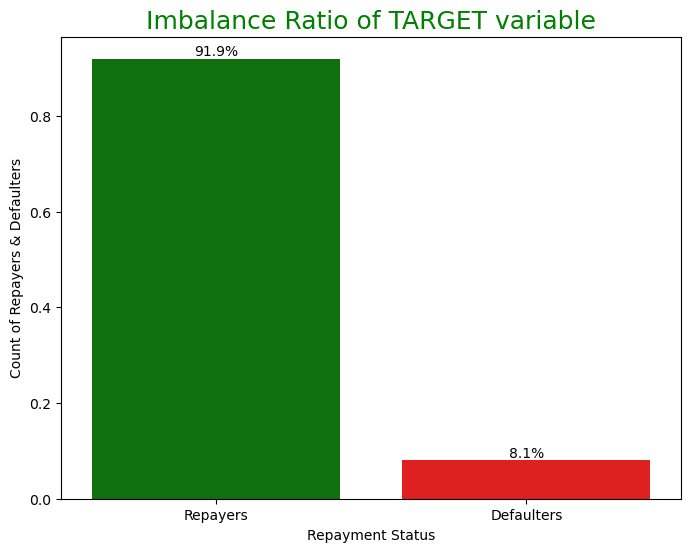

In [65]:
plt.figure(figsize=(8,6))
x= ['Repayers','Defaulters']
ax = sns.barplot(x,"TARGET",data = df["TARGET"].value_counts(normalize = True).reset_index(),palette= ['green','red'])
plt.xlabel("Repayment Status")
plt.ylabel("Count of Repayers & Defaulters")
plt.title("Imbalance Ratio of TARGET variable", color = 'green', fontsize=18)

for p in ax.patches:
    percentage='{:.1f}%'.format(100*p.get_height())
    x = p.get_x() + p.get_width()/2
    y = p.get_height()
    ax.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
plt.show()

## Observation:
 - It's clear from the above plot that there is imbalance in TARGET variable.
 - Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)
 - Almost 91.9% of the clients are Non-Defaulters and 8.1% are Defaulters

### Data Splitting w.r.t. TARGET Variable

In [66]:
#Let's create 2 new DataFrames for making Analysis easy
df1 = df[df['TARGET'] == 1] #New df with TARGET value 1

In [67]:
df0 = df[df['TARGET'] == 0] #New df with TARGET value 0

## Reusable Functions for complete Analysis of the Data

In [68]:
# Let's define a Reusable function to create countplot for Univariate Analysis-Categorical Columns
def uni_countplot(column, log_y=False, rot_ticks=False):
    plt.figure(figsize = [10,7])
    palt = sns.color_palette("bright")

    # subplot-1: Countplot of Defaulters
    plt.subplot(1,2,1)
    plt.title('Clients with payment difficulties', color='red', fontweight=15, fontsize=15)
    ax1 = sns.countplot(x = column, data = df1, order = sorted(df1[column].unique(), reverse = True), palette = palt)
    plt.ylabel('Count of Defaulters')
    total = len(df1[column])
        
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Defaulters' Count on log scale")
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90)
        plt.xlabel('')

    for p in ax1.patches: 
        percentage='{:.2f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax1.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    
    # subplot-2: Countplot of Repayers
    plt.subplot(1,2,2)
    plt.title('Clients with ontime payments', color='green', fontweight=15, fontsize=15)
    ax2 = sns.countplot(x = column, data = df0, order = sorted(df0[column].unique(), reverse = True), palette = palt)
    plt.ylabel('Count of Ontime Repayers')
    total = len(df0[column])
    
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Non-Defaulters' Count on log scale")
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90)
        plt.xlabel('')
        
    for p in ax2.patches: 
        percentage='{:.2f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax2.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    plt.tight_layout(pad = 4)
    plt.show()

In [69]:
# Let's define a Reusable function to create countplot for Univariate Analysis-Categorical Columns
def uni_countplot2(column, log_y=False, rot_ticks=False):
    plt.figure(figsize = [11,12])
    palt = sns.color_palette("bright")

    # subplot-1: Countplot of Defaulters
    plt.subplot(2,1,1)
    plt.title('Clients with payment difficulties', color='red', fontweight=15, fontsize=20)
    ax1 = sns.countplot(x = column, data = df1, order = sorted(df1[column].unique(), reverse = True), palette = palt)
    plt.ylabel('Count of Defaulters', fontsize = 15)
    total = len(df1[column])
        
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Defaulters' Count on log scale")
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90)
        plt.xlabel('')

    for p in ax1.patches: 
        percentage='{:.3f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax1.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    
    # subplot-2: Countplot of Repayers
    plt.subplot(2,1,2)
    plt.title('Clients with ontime payments', color='green', fontweight=15, fontsize=20)
    ax2 = sns.countplot(x = column, data = df0, order = sorted(df0[column].unique(), reverse = True), palette = palt)
    plt.ylabel('Count of Ontime Repayers', fontsize=15)
    total = len(df0[column])
    
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Non-Defaulters' Count on log scale")
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90)
        plt.xlabel('')
        
    for p in ax2.patches: 
        percentage='{:.3f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax2.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    plt.tight_layout(pad = 4)
    plt.show()

In [70]:
# Let's define a Reusable function to create pieplot for Univariate Analysis-Categorical Columns
def uni_piechart(column):
    plt.figure(figsize = [10,7])

    plt.subplot(1,2,1)
    plt.title('Clients with payment difficulties', color='red')
    df1[column].value_counts().plot.pie(autopct='%1.2f%%',shadow=True, startangle=60, colors = ['green','yellow','cyan','orange','red'],explode = (0,0.1), labeldistance=None)
    plt.legend()
    
    plt.subplot(1,2,2)
    plt.title('Clients with ontime payments', color='green')
    df0[column].value_counts().plot.pie(autopct='%1.2f%%',shadow=True, startangle=60, colors = ['green','yellow','cyan','orange','red'], explode = (0,0.1), labeldistance=None)
    
    plt.legend()
    plt.tight_layout(pad = 4)
    plt.show()

In [71]:
# Let's define a Reusable function to create pieplot for Univariate Analysis-Categorical Columns
def uni_piechart1(column):
    plt.figure(figsize = [10,7])

    plt.subplot(1,2,1)
    plt.title('Clients with payment difficulties', color='red')
    df1[column].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, startangle=60, colors = ['green','yellow','cyan','orange','red'], labeldistance=None)
    plt.legend()
    
    plt.subplot(1,2,2)
    plt.title('Clients with ontime payments', color='green')
    df0[column].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, startangle=60, colors = ['green','yellow','cyan','orange','red','blue'],  labeldistance=None)
    
    plt.legend()
    plt.tight_layout(pad = 4)
    plt.show()

In [72]:
# Let's define a Reusable function to create barplot for Univariate Analysis-Categorical Columns
def uni_barplot(column, log_y=False):
    plt.figure(figsize = [10,7])

    plt.subplot(1,2,1)
    (df1[column].value_counts(normalize=True)*100).plot.bar("Clients with Payment difficulties", color=['black', 'red', 'green', 'blue', 'cyan'])
    plt.xlabel('')
    plt.ylabel("% Defaulters")
    
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Defaulters' Count on log scale")


    plt.subplot(1,2,2)
    (df0[column].value_counts(normalize=True)*100).plot.bar('Clients with Ontime Payments', color=['black', 'red', 'green', 'blue', 'cyan'])
    plt.ylabel("% Non-Defaulters")
    plt.xlabel('')
    
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Non-Defaulters' Count on log scale")

        
    plt.tight_layout(pad = 4)
    plt.show()

In [73]:
# Let's define a Reusable function to create a boxplot for Bivariate Analysis - Categorical vs Continuous columns
def bi_boxplot(categorical, continuous, max_continuous1, max_continuous0, hue_column):
    plt.figure(figsize = [12,12])

    plt.subplot(2,1,1)
    plt.title('Clients with payment difficulties', color = 'red')
    blue_stone = dict(markerfacecolor='b', marker='D')
    sns.boxplot(x = categorical, 
                y = df1[df1[continuous] < max_continuous1][continuous], 
                data = df1, 
                flierprops = blue_stone, 
                order = sorted(df1[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df1[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.5,1), loc='upper right', borderaxespad=0)

    plt.subplot(2,1,2)
    plt.title('Clients with ontime payments', color = 'green')
    sns.boxplot(x = categorical, 
                y = df0[df0[continuous] < max_continuous0][continuous], 
                data = df0, 
                flierprops = blue_stone, 
                order = sorted(df0[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.5,1), loc='upper right', borderaxespad=0)

    plt.tight_layout(pad = 4)
    plt.show()

In [74]:
# Let's define a Reusable function to create a countplot for Bivariate Analysis - Categorical vs Categorical columns
def bi_countplot(column,hue_column, log_y=False, rot_ticks=False):
    plt.figure(figsize = [11,14])
    palt = sns.color_palette("bright")

    plt.subplot(2,1,1)
    plt.title('\nClients with payment difficulties\n', color= 'red', fontsize = 20)
    sns.countplot(x = column, data = df1, 
                  order = sorted(df1[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(df1[hue_column].unique(), reverse = True))
    plt.ylabel('Count of Defaulters', fontsize = 15)
        
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Defaulters' Count on log scale", fontsize = 15)
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90, fontsize=12)
        plt.xlabel('')
    plt.legend(bbox_to_anchor=(1.5, 1), loc='upper right', borderaxespad=0)
    
    plt.subplot(2,1,2)
    plt.title('Clients with ontime payments', color = 'green', fontsize=25)
    sns.countplot(x = column, data = df0, 
                  order = sorted(df0[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.ylabel('Count of Ontime Repayers', fontsize = 15)  
    
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Non-Defaulters' Count on log scale", fontsize = 15)
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90, fontsize = 12)
        plt.xlabel('')
    plt.legend(bbox_to_anchor=(1.5,1), loc='upper right', borderaxespad=0)

    
    plt.tight_layout(pad = 4)
    plt.show()

In [75]:
# Let's define a Reusable function to create a countplot for Univariate Analysis - Categorical columns of Merged Dataset
def uni_countplot_merge(column,log_y=False, rot_ticks=False):
    plt.figure(figsize = [7,7])
    palt = sns.color_palette("bright")
    plt.title('Data Analysis of ' + column)
    plt.xticks(fontsize = 12)
    ax3 = sns.countplot(x = column, data = merged_df, order = sorted(merged_df[column].unique(), reverse = True), palette = palt)
    total = len(merged_df[column])
        
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Count on log scale")
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90, fontsize = 12)
        plt.xlabel('')

    for p in ax3.patches: 
        percentage='{:.2f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax3.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

    plt.tight_layout(pad = 4)
    plt.show()

In [76]:
def uni_countplot2_merged(column, log_y=False, rot_ticks=False, patches = True):
    plt.figure(figsize = [12,13])
    palt = sns.color_palette("bright")

    # subplot-1: Countplot of Defaulters
    plt.subplot(2,1,1)
    plt.title('Clients with payment difficulties', color='red', fontweight=15, fontsize=20)
    ax_1 = sns.countplot(x = column, data = mdf1, order = sorted(mdf1[column].unique(), reverse = True), palette = palt, hue = 'NAME_CONTRACT_STATUS')
    plt.ylabel('Count of Defaulters', fontsize = 15)
    plt.xticks(fontsize=13)
    total = len(mdf1[column])
        
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Defaulters' Count on log scale", fontsize=15)
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90, fontsize=13)
        plt.xlabel('')
    plt.legend(bbox_to_anchor=(1.2, 1), loc='upper right', borderaxespad=0)
        
    if patches:
        for p in ax_1.patches:
            percentage='{:.2f}%'.format(100*p.get_height()/total)
            x = p.get_x() + p.get_width()/2
            y = p.get_height()
            ax_1.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    
    # subplot-2: Countplot of Repayers
    plt.subplot(2,1,2)
    plt.title('Clients with ontime payments', color='green', fontweight=15, fontsize=20)
    ax_2 = sns.countplot(x = column, data = mdf0, order = sorted(mdf0[column].unique(), reverse = True), palette = palt, hue = 'NAME_CONTRACT_STATUS')
    plt.ylabel('Count of Ontime Repayers', fontsize=15)
    plt.xticks(fontsize=13)
    total = len(mdf0[column])
    
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Non-Defaulters' Count on log scale", fontsize=15)
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90, fontsize=13)
        plt.xlabel('')
    plt.legend(bbox_to_anchor=(1.2, 1), loc='upper right', borderaxespad=0)
        
    if patches:
        for p in ax_2.patches:
            percentage='{:.2f}%'.format(100*p.get_height()/total)
            x = p.get_x() + p.get_width()/2
            y = p.get_height()
            ax_2.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    plt.tight_layout(pad = 4)
    plt.show()

In [77]:
# Let's define a Reusable function to create a piechart for Univariate Analysis - Categorical columns of Merged Dataset
def uni_piechart_merge(column):
    plt.figure(figsize = [10,6])

    pltname = 'Analysis of ' + column
    plt.title(pltname)
    merged_df[column].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, startangle=60, colors = ['steelblue','orange','red','cyan','yellow','cyan'], labeldistance=None)
    
    plt.legend()
    plt.tight_layout(pad = 4)
    plt.show()

In [78]:
# Let's define a Reusable function to create a boxplot for Bivariate Analysis - Categorical vs Continuous columns
def bi_boxplot_merged(categorical,continuous,max_continuous,hue_column):
    plt.figure(figsize = [10,6])
    red_diamond = dict(markerfacecolor='r', marker='D')

    sns.boxplot(x = categorical, 
                y = merged_df[merged_df[continuous] < max_continuous][continuous], 
                data = merged_df, 
                flierprops = red_diamond, 
                order = sorted(merged_df[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(merged_df[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(bbox_to_anchor=(1.5,1), loc='upper right', borderaxespad=0)

    plt.tight_layout(pad = 4)
    plt.show()

In [79]:
# Let's define a Reusable function to create a boxplot for Bivariate Analysis - Categorical vs Categorical columns of Merged Dataset
def bi_countplot_merge(column, hue_column, log_y=False, rot_ticks=False, patches = True):
    plt.figure(figsize = [10,7])
    palt = sns.color_palette("bright")

    ax4 = sns.countplot(x = column, data = merged_df, 
                  order = sorted(merged_df[column].unique()), palette = palt,
                  hue = hue_column, hue_order = sorted(merged_df[hue_column].unique(), reverse = True))
    total = len(merged_df[column])
   # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Count on log scale")
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90, fontsize = 12)
        plt.xlabel('')
        
    if patches:
        for p in ax4.patches:
            percentage='{:.2f}%'.format(100*p.get_height()/total)
            x = p.get_x() + p.get_width()/2
            y = p.get_height()
            ax4.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

    plt.tight_layout(pad = 4)
    plt.show()

## Univariate Analysis of Categorical Columns

In [80]:
df0['CODE_GENDER'].value_counts().sort_values(ascending = False)

F    188282
M     94404
Name: CODE_GENDER, dtype: int64

In [81]:
df1['CODE_GENDER'].value_counts().sort_values(ascending = False)

F    14170
M    10655
Name: CODE_GENDER, dtype: int64

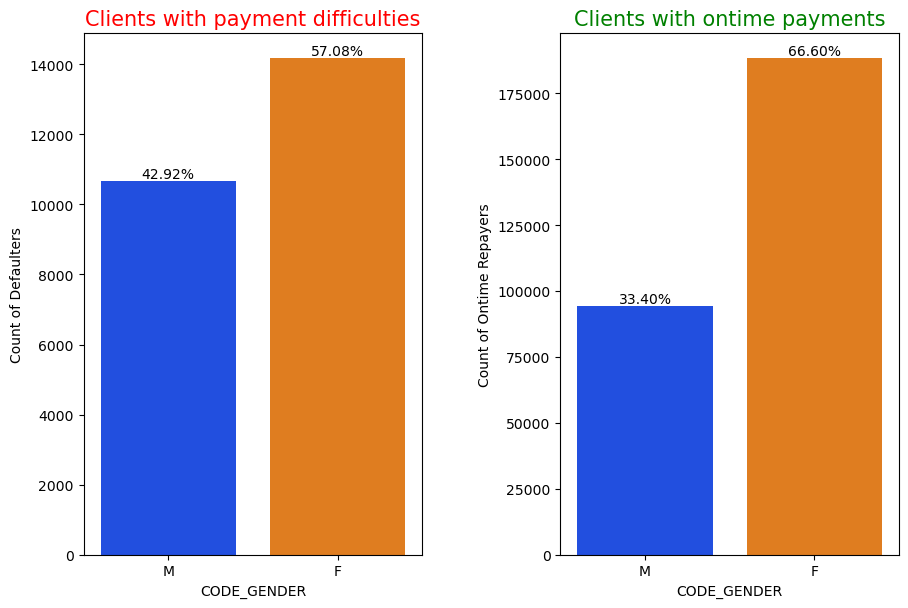

In [82]:
uni_countplot("CODE_GENDER")

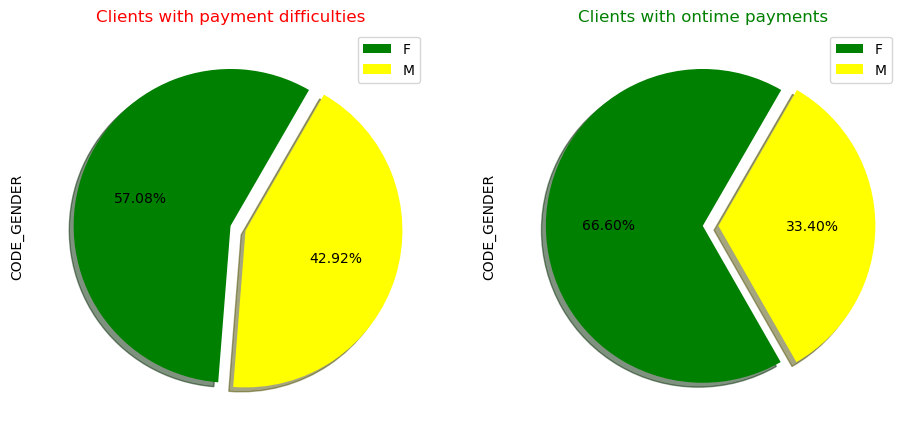

In [83]:
uni_piechart("CODE_GENDER")

### Observation:
 - With reference to the above plots, we can say that 57.1% of the clients with payment difficulties are females and 42.9% of those are males.
 - Almost 66.6% of the clients with ontime payments are females and 33.4% of those are males.
 - Male Clients have higher chances of not returning their loans.  

In [84]:
df0['NAME_CONTRACT_TYPE'].value_counts().sort_values(ascending = False)

Cash loans         255011
Revolving loans     27675
Name: NAME_CONTRACT_TYPE, dtype: int64

In [85]:
df1['NAME_CONTRACT_TYPE'].value_counts().sort_values(ascending = False)

Cash loans         23221
Revolving loans     1604
Name: NAME_CONTRACT_TYPE, dtype: int64

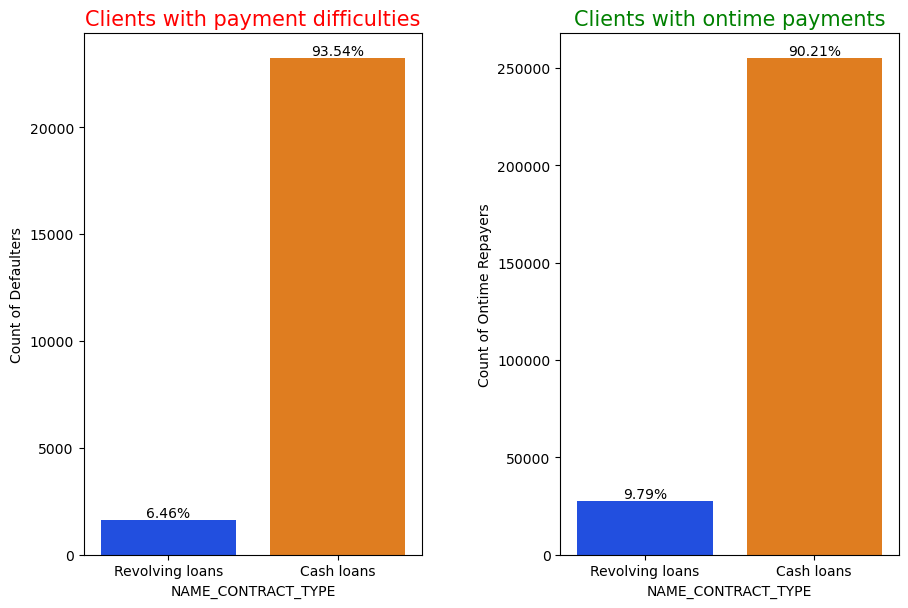

In [86]:
uni_countplot("NAME_CONTRACT_TYPE")

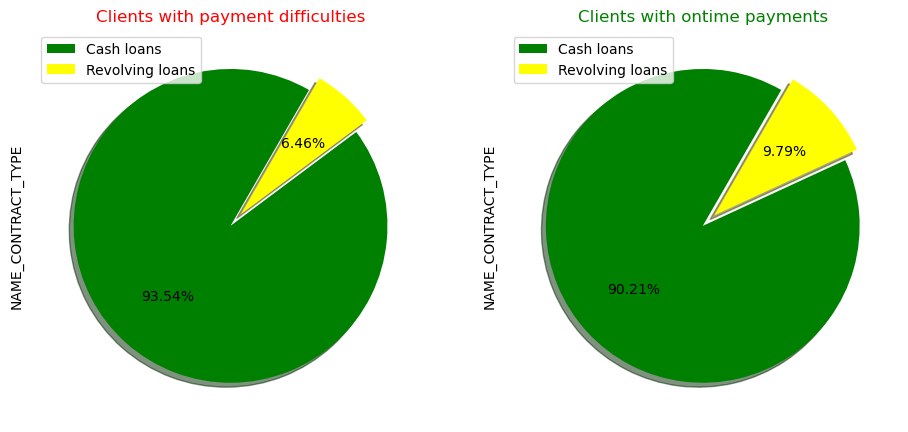

In [87]:
uni_piechart("NAME_CONTRACT_TYPE")

## Observation:
 - With reference to the above plots, we can infer that 93.5% of the Clients with payment difficulties and 90.2% of the Clients with ontime payment have taken cash loans.
 - So, we can say that majority of the clients have taken cash loans over revolving loans.
 - Also, we can say that there is higher defaulter rate in the case of the clients who have taken cash loans.

In [88]:
df0['NAME_INCOME_TYPE'].value_counts().sort_values(ascending = False)

Working                 143550
Commercial associate     66257
Pensioner                52380
State servant            20454
Student                     18
Unemployed                  14
Businessman                 10
Maternity leave              3
Name: NAME_INCOME_TYPE, dtype: int64

In [89]:
df1['NAME_INCOME_TYPE'].value_counts().sort_values(ascending = False)

Working                 15224
Commercial associate     5360
Pensioner                2982
State servant            1249
Unemployed                  8
Maternity leave             2
Name: NAME_INCOME_TYPE, dtype: int64

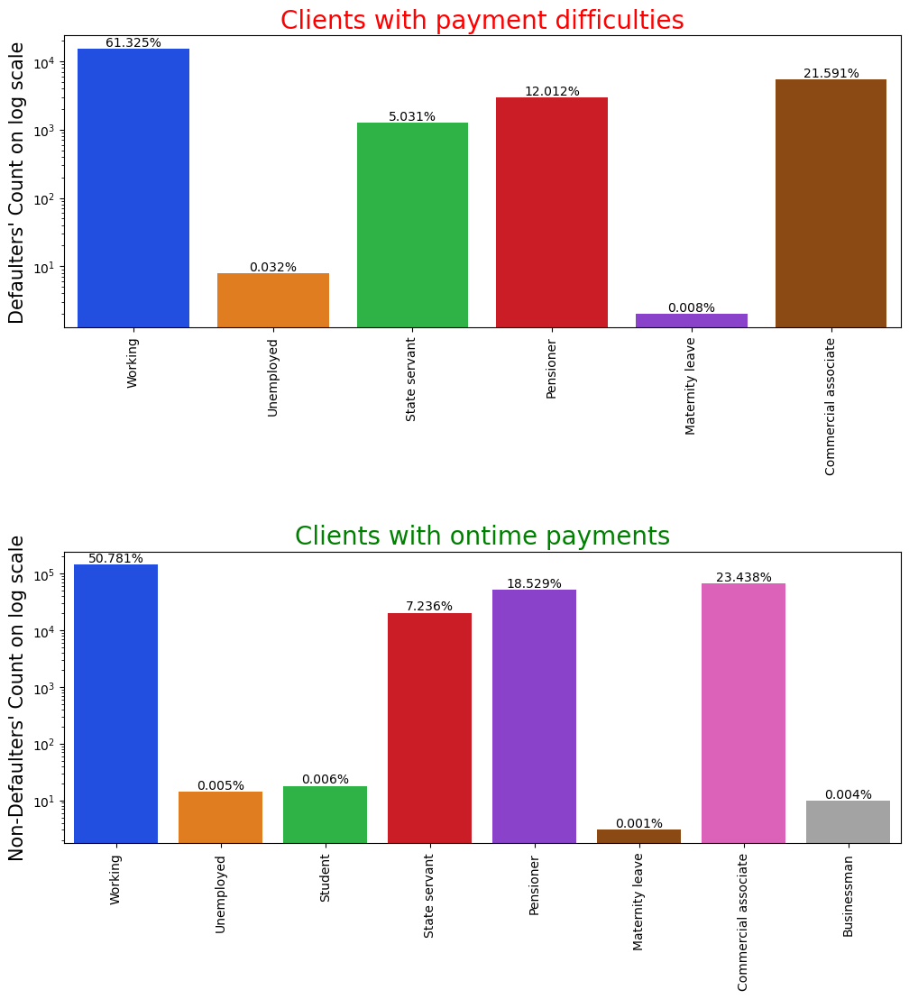

In [90]:
uni_countplot2("NAME_INCOME_TYPE", True, True)

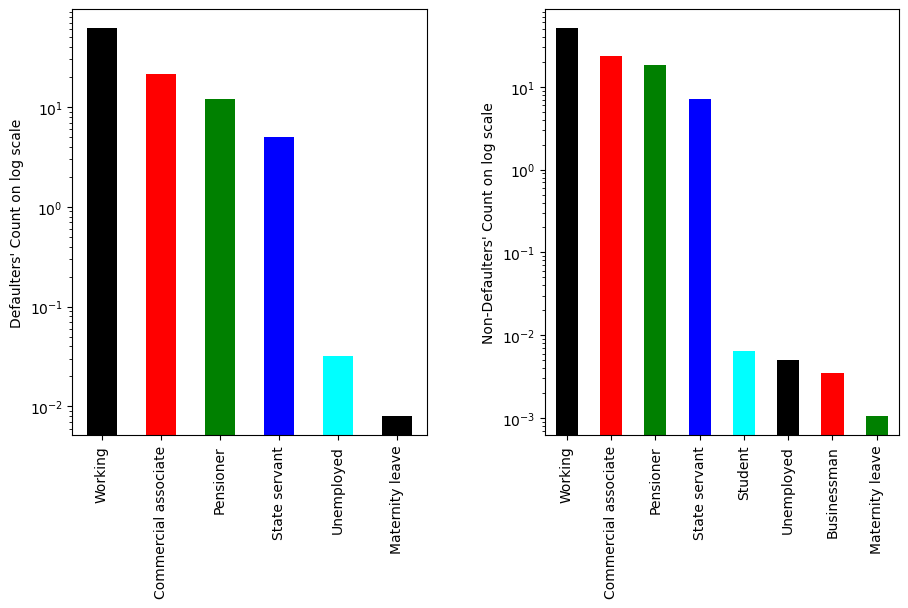

In [91]:
uni_barplot('NAME_INCOME_TYPE', True)

## Observation:
 - Working Clients have the highest payment difficulties and also with the highest ontime payments. So, most of the people who applied for loan are Working people.
 - Commercial Associates, Pensioners and State servants are making timely payments over facing payment difficulties.    
 - Also, we can say that there is higher defaulter rate in the case of Working People
 - We can also observe that Businessmen and Students are not facing any payment difficulties. So, it's safe to give more loans to Businessmen. We should think twice for students though they don't have Default record as they don't have income source.
 - Also, Pensioners, State Servants and Commercial Associates are facing comparatively less payment difficulties. 

In [92]:
df0['NAME_EDUCATION_TYPE'].value_counts().sort_values(ascending = False)

Secondary / secondary special    198867
Higher education                  70854
Incomplete higher                  9405
Lower secondary                    3399
Academic degree                     161
Name: NAME_EDUCATION_TYPE, dtype: int64

In [93]:
df1['NAME_EDUCATION_TYPE'].value_counts().sort_values(ascending = False)

Secondary / secondary special    19524
Higher education                  4009
Incomplete higher                  872
Lower secondary                    417
Academic degree                      3
Name: NAME_EDUCATION_TYPE, dtype: int64

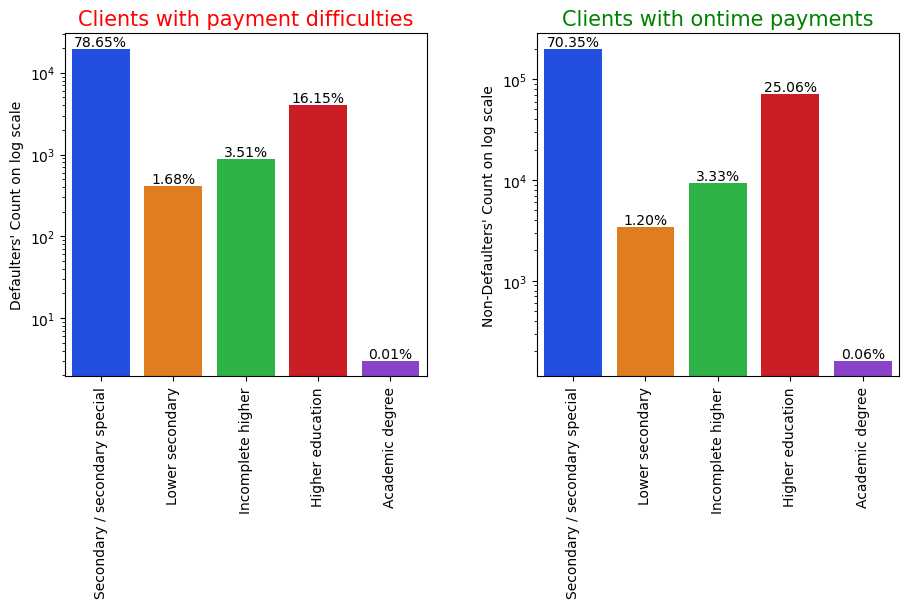

In [94]:
uni_countplot("NAME_EDUCATION_TYPE", True, True)

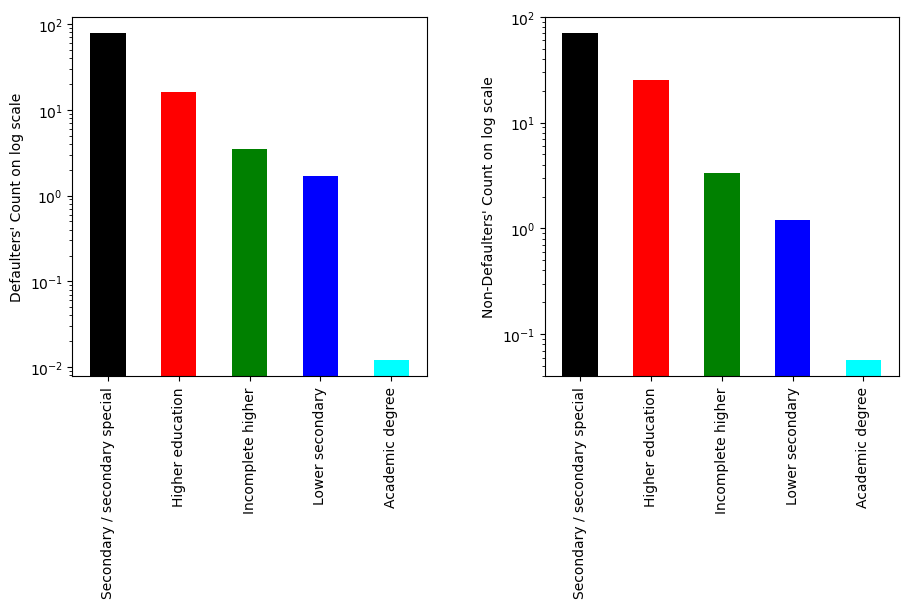

In [95]:
uni_barplot('NAME_EDUCATION_TYPE', True)

## Observation:
 - Clients with Secondary/secondary special education have the highest payment difficulties and making the highest ontime payments. So, the clients with Secondary/secondary special have taken more loans.
 - Clients with Higher education are making timely payments. Also, clients with Academic Degree are more likely to repay. So, we can consider Clients with Higher Education and with Academic Degree for loan approval.

In [96]:
df1['NAME_FAMILY_STATUS'].value_counts().sort_values(ascending = False)

Married                 14850
Single / not married     4457
Civil marriage           2961
Separated                1620
Widow                     937
Name: NAME_FAMILY_STATUS, dtype: int64

In [97]:
df0['NAME_FAMILY_STATUS'].value_counts().sort_values(ascending = False)

Married                 181584
Single / not married     40987
Civil marriage           26814
Separated                18150
Widow                    15151
Name: NAME_FAMILY_STATUS, dtype: int64

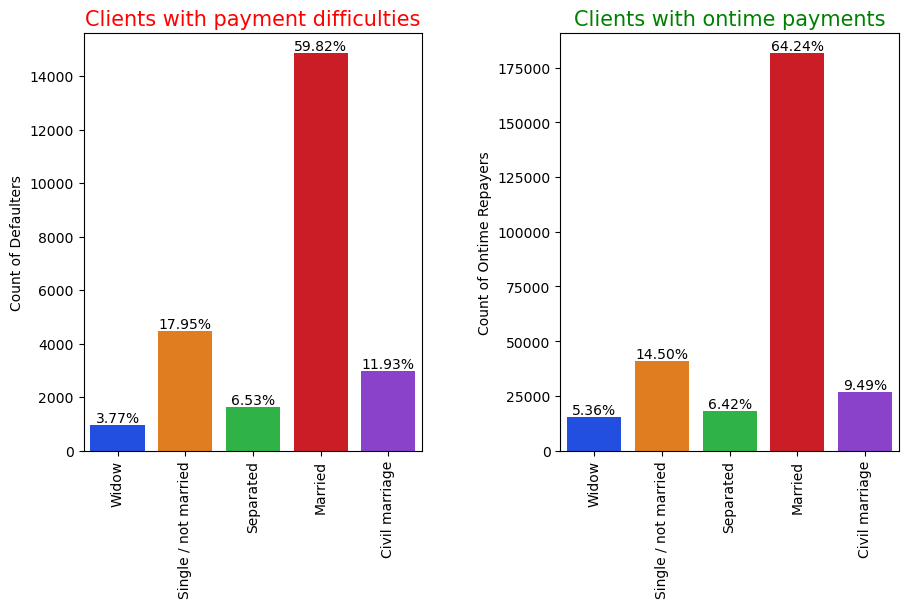

In [98]:
uni_countplot("NAME_FAMILY_STATUS", False, True)

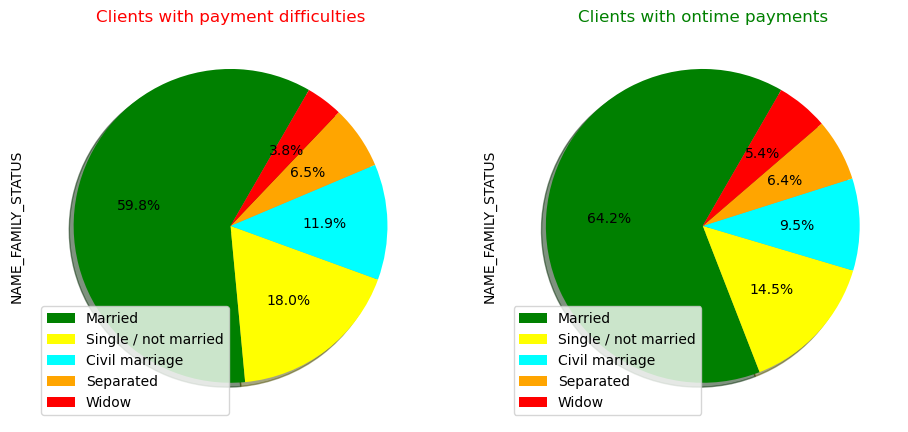

In [99]:
uni_piechart1("NAME_FAMILY_STATUS")

## Observation:
 - 59.8% of the Clients with Payment difficulties are Married. Even, 64.2% of the Clients with ontime payments are Married. Married Clients are making ontime payments. 
 - Clients who are Single/not married, and Civil marriage clients are facing more payment difficulties rather than making timely payments.
 - Widows also good repayment rate.

In [100]:
df1['OCCUPATION_TYPE'].value_counts().sort_values(ascending = False)

To_be_filled             6278
Laborers                 5838
Sales staff              3092
Drivers                  2107
Core staff               1738
Managers                 1328
Security staff            722
High skill tech staff     701
Cooking staff             621
Medicine staff            572
Accountants               474
Cleaning staff            447
Low-skill Laborers        359
Private service staff     175
Waiters/barmen staff      152
Secretaries                92
Realty agents              59
HR staff                   36
IT staff                   34
Name: OCCUPATION_TYPE, dtype: int64

In [101]:
df0['OCCUPATION_TYPE'].value_counts().sort_values(ascending = False)

To_be_filled             90113
Laborers                 49348
Sales staff              29010
Core staff               25832
Managers                 20043
Drivers                  16496
High skill tech staff    10679
Accountants               9339
Medicine staff            7965
Security staff            5999
Cooking staff             5325
Cleaning staff            4206
Private service staff     2477
Low-skill Laborers        1734
Secretaries               1213
Waiters/barmen staff      1196
Realty agents              692
HR staff                   527
IT staff                   492
Name: OCCUPATION_TYPE, dtype: int64

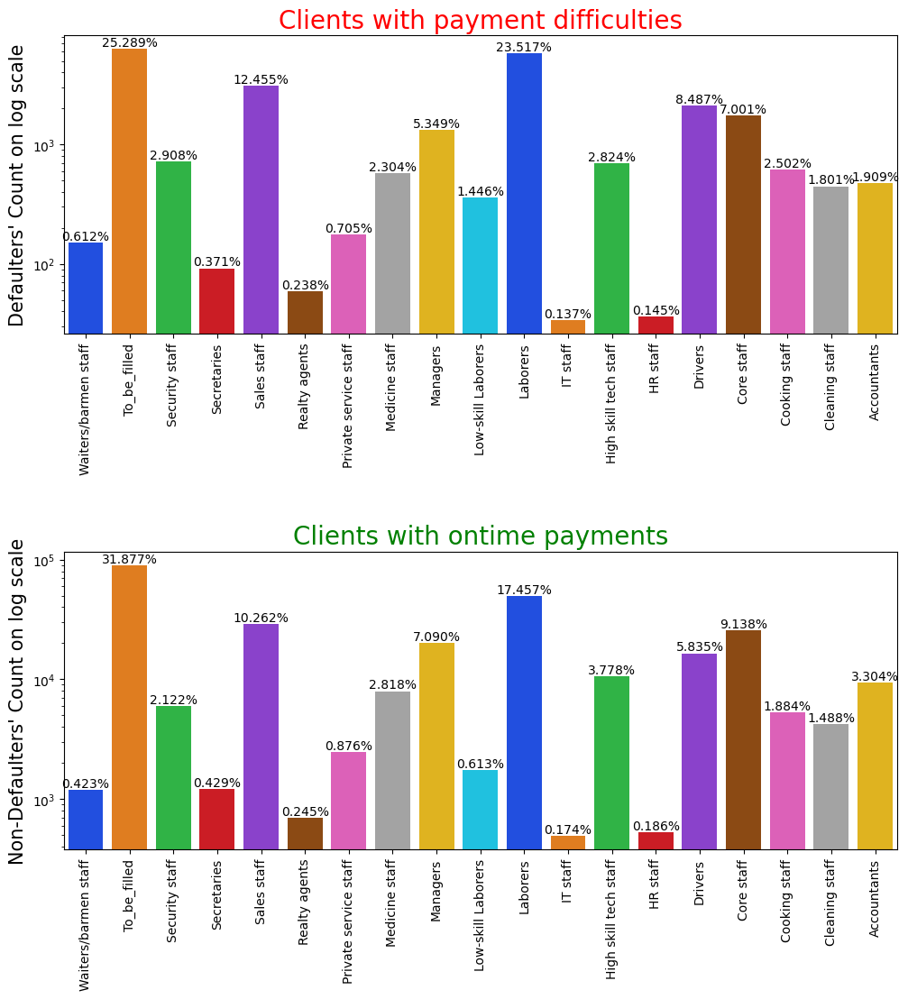

In [102]:
uni_countplot2("OCCUPATION_TYPE", True, True)

## Observation:
 - Majority of the Clients have not disclosed their occupation.
 - Laborers are facing more payment difficulties.
 - We can see that even Drivers, Cooking Staff and Sales staff are facing payment difficulties. But, compared to Laborers, the percentage is a bit lesser.
 - We can see that IT staff, High skill tech staff, HR staff and Secretaries are making timely repayments.
 - We can also see that Managers and Accountants have high repayment rate. 

In [103]:
df0['CNT_FAM_MEMBERS'].value_counts().sort_values(ascending = False)

2     146350
1      62172
3      47993
4      22561
5       3151
6        353
7         75
8         14
9          6
10         2
14         2
12         2
20         2
16         2
15         1
Name: CNT_FAM_MEMBERS, dtype: int64

In [104]:
df1['CNT_FAM_MEMBERS'].value_counts().sort_values(ascending = False)

2     12009
1      5675
3      4608
4      2136
5       327
6        55
7         6
8         6
10        1
13        1
11        1
Name: CNT_FAM_MEMBERS, dtype: int64

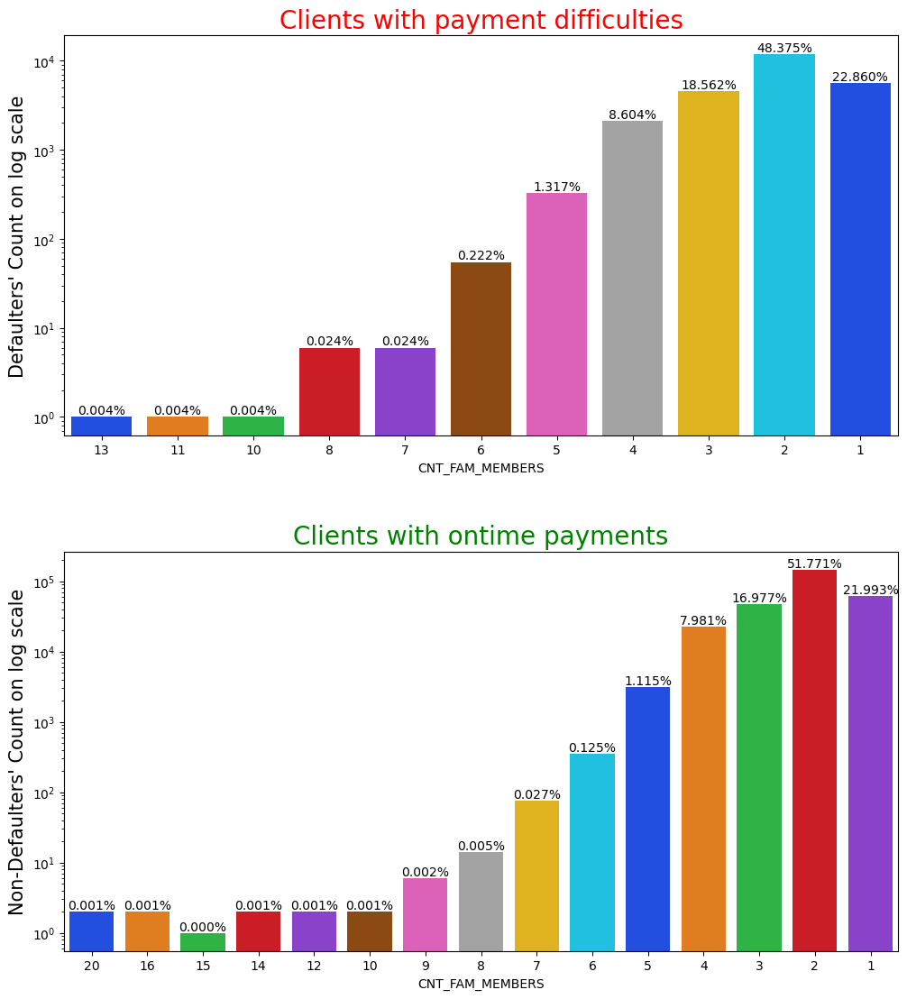

In [105]:
uni_countplot2("CNT_FAM_MEMBERS", True)

## Observation:
 - Majority of the Clients have a Family with 2 members and are likely to be making ontime payments.
 - Surprisingly Clients with 1 Family member are facing payment difficulties.

In [106]:
df0['CNT_CHILDREN'].value_counts().sort_values(ascending = False)

0     198762
1      55665
2      24416
3       3359
4        374
5         77
6         15
7          7
14         3
8          2
12         2
10         2
19         2
Name: CNT_CHILDREN, dtype: int64

In [107]:
df1['CNT_CHILDREN'].value_counts().sort_values(ascending = False)

0     16609
1      5454
2      2333
3       358
4        55
5         7
6         6
9         2
11        1
Name: CNT_CHILDREN, dtype: int64

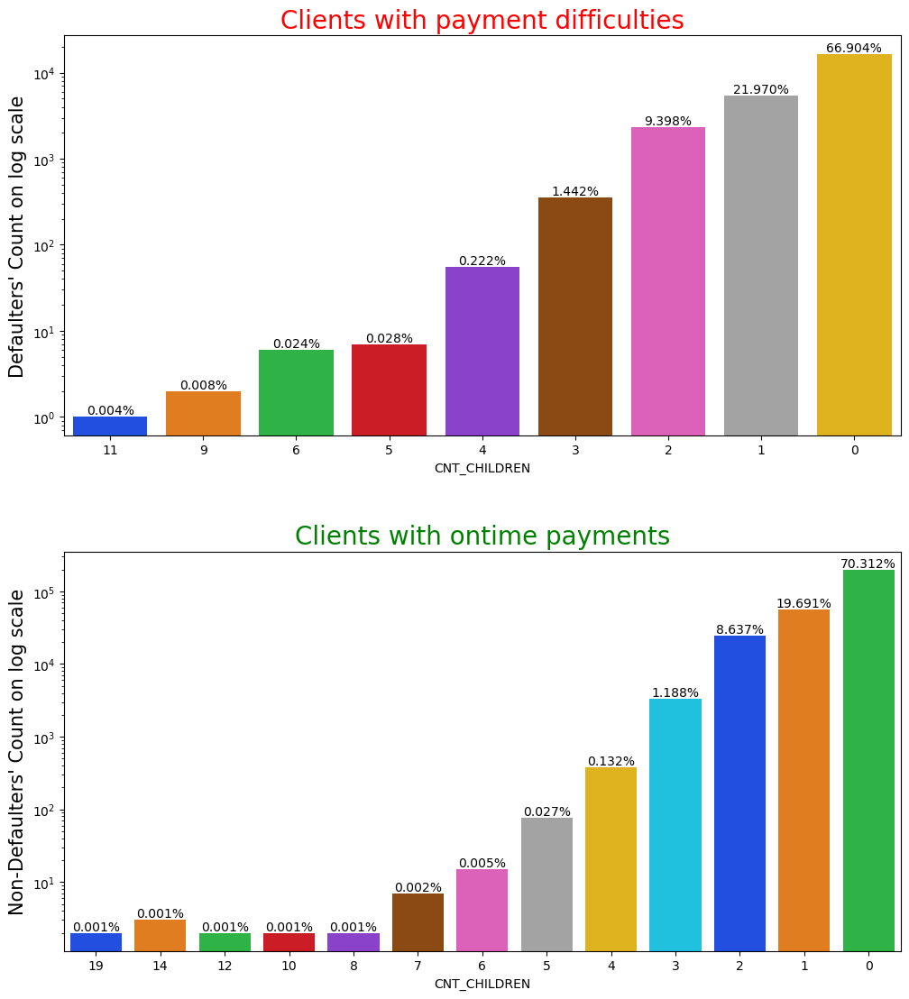

In [108]:
uni_countplot2('CNT_CHILDREN', True)

## Observation:
 - Majority of the Clients have a Family with no children
 - Clients with no children are more likely to make ontime repayments.

In [109]:
df0['YEARS_BIRTH_RANGE'].value_counts().sort_values(ascending = False)

30-40    74420
40-50    70685
50-60    63890
20-30    39863
60-70    33828
0-10         0
10-20        0
70+          0
Name: YEARS_BIRTH_RANGE, dtype: int64

In [110]:
df1['YEARS_BIRTH_RANGE'].value_counts().sort_values(ascending = False)

30-40    7888
40-50    5856
20-30    5158
50-60    4172
60-70    1751
0-10        0
10-20       0
70+         0
Name: YEARS_BIRTH_RANGE, dtype: int64

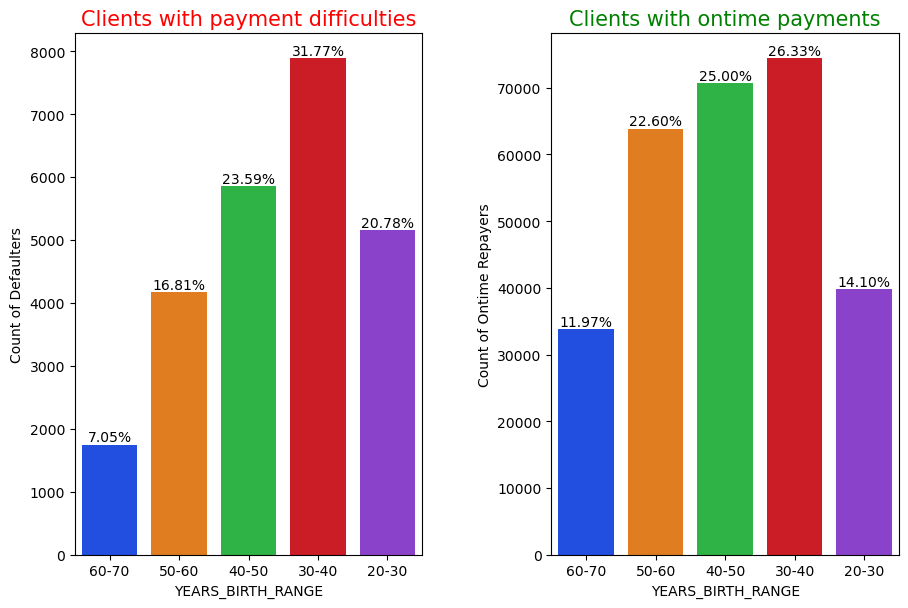

In [111]:
uni_countplot('YEARS_BIRTH_RANGE')

## Observation:
 - Clients of age groups 40-50, 50-60, 60-70 have high repayment rate.
 - Clients of agr group 20-30 are facing more payment difficulties. So, before approving loans to the people with age group 20-30, we should think twice.

In [112]:
df0['YEARS_EMPLOYED_RANGE'].value_counts().sort_values(ascending = False)

0-5      121900
5-10      60090
10-15     25958
15-20     10323
20-25      5946
25-30      3176
30-35      1859
35-40       816
40-45       209
45-50        24
50+           0
Name: YEARS_EMPLOYED_RANGE, dtype: int64

In [113]:
df1['YEARS_EMPLOYED_RANGE'].value_counts().sort_values(ascending = False)

0-5      14409
5-10      4782
10-15     1591
15-20      526
20-25      297
25-30      132
30-35       80
35-40       16
40-45        1
45-50        0
50+          0
Name: YEARS_EMPLOYED_RANGE, dtype: int64

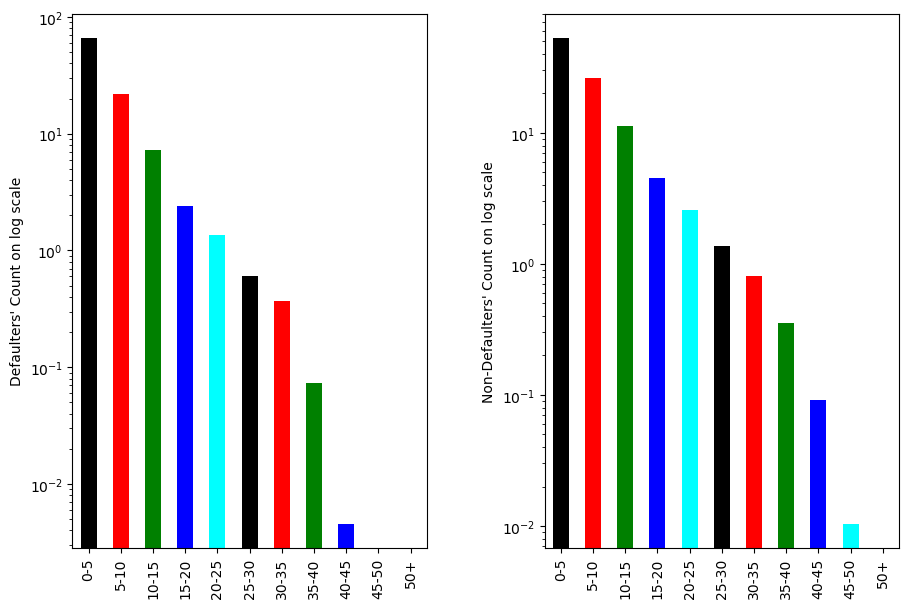

In [114]:
uni_barplot('YEARS_EMPLOYED_RANGE', True)

## Observations:
 - Most of the applicants are people who have 0-5 years of work experience. Also, they high default rate.

- With increase of employment experience, default rate is gradually decreasing.

In [115]:
df0['AMT_CREDIT_GRP'].value_counts().sort_values(ascending = False)

200K-300K    50492
1M+          47053
500K-600K    30709
400K-500K    28867
100K-200K    27981
300K-400K    23715
600K-700K    21952
800K-900K    20237
700K-800K    17727
900K-1M       8280
0-100K        5673
Name: AMT_CREDIT_GRP, dtype: int64

In [116]:
df1['AMT_CREDIT_GRP'].value_counts().sort_values(ascending = False)

200K-300K    4321
500K-600K    3523
400K-500K    3171
1M+          2932
300K-400K    2623
100K-200K    2159
600K-700K    2097
800K-900K    1555
700K-800K    1466
900K-1M       647
0-100K        331
Name: AMT_CREDIT_GRP, dtype: int64

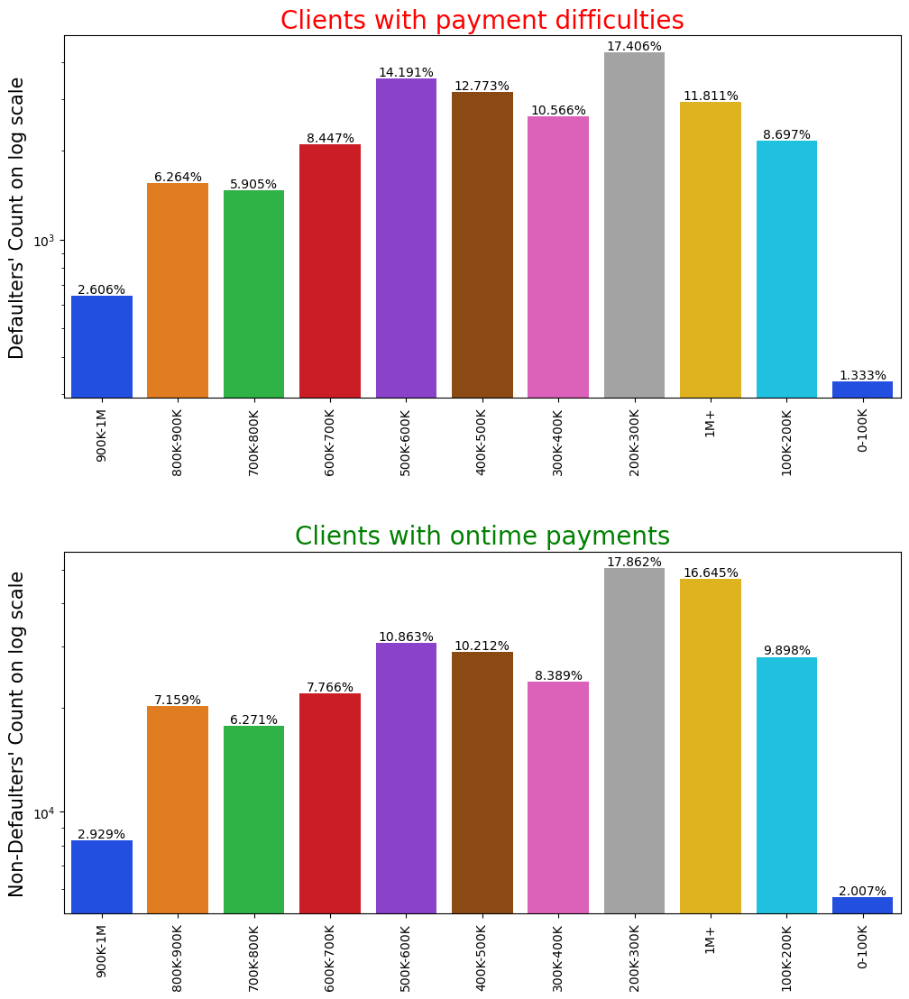

In [117]:
uni_countplot2("AMT_CREDIT_GRP", True, True)

## Observations:
 - Most applicants took loan for 200-300k amount.
 - 16% of applicants have taken loan for more than 1M
 - only 2% applicants took loan for less than 100k credit amount

In [118]:
df0['AMT_INCOME_GRP'].value_counts().sort_values(ascending = False)

100K-200K    142572
200K-300K     60255
0-100K        58473
300K-400K     13791
400K-500K      5039
500K-600K      1026
600K-700K       827
800K-900K       281
1M+             233
700K-800K       159
900K-1M          26
Name: AMT_INCOME_GRP, dtype: int64

In [119]:
df1['AMT_INCOME_GRP'].value_counts().sort_values(ascending = False)

100K-200K    13326
0-100K        5225
200K-300K     4921
300K-400K      885
400K-500K      322
500K-600K       69
600K-700K       42
800K-900K       17
1M+             12
700K-800K        3
900K-1M          2
Name: AMT_INCOME_GRP, dtype: int64

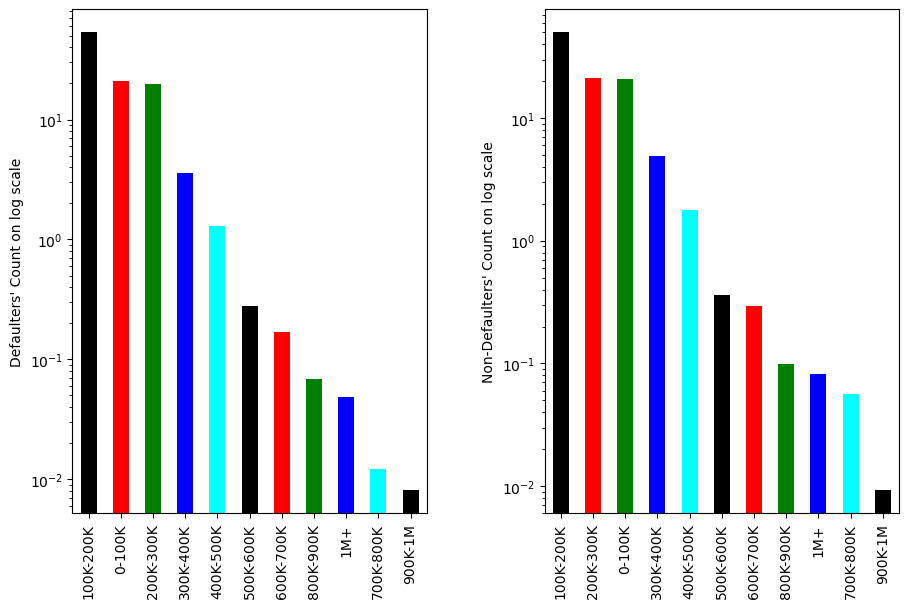

In [120]:
uni_barplot("AMT_INCOME_GRP", True)

## Observations:
 - Majority of the applicants have Income between 100-200K
 - People with Income less than 300K have high chances of defaulting.
 - Applicant with Income between 700K-800K are less likely to default.

# Bi/Multivariate Analysis

## Categorical vs Categorical

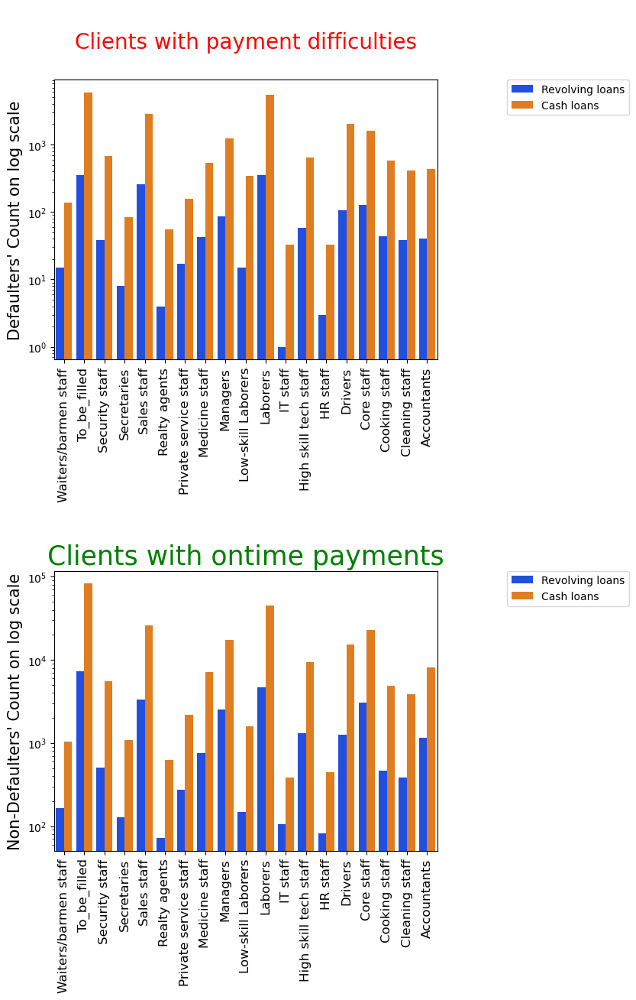

In [121]:
bi_countplot('OCCUPATION_TYPE','NAME_CONTRACT_TYPE',True, True)

## Observations

 - Clients who are Sales staff,Laborers,Drivers and have taken Cash loans are facing more Payment difficulties rather than doing ontime repayments.

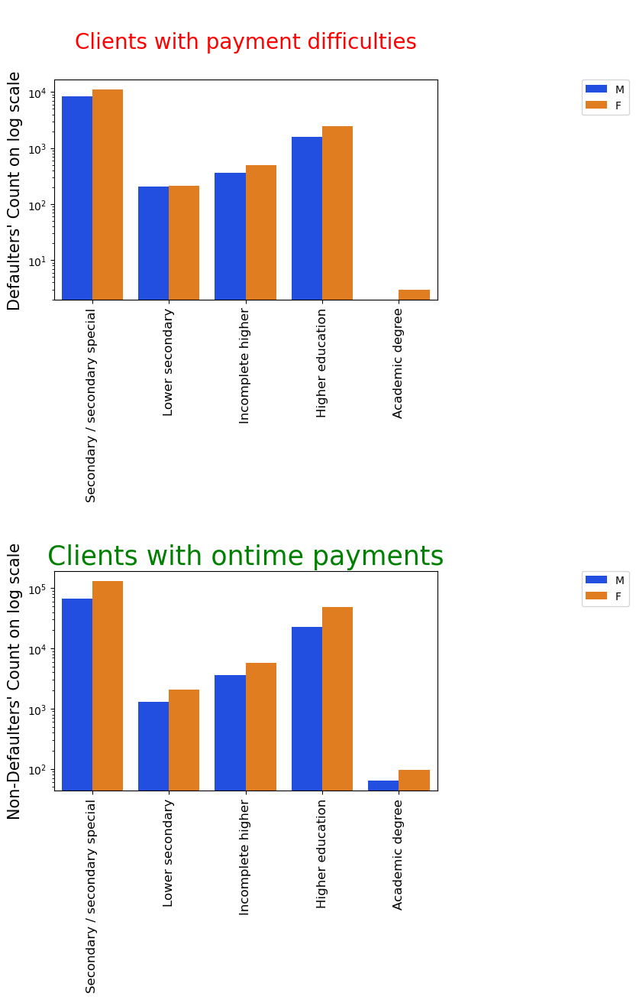

In [122]:
bi_countplot('NAME_EDUCATION_TYPE','CODE_GENDER',True, True)

## Observations
 - Male Clients who have Secondary/Secondary special education have more Payment difficulties rather than having ontime Payment record.
 - Female Clients who have Higher education have more On-Time Payments rather than having Payment difficulties

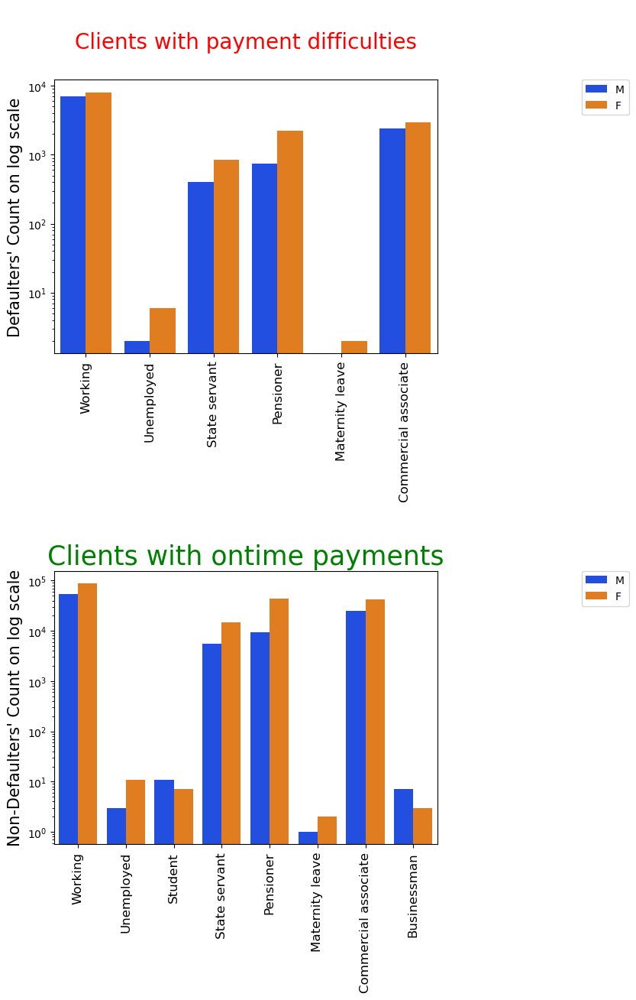

In [123]:
bi_countplot('NAME_INCOME_TYPE','CODE_GENDER',True, True)

## Inferences:
 - Clients who are Working and Male have more Payment difficulties rather than having Good repayment record.
 - Clients who are Pensioners and Females have more Payment difficulties rather than having Good repayment record.
 - Clients who are Businessmen and Students do their payments Ontime though their record count is low.

## Categorical vs Numerical

In [124]:
# Clients with payment difficulties
df1.groupby(by = ['NAME_EDUCATION_TYPE','CODE_GENDER']).AMT_CREDIT.describe().head()

count        mean         std         min  \
NAME_EDUCATION_TYPE CODE_GENDER                                                 
Academic degree     F              3.0000 950245.5000 504711.3753 544491.0000   
Higher education    F           2438.0000 648500.5816 410415.7034  47970.0000   
                    M           1571.0000 642070.9449 409695.9348  45000.0000   
Incomplete higher   F            504.0000 520150.3482 352227.4931  91692.0000   
                    M            368.0000 554723.8166 347843.7064  74628.0000   

                                        25%         50%          75%  \
NAME_EDUCATION_TYPE CODE_GENDER                                        
Academic degree     F           667660.5000 790830.0000 1153122.7500   
Higher education    F           323595.0000 545040.0000  877500.0000   
                    M           329202.0000 545040.0000  832797.0000   
Incomplete higher   F           269550.0000 450000.0000  675000.0000   
                    M           284400.0000 497520.0000  699976.1250   

                                         max  
NAME_EDUCATION_TYPE CODE_GENDER               
Academic degree     F           1515415.5000  
Higher education    F           2687355.0000  
                    M           2695500.0000  
Incomplete higher   F           2695500.0000  
                    M           2013840.0000

In [125]:
# Clients with ontime repayment record.
df0.groupby(by = ['NAME_EDUCATION_TYPE','CODE_GENDER']).AMT_CREDIT.describe().head()

count        mean         std  \
NAME_EDUCATION_TYPE CODE_GENDER                                      
Academic degree     F              97.0000 708770.7371 463052.4185   
                    M              64.0000 735235.3828 497739.9726   
Higher education    F           47852.0000 682485.0022 456642.7786   
                    M           23002.0000 713144.5438 486073.6605   
Incomplete higher   F            5780.0000 555340.5343 385980.5979   

                                        min         25%         50%  \
NAME_EDUCATION_TYPE CODE_GENDER                                       
Academic degree     F           130824.0000 354469.5000 607500.0000   
                    M            74182.5000 309519.0000 610056.0000   
Higher education    F            45000.0000 302206.5000 568057.5000   
                    M            45000.0000 315000.0000 592560.0000   
Incomplete higher   F            45000.0000 253737.0000 454500.0000   

                                         75%          max  
NAME_EDUCATION_TYPE CODE_GENDER                            
Academic degree     F           1006920.0000 2463840.0000  
                    M           1036890.0000 1984500.0000  
Higher education    F            916470.0000 4050000.0000  
                    M            973503.0000 4050000.0000  
Incomplete higher   F            760225.5000 2517300.0000

In [126]:
def max_min(dataset,column):
    Q1 = dataset[column].quantile(0.25)
    Q3 = dataset[column].quantile(0.75)
    IQR = Q3 - Q1
    Min_value = (Q1 - 1.5 * IQR)
    Max_value = (Q3 + 1.5 * IQR)
    return Max_value

In [127]:
max0_AMT_CREDIT = max_min(df0,'AMT_CREDIT')

In [128]:
max1_AMT_CREDIT = max_min(df1,'AMT_CREDIT')

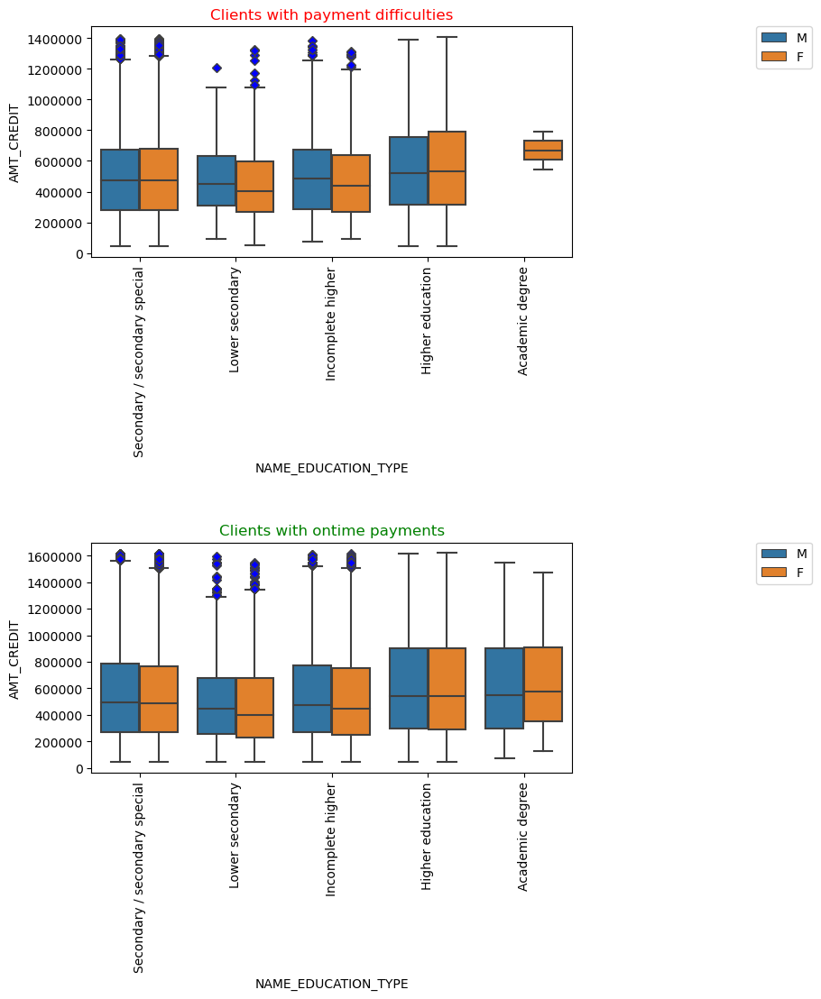

In [129]:
bi_boxplot('NAME_EDUCATION_TYPE','AMT_CREDIT',max1_AMT_CREDIT,max0_AMT_CREDIT,'CODE_GENDER')

## Observations

 - Clients with Academic Degree have a wide range of credit amount for ontime repayments whereas the range is much lower for Defaulters.
 - Clients with Academic Degree and Payment difficulties take mean and median credit at a much higher range than Non-Defaulters.
 - Male clients with Academic Degree have good repayment record.

## Numerical vs Numerical

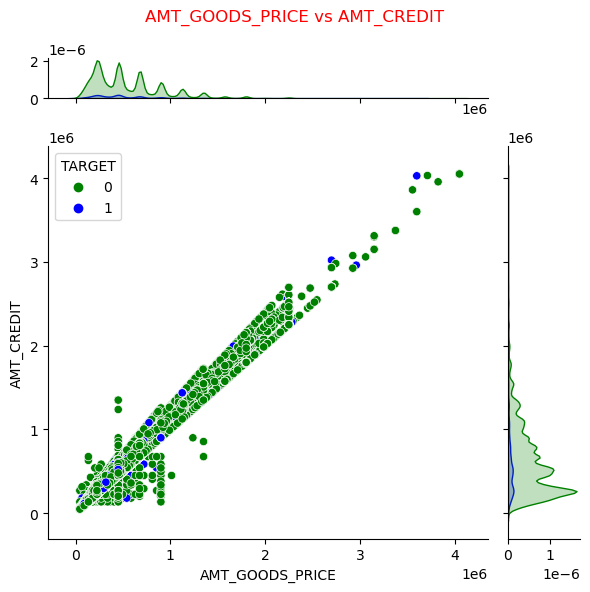

In [130]:
#Let's create relation b/w Goods Price and Credit Amount.
p = sns.jointplot(x = 'AMT_GOODS_PRICE',y = 'AMT_CREDIT',data=df,hue="TARGET", marginal_ticks = True, palette = ['g', 'b'])
p.fig.suptitle('AMT_GOODS_PRICE vs AMT_CREDIT', color = 'r')
p.fig.tight_layout()
plt.show()
#Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)

## Insights:
 - AMT_CREDIT and AMT_GOODS_PRICE are highly correlated i.e., if Goods price is more, the Credit amount also increases
 - The Non-Defaulters' rate is more when the AMT_CREDIT > 3M
 - But most defaulters exist below 2M but the defaulter percentage is very low

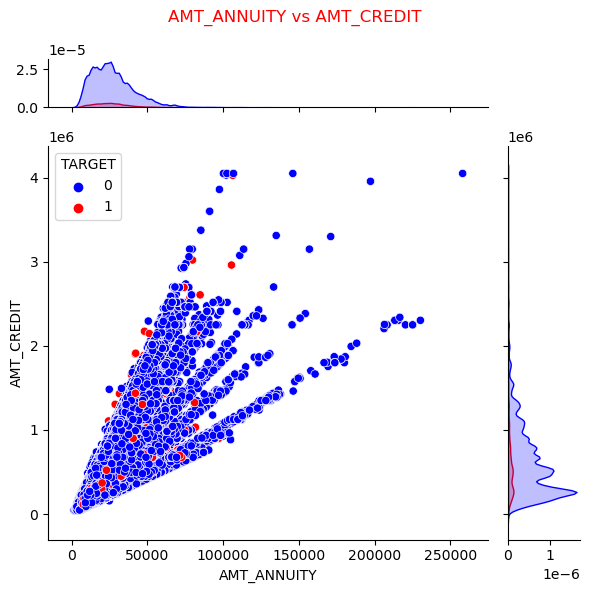

In [131]:
#Let's create relation b/w Annuity and Credit Amount.
q = sns.jointplot(x = 'AMT_ANNUITY',y = 'AMT_CREDIT',data=df,hue="TARGET", marginal_ticks = True,  palette = ['b', 'r'])
q.fig.suptitle('AMT_ANNUITY vs AMT_CREDIT', color = 'r')
q.fig.tight_layout()
plt.show()
#Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)

## Insights:
 - There is a fair correlation between the two columns Amount Annuity & Amount Credit. 
 - We can find more Defaulters when the Credit Amount is less than 3M.
 - Most of the defaulters have Annuity values less than 100,000.
 - We can find less defaulters when the credit amount is greater than 3M and Annuity is greater than or equal to 100,000

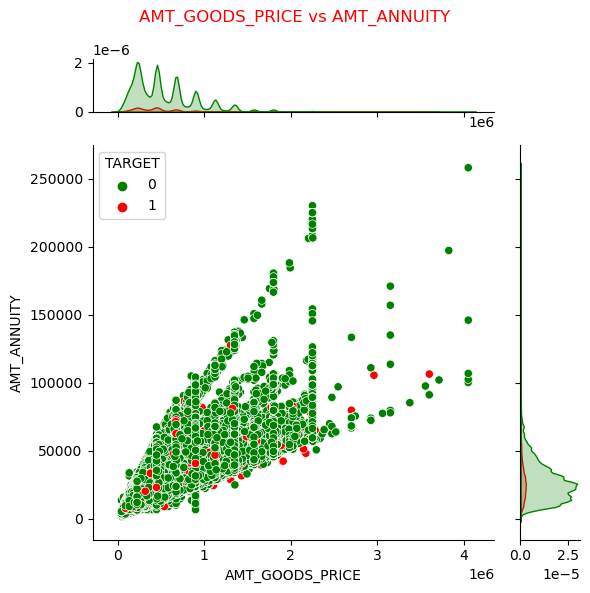

In [132]:
#Let's create relation b/w Goods Price and Annuity.
r = sns.jointplot(x = 'AMT_GOODS_PRICE',y = 'AMT_ANNUITY',data=df,hue="TARGET", marginal_ticks = True,  palette = ['green', 'red'])
r.fig.suptitle('AMT_GOODS_PRICE vs AMT_ANNUITY', color = 'r')
r.fig.tight_layout()
plt.show()
#Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)

## Insights:
 - Correlation between Amount Annuity and Goods Price is pretty moderate.
 - Amount Annuity having values less than 100,000 and Goods Price less than 3M

In [133]:
amt_list = ['AMT_ANNUITY', 'AMT_CREDIT', 'AMT_INCOME_TOTAL','AMT_GOODS_PRICE']

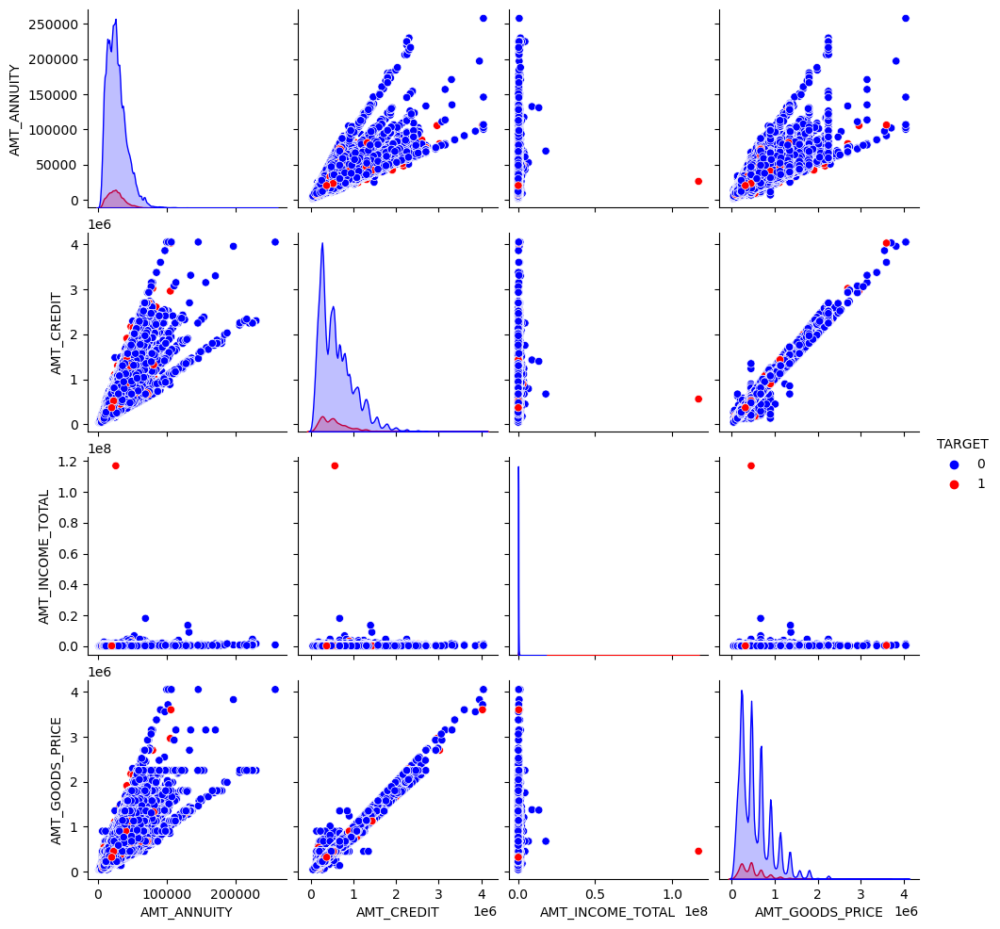

In [134]:
#Plotting pairplot among amount variables.
sns.pairplot(df, vars = amt_list, diag_kind = 'kde', hue = 'TARGET', palette =['b', 'r'])
plt.show()
#Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)

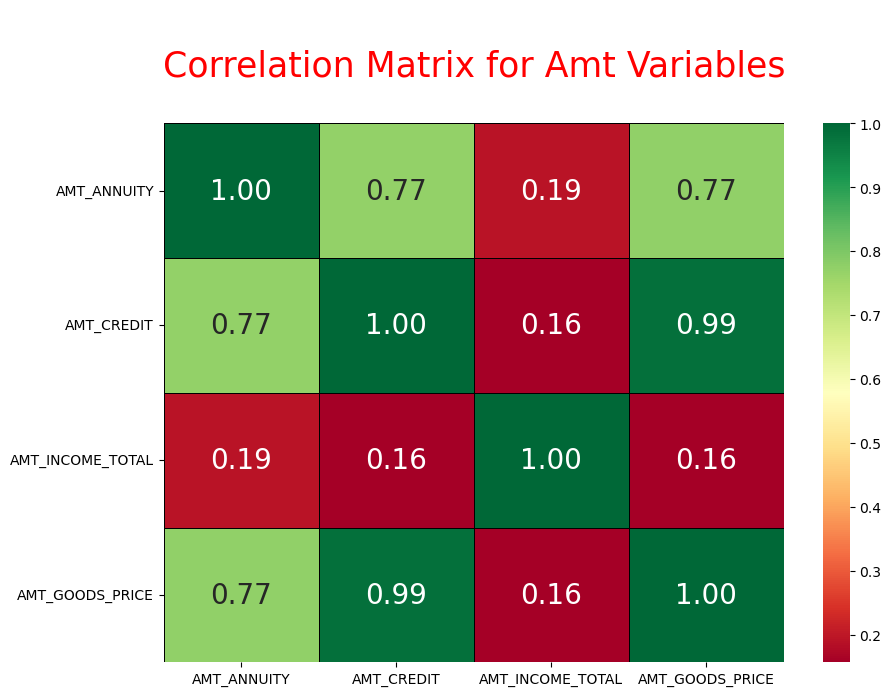

In [135]:
#Correlation Plot among Amt variables
plt.figure(figsize=[10,7])
sns.heatmap(df[amt_list].corr(), cmap="RdYlGn", annot=True, 
                 annot_kws = {'size':20, 'fontweight': 40}, 
                linewidth = 0.5, linecolor ='black', fmt='.2f')
plt.title("\nCorrelation Matrix for Amt Variables\n", fontsize = 25, fontweight = 20, color = 'red')

plt.show()

## Insights:
 - There are more repayers rate when the annuity is more than 100K ,means applicants with 100K annuity will more likely to repay their loans, but their frequency is low
 - With reference to the above Scatterplot and Heatmap b/w AMT_CREDIT and AMT_GOODS_PRICE, we can clearly say that they are highly correlated. The scatterplot b/w them is almost like a straight line and the correlation coeff b/w them is 0.99.

In [136]:
df_multi=[  'NAME_EDUCATION_TYPE','CODE_GENDER', 'NAME_CONTRACT_TYPE', 
            'NAME_FAMILY_STATUS', 'YEARS_BIRTH_RANGE', 'YEARS_EMPLOYED_RANGE','LIVE_CITY_NOT_WORK_CITY']

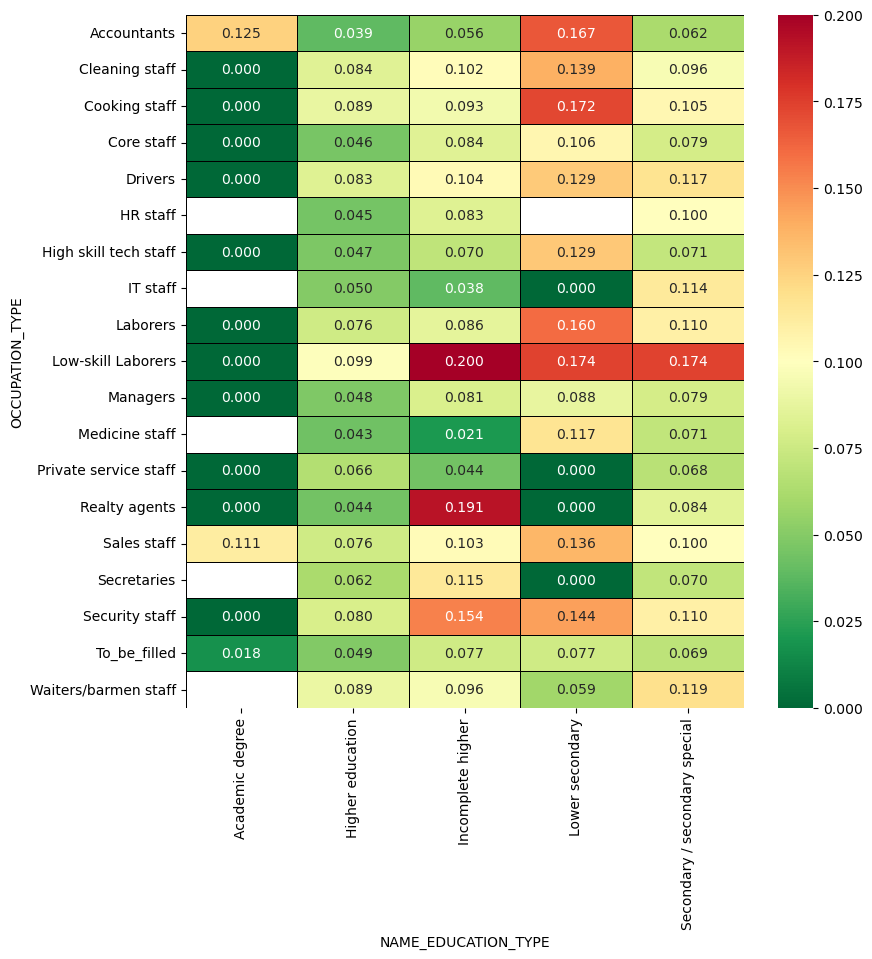

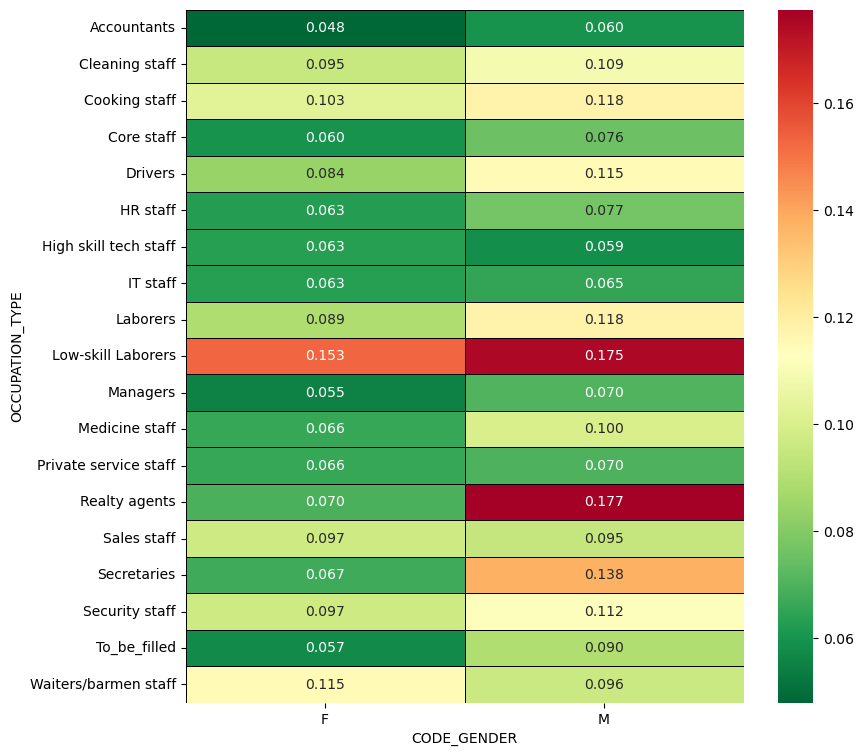

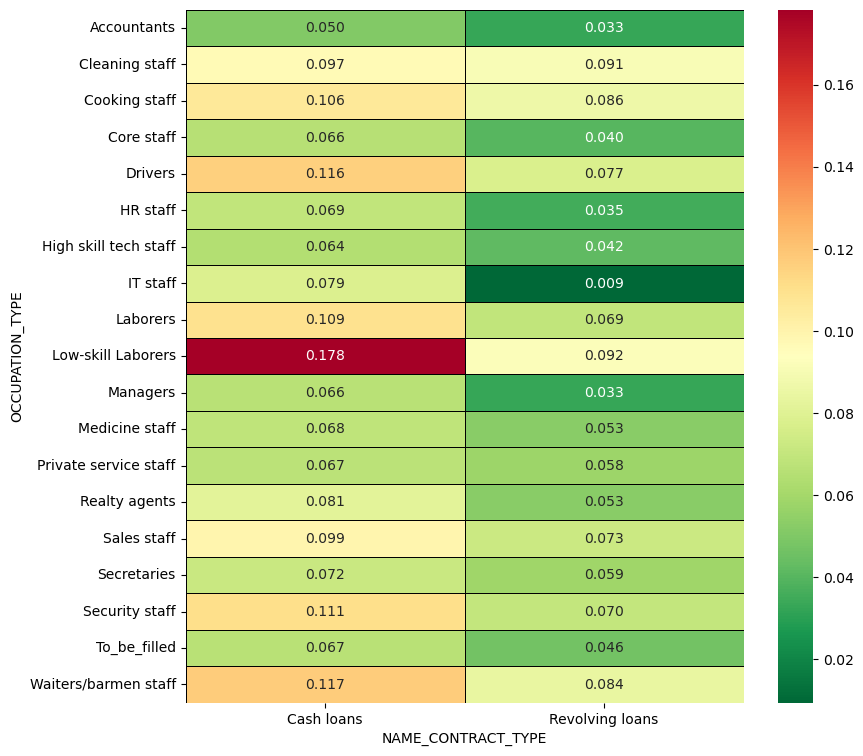

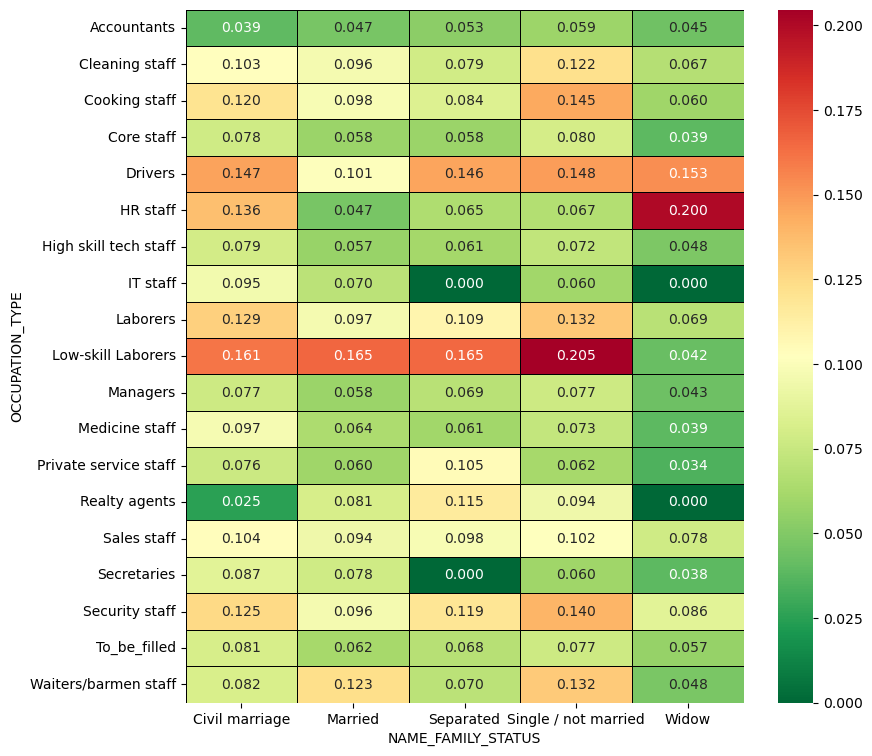

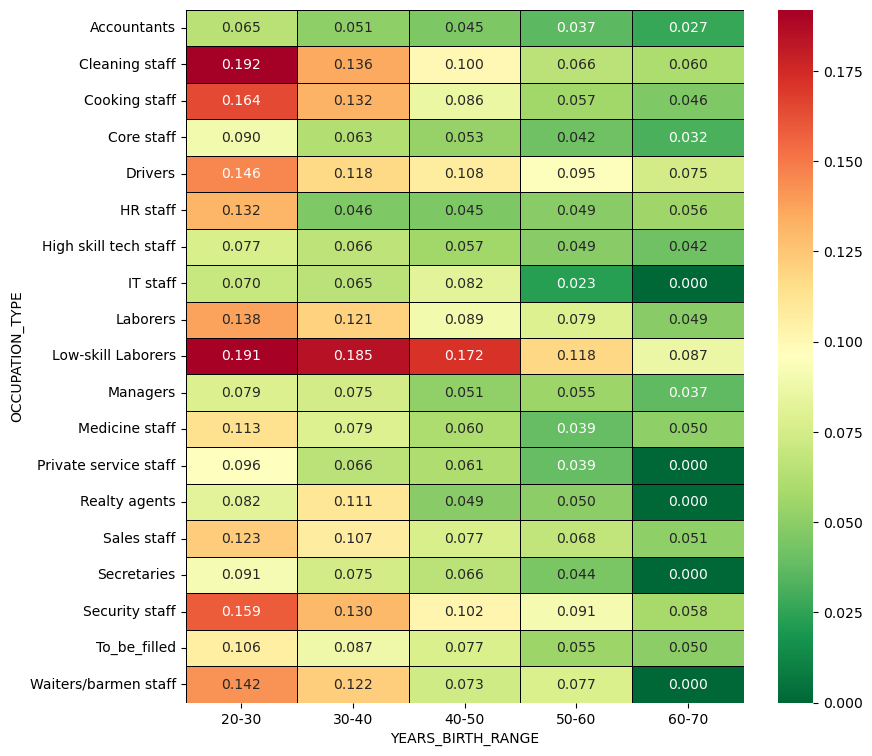

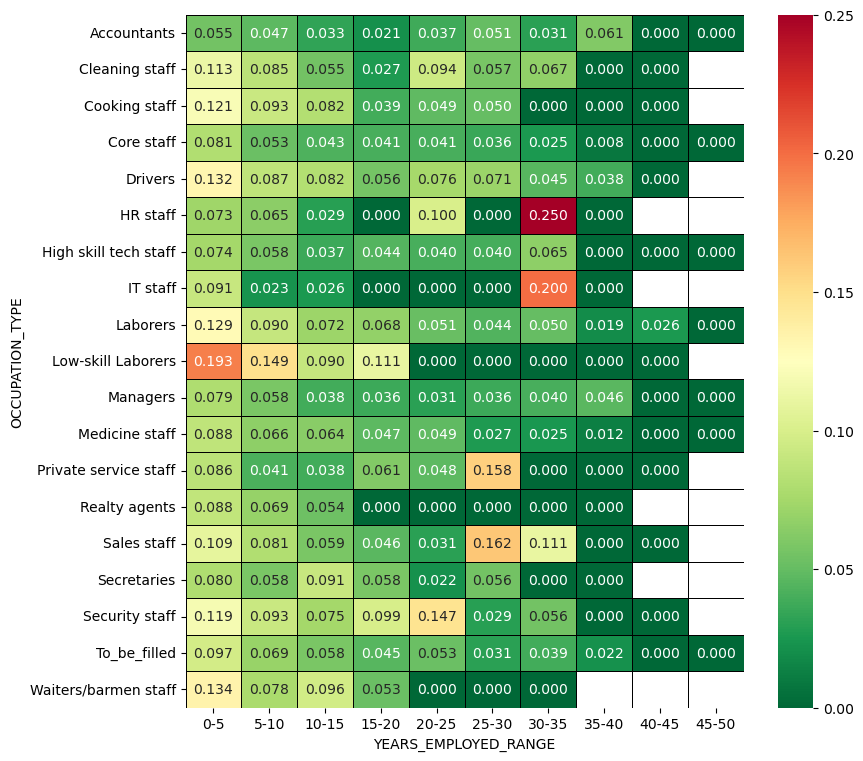

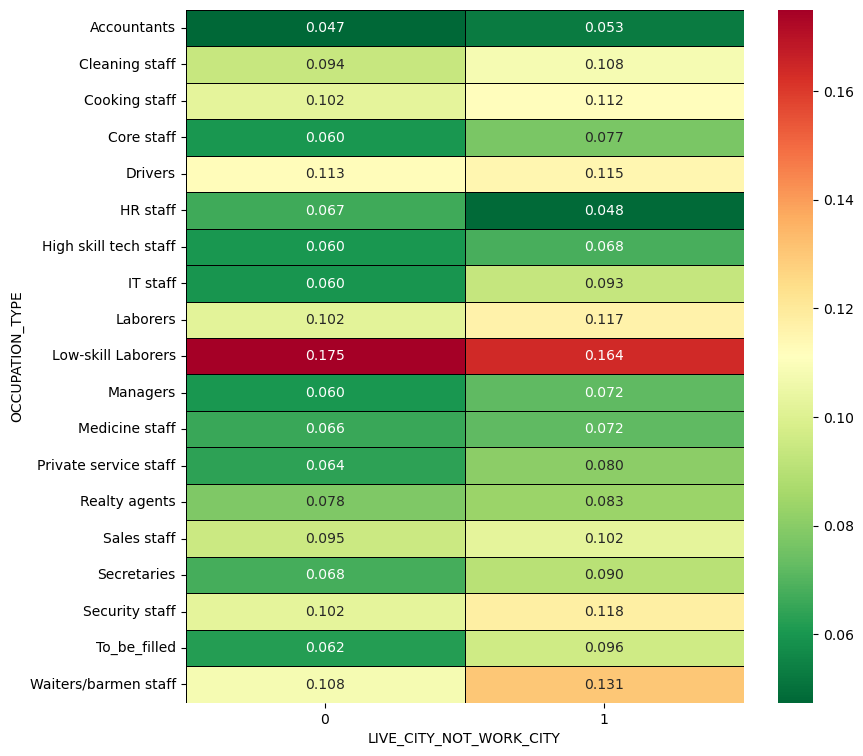

In [137]:
for i in df_multi:
    tab = pd.pivot_table(data=df, index='OCCUPATION_TYPE', columns=i, values="TARGET")
    plt.figure(figsize=[9,9])
    sns.heatmap(tab, cmap="RdYlGn_r", annot=True, 
                 annot_kws = {'size':10,'fontweight': 40}, 
                linewidth = 0.5, linecolor ='black', fmt='.3f')
    plt.show()

# Insights:
 - This analysis shows correlation between two categories and values are Target variable
 
 - Males as Low-Skill Laborers or Realty agents are risky clients
  
 - If client's permanent address does not match contact address the red flag of that applicant being a defaulter is high

 - Cooking staff, Labours,low-skilled labours, who has Lower secondary Education are the Red Flags ,they can be provided with loans at higher interest as their default rate is high.
 
 - The same MultiVariate analysis can also be done after taking variable other than index='OCCUPATION_TYPE' into account in the same code to get more insights

 - Loan providers can target green flags using this analysis after analysing defaulters buckets and look for repayers in that category
 - Red color intensity and high numerical annot value represents defaulters strength in the plot

 - Green color intensity and low numerical annot value represents repayers strength in the plot.

 - Yellow color intensity in plot means neutral correlation

## Univariate Analysis of Continuous Columns

In [138]:
#The below are the Continuous/Numerical columns. Numerical columns can have a very high unique values.
cont_cols =['EXT_SOURCE_2', 'YEARS_BIRTH', 'AMT_ANNUITY',
       'YEARS_EMPLOYED', 'YEARS_ID_PUBLISH', 'AMT_CREDIT', 'AMT_INCOME_TOTAL',
       'AMT_GOODS_PRICE', 'EXT_SOURCE_3']

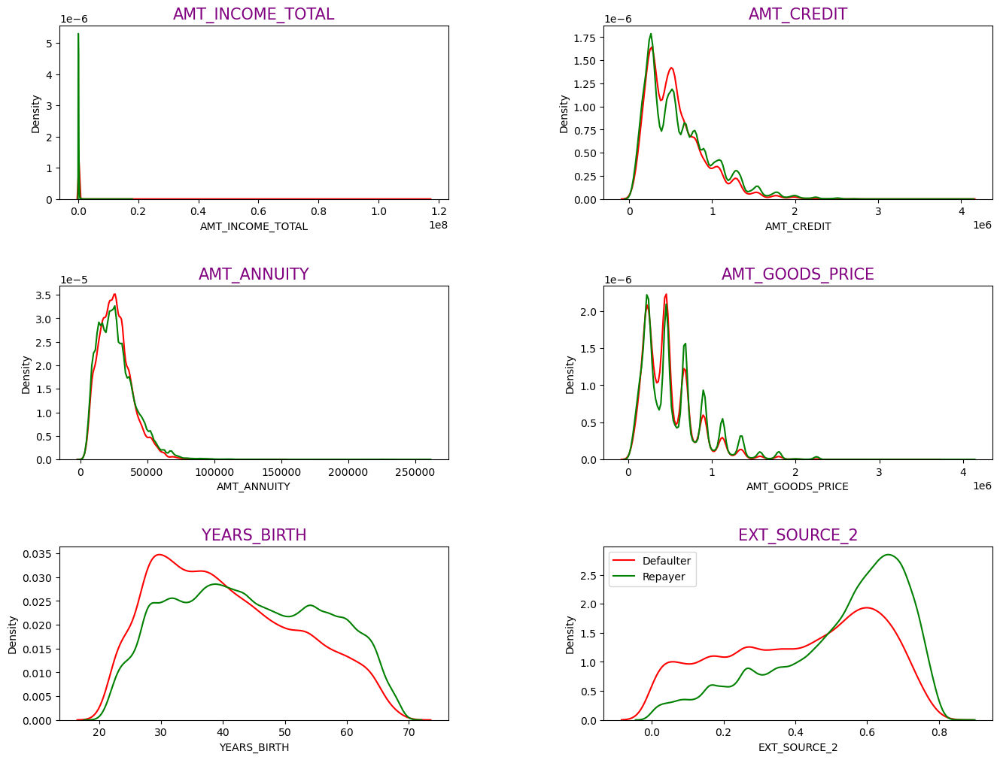

In [139]:
# Plotting the numerical columns related to amount as distribution plot to see density
uni_cont = df[[ 'AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY', 'AMT_GOODS_PRICE','YEARS_BIRTH', 'EXT_SOURCE_2']]

plt.figure(figsize=(16,12))
plt.subplots_adjust(wspace=0.4,hspace=0.5)
for i in enumerate(uni_cont):
    plt.subplot(3,2,i[0]+1)
    sns.distplot(df1[i[1]], hist=False, color='r',label ="Defaulter")
    sns.distplot(df0[i[1]], hist=False, color='g', label ="Repayer")
    plt.title(i[1], fontdict={'fontsize' : 15, 'fontweight' : 5, 'color' : 'purple'}) 
    
plt.legend()

plt.show() 

## Observations

 - For AMT_CREDIT between 250K and approximately 650K, there are more clients with payment difficulties
 - For AMT_CREDIT > 750000 , there are more clients with ontime Payments
 - For YEARS_BIRTH between 20 and 40, there are more clients with payment difficulties
 - Conversely, for YEARS_BIRTH > 40 , there are more clients with ontime Payments
 - For AMT_GOODS_PRICE between 250K and 550K, there are more clients with Payment difficulties

## Correlational Analysis

### Getting top 25 correlation for Non-Defaulters

In [140]:
df0_corr = df0.drop('TARGET', axis =1, inplace = False )

In [141]:
df0_corr.corr()[df0_corr.corr()<=0.99].unstack().sort_values(ascending = False).head(25)

AMT_CREDIT                   AMT_GOODS_PRICE               0.9870
AMT_GOODS_PRICE              AMT_CREDIT                    0.9870
CNT_FAM_MEMBERS              CNT_CHILDREN                  0.8786
CNT_CHILDREN                 CNT_FAM_MEMBERS               0.8786
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION    0.8619
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION   0.8619
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE      0.8594
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE      0.8594
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY       0.8304
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY        0.8304
AMT_ANNUITY                  AMT_GOODS_PRICE               0.7764
AMT_GOODS_PRICE              AMT_ANNUITY                   0.7764
AMT_ANNUITY                  AMT_CREDIT                    0.7713
AMT_CREDIT                   AMT_ANNUITY                   0.7713
YEARS_BIRTH                  YEARS_EMPLOYED                0.6261
YEARS_EMPL

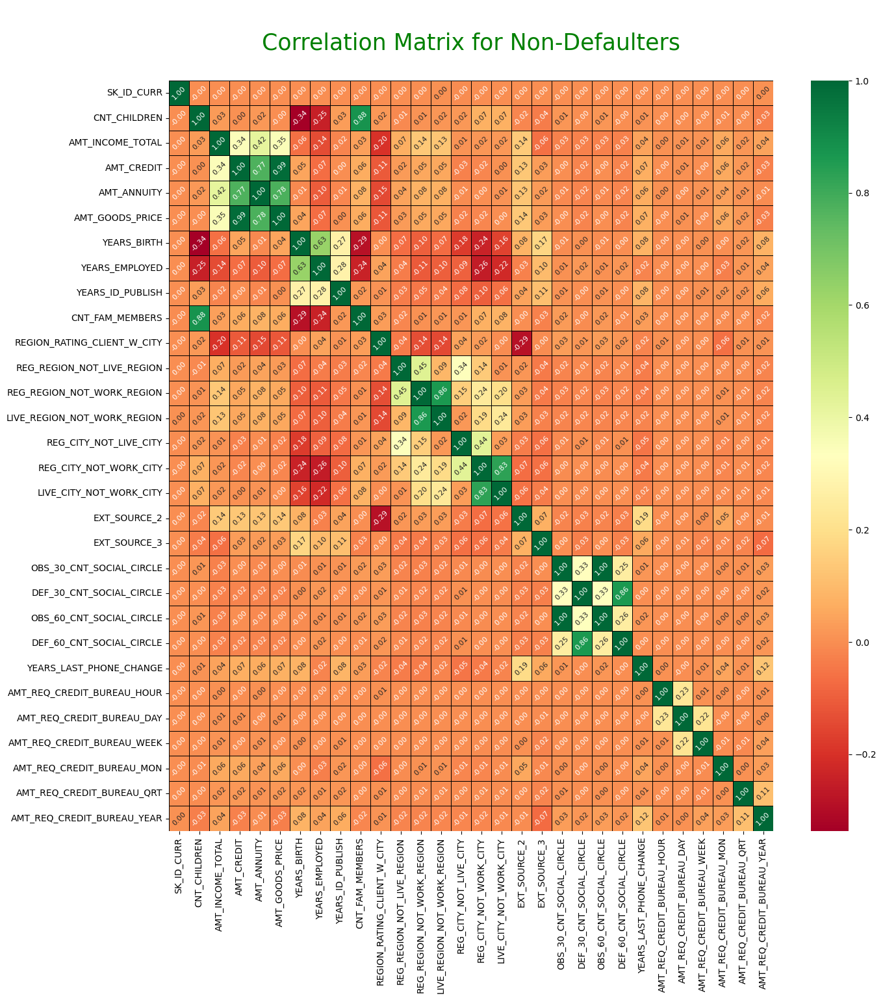

In [142]:
fig = plt.figure(figsize=(15,15))
ax = sns.heatmap(df0_corr.corr(), cmap="RdYlGn", annot=True, 
                 annot_kws = {'size':8, 'rotation': 45, 'fontweight': 40}, 
                linewidth = 0.5, linecolor ='black', fmt='.2f')
plt.title("\nCorrelation Matrix for Non-Defaulters\n", fontsize = 25, fontweight = 20, color = 'green')
plt.show()

## Inferences:
 - With reference to the Correlative matrix of Non-Defaulters, we can conclude the following.
 - Credit amount is highly correlated(0.99) with the Goods Price. 
 - Amount Annuity(EMI) also has higher correlation with Credit amount(0.77) and with Goods Price(0.78)
 - There's a fair correlation b/w Annuity and Income(0.42). There is a fair relation b/w Annuity(EMI) and Income of Non_Defaulters.
 - There's a good correlation b/w Credit Amount and Income(0.34).

### Getting top 25 correlation for Defaulters

In [143]:
df1_corr = df1.drop('TARGET', axis =1, inplace = False)

In [144]:
df1_corr.corr()[df1_corr.corr()<=0.99].unstack().sort_values(ascending = False).head(25)

AMT_GOODS_PRICE              AMT_CREDIT                    0.9828
AMT_CREDIT                   AMT_GOODS_PRICE               0.9828
CNT_CHILDREN                 CNT_FAM_MEMBERS               0.8855
CNT_FAM_MEMBERS              CNT_CHILDREN                  0.8855
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE      0.8690
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE      0.8690
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION   0.8479
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION    0.8479
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY       0.7785
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY        0.7785
AMT_ANNUITY                  AMT_GOODS_PRICE               0.7523
AMT_GOODS_PRICE              AMT_ANNUITY                   0.7523
AMT_ANNUITY                  AMT_CREDIT                    0.7522
AMT_CREDIT                   AMT_ANNUITY                   0.7522
YEARS_BIRTH                  YEARS_EMPLOYED                0.5822
YEARS_EMPL

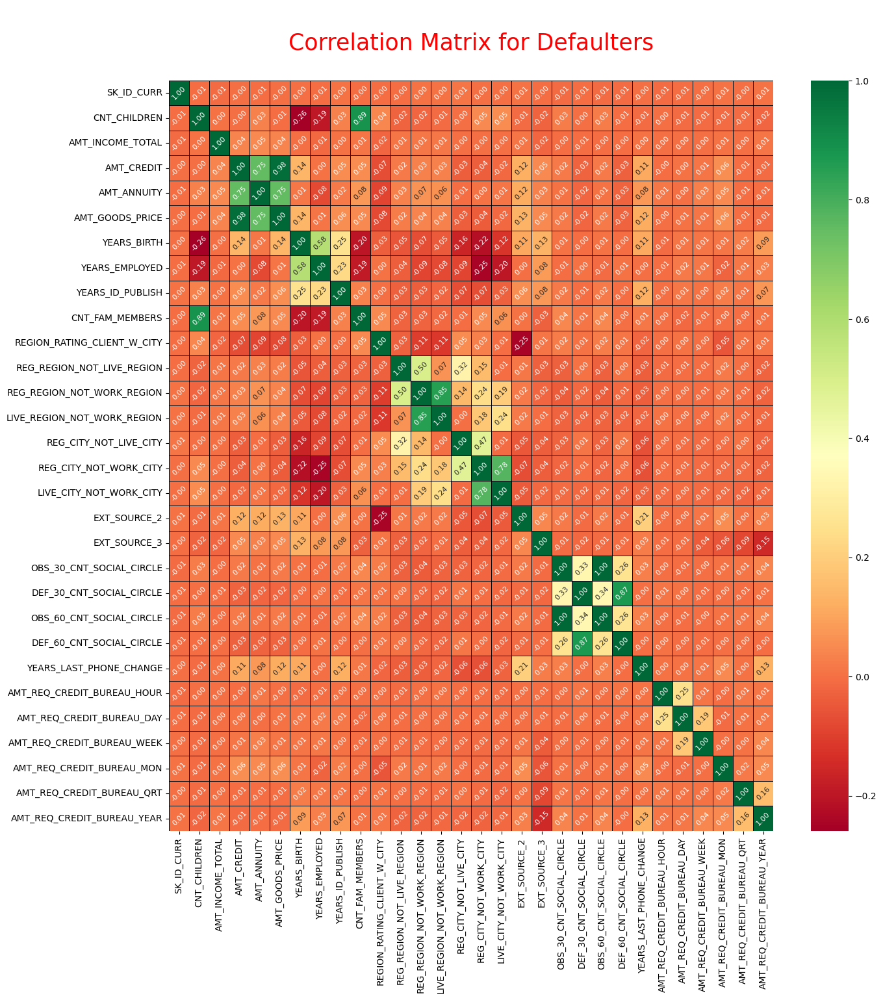

In [145]:
fig = plt.figure(figsize=(15,15))
ax = sns.heatmap(df1_corr.corr(), cmap="RdYlGn", annot=True, 
                 annot_kws = {'size':8, 'rotation': 45, 'fontweight': 40}, 
                linewidth = 0.5, linecolor ='black', fmt='.2f')
plt.title("\nCorrelation Matrix for Defaulters\n", fontsize = 25, fontweight = 20, color = 'red')
plt.show()

## Inferences:
 - Credit amount is highly correlated with Goods Price(0.98) which is almost the same as observed in the case of Non-Defaulters.
 - But the loan annuity correlation with credit amount is slightly reduced in the case of defaulters(0.75) when compared to that for Non-Defaulters(0.77)
 - We can also see that the Age of Non-Defaulters has high correlation with the number of employment years(0.62) when compared to that for Defaulters(0.58).
 - There is a severe drop in the correlation between total income of the client and the credit amount(0.04) amongst Defaulters whereas it is 0.34 among Non-Defaulters.

## 📝🧠 Reading & Understanding of PREVIOUS APPLICATION DATA

In [146]:
#Loading Dataset
pdf = pd.read_csv('previous_application.csv')
#Checking Data
pdf.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.4300,17145.0000,17145.0000,0.0000,17145.0000,SATURDAY,15,...,Connectivity,12.0000,middle,POS mobile with interest,365243.0000,-42.0000,300.0000,-42.0000,-37.0000,0.0000
1,2802425,108129,Cash loans,25188.6150,607500.0000,679671.0000,NaN,607500.0000,THURSDAY,11,...,XNA,36.0000,low_action,Cash X-Sell: low,365243.0000,-134.0000,916.0000,365243.0000,365243.0000,1.0000
2,2523466,122040,Cash loans,15060.7350,112500.0000,136444.5000,NaN,112500.0000,TUESDAY,11,...,XNA,12.0000,high,Cash X-Sell: high,365243.0000,-271.0000,59.0000,365243.0000,365243.0000,1.0000
3,2819243,176158,Cash loans,47041.3350,450000.0000,470790.0000,NaN,450000.0000,MONDAY,7,...,XNA,12.0000,middle,Cash X-Sell: middle,365243.0000,-482.0000,-152.0000,-182.0000,-177.0000,1.0000
4,1784265,202054,Cash loans,31924.3950,337500.0000,404055.0000,NaN,337500.0000,THURSDAY,9,...,XNA,24.0000,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [147]:
#Checking the Shape of the DataFrame
print('(No. of rows, No. of columns):', pdf.shape)

(No. of rows, No. of columns): (1670214, 37)


In [148]:
# Getting the information about the DataFrame
pdf.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [149]:
# Generating descriptive statistics of the DataFrame. 
#It summarizes the central tendency, dispersion and shape of the dataset's distribution, excluding NaN values.
pdf.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214.0000,1670214.0000,1297979.0000,1670214.0000,1670213.0000,774370.0000,1284699.0000,1670214.0000,1670214.0000,774370.0000,...,5951.0000,1670214.0000,1670214.0000,1297984.0000,997149.0000,997149.0000,997149.0000,997149.0000,997149.0000,997149.0000
mean,1923089.1353,278357.1741,15955.1207,175233.8604,196114.0212,6697.4021,227847.2793,12.4842,0.9965,0.0796,...,0.7735,-880.6797,313.9511,16.0541,342209.8550,13826.2693,33767.7741,76582.4031,81992.3438,0.3326
std,532597.9587,102814.8238,14782.1373,292779.7624,318574.6165,20921.4954,315396.5579,3.3340,0.0593,0.1078,...,0.1009,779.0997,7127.4435,14.5673,88916.1158,72444.8697,106857.0348,149647.4151,153303.5167,0.4711
min,1000001.0000,100001.0000,0.0000,0.0000,0.0000,-0.9000,0.0000,0.0000,0.0000,-0.0000,...,0.3732,-2922.0000,-1.0000,0.0000,-2922.0000,-2892.0000,-2801.0000,-2889.0000,-2874.0000,0.0000
25%,1461857.2500,189329.0000,6321.7800,18720.0000,24160.5000,0.0000,50841.0000,10.0000,1.0000,0.0000,...,0.7156,-1300.0000,-1.0000,6.0000,365243.0000,-1628.0000,-1242.0000,-1314.0000,-1270.0000,0.0000
50%,1923110.5000,278714.5000,11250.0000,71046.0000,80541.0000,1638.0000,112320.0000,12.0000,1.0000,0.0516,...,0.8351,-581.0000,3.0000,12.0000,365243.0000,-831.0000,-361.0000,-537.0000,-499.0000,0.0000
75%,2384279.7500,367514.0000,20658.4200,180360.0000,216418.5000,7740.0000,234000.0000,15.0000,1.0000,0.1089,...,0.8525,-280.0000,82.0000,24.0000,365243.0000,-411.0000,129.0000,-74.0000,-44.0000,1.0000
max,2845382.0000,456255.0000,418058.1450,6905160.0000,6905160.0000,3060045.0000,6905160.0000,23.0000,1.0000,1.0000,...,1.0000,-1.0000,4000000.0000,84.0000,365243.0000,365243.0000,365243.0000,365243.0000,365243.0000,1.0000


In [150]:
# Getting percentage of missing values in pdf using User Defined Function
miss_perc(pdf)

RATE_INTEREST_PRIVILEGED      99.6437
RATE_INTEREST_PRIMARY         99.6437
AMT_DOWN_PAYMENT              53.6365
RATE_DOWN_PAYMENT             53.6365
NAME_TYPE_SUITE               49.1198
NFLAG_INSURED_ON_APPROVAL     40.2981
DAYS_TERMINATION              40.2981
DAYS_LAST_DUE                 40.2981
DAYS_LAST_DUE_1ST_VERSION     40.2981
DAYS_FIRST_DUE                40.2981
DAYS_FIRST_DRAWING            40.2981
AMT_GOODS_PRICE               23.0818
AMT_ANNUITY                   22.2867
CNT_PAYMENT                   22.2864
PRODUCT_COMBINATION            0.0207
AMT_CREDIT                     0.0001
NAME_YIELD_GROUP               0.0000
NAME_PORTFOLIO                 0.0000
NAME_SELLER_INDUSTRY           0.0000
SELLERPLACE_AREA               0.0000
CHANNEL_TYPE                   0.0000
NAME_PRODUCT_TYPE              0.0000
SK_ID_PREV                     0.0000
NAME_GOODS_CATEGORY            0.0000
NAME_CLIENT_TYPE               0.0000
CODE_REJECT_REASON             0.0000
SK_ID_CURR  

In [151]:
# Dropping the columns with more than 35% missing values in the dataset using User defined function.
rem_nulls(pdf)

Number of Columns dropped	:  11
***************************************
List of columns dropped: ['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']
***************************************

(No. of rows, No. of columns) before dropping: (1670214, 37) 
(No. of rows, No. of columns) after dropping: (1670214, 26)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,1730.4300,17145.0000,17145.0000,17145.0000,SATURDAY,15,Y,...,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0000,middle,POS mobile with interest
1,2802425,108129,Cash loans,25188.6150,607500.0000,679671.0000,607500.0000,THURSDAY,11,Y,...,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0000,low_action,Cash X-Sell: low
2,2523466,122040,Cash loans,15060.7350,112500.0000,136444.5000,112500.0000,TUESDAY,11,Y,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0000,high,Cash X-Sell: high
3,2819243,176158,Cash loans,47041.3350,450000.0000,470790.0000,450000.0000,MONDAY,7,Y,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0000,middle,Cash X-Sell: middle
4,1784265,202054,Cash loans,31924.3950,337500.0000,404055.0000,337500.0000,THURSDAY,9,Y,...,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0000,high,Cash Street: high


In [152]:
# Rechecking missing value percentage
miss_perc(pdf)

AMT_GOODS_PRICE               23.0818
AMT_ANNUITY                   22.2867
CNT_PAYMENT                   22.2864
PRODUCT_COMBINATION            0.0207
AMT_CREDIT                     0.0001
CODE_REJECT_REASON             0.0000
NAME_YIELD_GROUP               0.0000
NAME_SELLER_INDUSTRY           0.0000
SELLERPLACE_AREA               0.0000
CHANNEL_TYPE                   0.0000
NAME_PRODUCT_TYPE              0.0000
NAME_PORTFOLIO                 0.0000
NAME_GOODS_CATEGORY            0.0000
NAME_CLIENT_TYPE               0.0000
SK_ID_PREV                     0.0000
NAME_PAYMENT_TYPE              0.0000
SK_ID_CURR                     0.0000
NAME_CONTRACT_STATUS           0.0000
NAME_CASH_LOAN_PURPOSE         0.0000
NFLAG_LAST_APPL_IN_DAY         0.0000
FLAG_LAST_APPL_PER_CONTRACT    0.0000
HOUR_APPR_PROCESS_START        0.0000
WEEKDAY_APPR_PROCESS_START     0.0000
AMT_APPLICATION                0.0000
NAME_CONTRACT_TYPE             0.0000
DAYS_DECISION                  0.0000
dtype: float

## 🚰Missing Value Treatment in PREVIOUS APPLICATION DATA

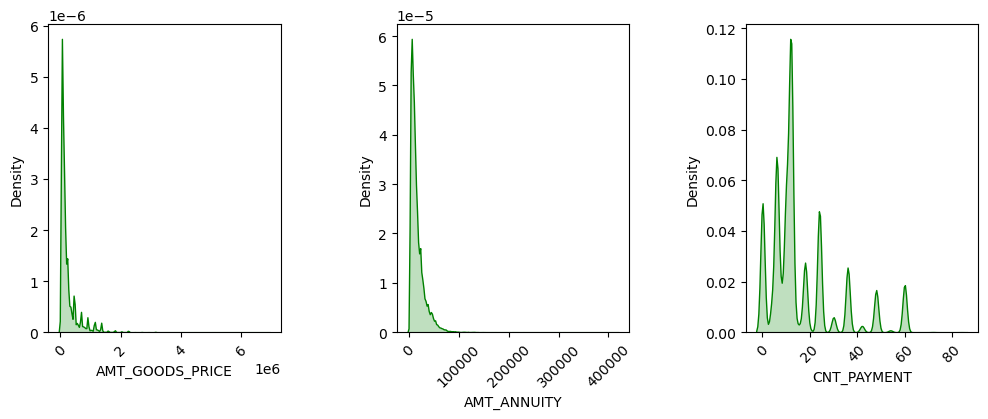

In [153]:
# There are 3 columns ('AMT_GOODS_PRICE', 'AMT_ANNUITY', 'CNT_PAYMENT') with missing value percentage > 20%
pdf_nulls = ['AMT_GOODS_PRICE', 'AMT_ANNUITY', 'CNT_PAYMENT']
plt.figure(figsize=[12,4])
plt.title('Kernel Distribution plot of pdf_nulls',color="green")
plt.subplots_adjust(wspace=0.5)
for i in enumerate(pdf_nulls): 
    plt.subplot(1,3,i[0]+1)
    sns.kdeplot(pdf[i[1]], color='green', shade = True)
    plt.xticks(rotation=45)

### 🌹Inferences: As we can see from kdeplots of ('AMT_GOODS_PRICE', 'AMT_ANNUITY') columns, there is a single peak to the left i.e., they have outliers. Let's recheck using boxplots.🌹

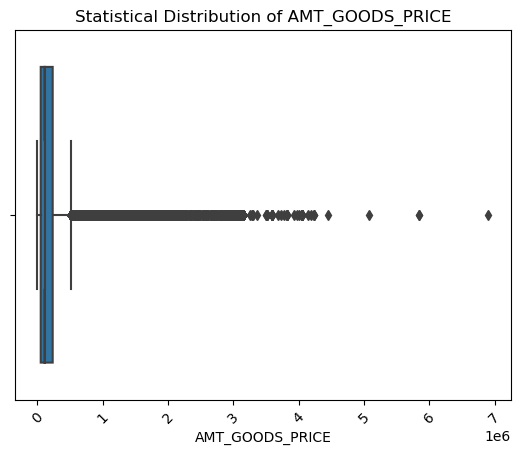

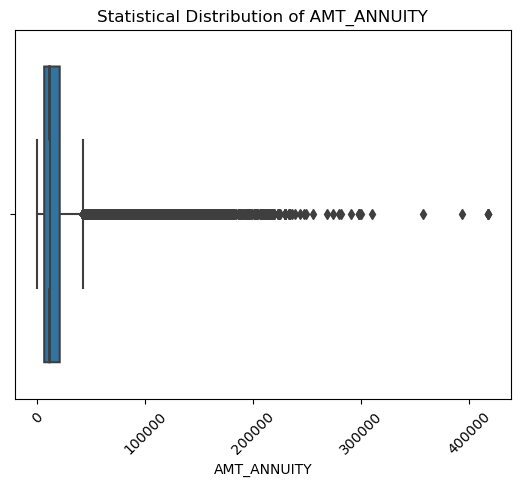

In [154]:
for i in ['AMT_GOODS_PRICE', 'AMT_ANNUITY']:
    sns.despine
    sns.boxplot(pdf[i], notch=True)
    plt.xlabel(i)
    plt.title("Statistical Distribution of "+i)
    plt.xticks(rotation=45)
    plt.show()

### 🌹Inferences: 
 - As we can see from boxplots of ('AMT_GOODS_PRICE', 'AMT_ANNUITY') columns, there are outliers. So, it's advisable to impute the missing values in ('AMT_GOODS_PRICE', 'AMT_ANNUITY') columns with Median rather than Mean.🌹

In [155]:
# Let's impute ('AMT_GOODS_PRICE', 'AMT_ANNUITY') columns with Median.
for i in ['AMT_GOODS_PRICE', 'AMT_ANNUITY']:
    med=pdf[i].median()
    pdf[i].fillna(med, inplace=True)

In [156]:
100*pdf["NAME_CONTRACT_STATUS"][pdf["CNT_PAYMENT"].isnull()==True].value_counts(normalize=True)

Canceled       82.1549
Refused        10.9870
Unused offer    6.8571
Approved        0.0011
Name: NAME_CONTRACT_STATUS, dtype: float64

In [157]:
# Let's impute null values in CNT_PAYMENT column with 0 as most of them are canceled or refused or unused offers and hence no previous credit. 
pdf['CNT_PAYMENT'].fillna(0,inplace = True)

In [158]:
#Rechecking null values
miss_perc(pdf)

PRODUCT_COMBINATION           0.0207
AMT_CREDIT                    0.0001
NAME_PAYMENT_TYPE             0.0000
NAME_YIELD_GROUP              0.0000
CNT_PAYMENT                   0.0000
NAME_SELLER_INDUSTRY          0.0000
SELLERPLACE_AREA              0.0000
CHANNEL_TYPE                  0.0000
NAME_PRODUCT_TYPE             0.0000
NAME_PORTFOLIO                0.0000
NAME_GOODS_CATEGORY           0.0000
NAME_CLIENT_TYPE              0.0000
CODE_REJECT_REASON            0.0000
SK_ID_PREV                    0.0000
SK_ID_CURR                    0.0000
NAME_CONTRACT_STATUS          0.0000
NAME_CASH_LOAN_PURPOSE        0.0000
NFLAG_LAST_APPL_IN_DAY        0.0000
FLAG_LAST_APPL_PER_CONTRACT   0.0000
HOUR_APPR_PROCESS_START       0.0000
WEEKDAY_APPR_PROCESS_START    0.0000
AMT_GOODS_PRICE               0.0000
AMT_APPLICATION               0.0000
AMT_ANNUITY                   0.0000
NAME_CONTRACT_TYPE            0.0000
DAYS_DECISION                 0.0000
dtype: float64

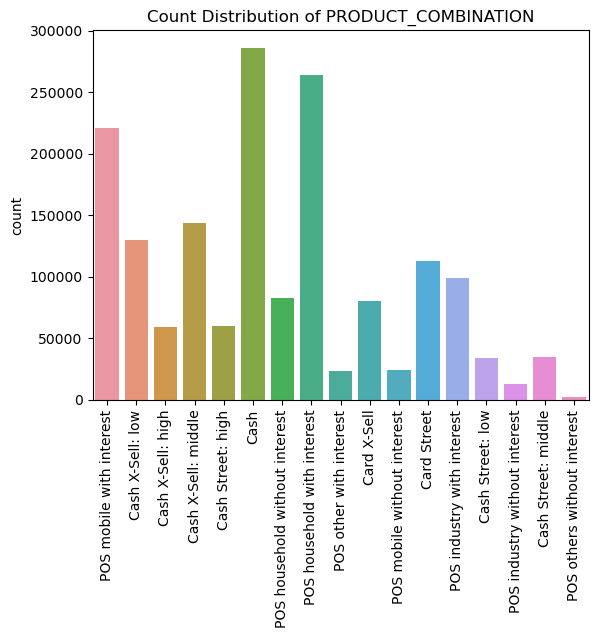

In [159]:
# Let's go ahead with 'PRODUCT_COMBINATION' null value tretment
sns.countplot(pdf['PRODUCT_COMBINATION'])
plt.xlabel('')
plt.title("Count Distribution of "+'PRODUCT_COMBINATION')
plt.xticks(rotation=90)
plt.show()

## 🌹Observation: 
 - From the above plot, Clients with 'PRODUCT_COMBINATION'-Cash are high.🌹 

In [160]:
#Let's impute missing values in PRODUCT_COMBINATION column with mode and its dtype is 'object'
pdf['PRODUCT_COMBINATION'].fillna(mod, inplace=True)

## 👉Ignoring Imputation of missing values in AMT_CREDIT column as its missing value percentage is very low(0.0001)

In [161]:
# Dropping all the columns which play minor role in Analysing the data
pun_imp_cols = ['SELLERPLACE_AREA']
pdf.drop(labels=pun_imp_cols, axis=1, inplace=True)

## 🌟Missing Value Treatment for the columns of Previous Application Data with suitable value is completed.🌟

## Dealing with incorrect/negative values in the data

In [162]:
pdf['NAME_CASH_LOAN_PURPOSE'].value_counts()
# There are XNA(Not Available) and XPA(Not Applicable) in the data.
# But, we ignore replacing them with any other value as they are very high in number.

XAP                                 922661
XNA                                 677918
Repairs                              23765
Other                                15608
Urgent needs                          8412
Buying a used car                     2888
Building a house or an annex          2693
Everyday expenses                     2416
Medicine                              2174
Payments on other loans               1931
Education                             1573
Journey                               1239
Purchase of electronic equipment      1061
Buying a new car                      1012
Wedding / gift / holiday               962
Buying a home                          865
Car repairs                            797
Furniture                              749
Buying a holiday home / land           533
Business development                   426
Gasification / water supply            300
Buying a garage                        136
Hobby                                   55
Money for a

In [163]:
pdf['NAME_PAYMENT_TYPE'].value_counts()
# There are XNA(Not Available) in the data.
# But, we ignore replacing them with any other value as they are very high in number.

Cash through the bank                        1033552
XNA                                           627384
Non-cash from your account                      8193
Cashless from the account of the employer       1085
Name: NAME_PAYMENT_TYPE, dtype: int64

In [164]:
pdf['CODE_REJECT_REASON'].value_counts()
# There are XNA(Not Available) and XPA(Not Applicable) in the data.
# But, we ignore replacing them with any other value as they are very high in number.

XAP       1353093
HC         175231
LIMIT       55680
SCO         37467
CLIENT      26436
SCOFR       12811
XNA          5244
VERIF        3535
SYSTEM        717
Name: CODE_REJECT_REASON, dtype: int64

In [165]:
pdf['NAME_CLIENT_TYPE'].value_counts()

Repeater     1231261
New           301363
Refreshed     135649
XNA             1941
Name: NAME_CLIENT_TYPE, dtype: int64

In [166]:
# Imputing 'XNA' in 'NAME_CLIENT_TYPE' column with 'Repeater' as it has the highest frequency. 
pdf.loc[pdf['NAME_CLIENT_TYPE'] == "XNA", 'NAME_CLIENT_TYPE'] = 'Repeater'

In [167]:
#Rechecking NAME_CLIENT_TYPE value_counts
pdf['NAME_CLIENT_TYPE'].value_counts()

Repeater     1233202
New           301363
Refreshed     135649
Name: NAME_CLIENT_TYPE, dtype: int64

In [168]:
pdf.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,CNT_PAYMENT
count,1670214.0000,1670214.0000,1670214.0000,1670214.0000,1670213.0000,1670214.0000,1670214.0000,1670214.0000,1670214.0000,1670214.0000
mean,1923089.1353,278357.1741,14906.5062,175233.8604,196114.0212,201181.5352,12.4842,0.9965,-880.6797,12.4762
std,532597.9587,102814.8238,13177.5141,292779.7624,318574.6165,280862.8572,3.3340,0.0593,779.0997,14.4759
min,1000001.0000,100001.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-2922.0000,0.0000
25%,1461857.2500,189329.0000,7547.0963,18720.0000,24160.5000,67500.0000,10.0000,1.0000,-1300.0000,0.0000
50%,1923110.5000,278714.5000,11250.0000,71046.0000,80541.0000,112320.0000,12.0000,1.0000,-581.0000,10.0000
75%,2384279.7500,367514.0000,16824.0263,180360.0000,216418.5000,180405.0000,15.0000,1.0000,-280.0000,16.0000
max,2845382.0000,456255.0000,418058.1450,6905160.0000,6905160.0000,6905160.0000,23.0000,1.0000,-1.0000,84.0000


### Observation: If the above description is observed, we can find negative values in the column DAYS_DECISION 

In [169]:
# Let's change them into positive
neg_columns = ['DAYS_DECISION']
for i in neg_columns:
    pdf[i]=pdf[i].apply(lambda x: -x if x < 0 else x)

In [170]:
# Rechecking DAYS_DECISION Column
pdf['DAYS_DECISION'].describe()

count   1670214.0000
mean        880.6797
std         779.0997
min           1.0000
25%         280.0000
50%         581.0000
75%        1300.0000
max        2922.0000
Name: DAYS_DECISION, dtype: float64

## Outlier Analysis using (Kernel Distribution plot + Boxplot)

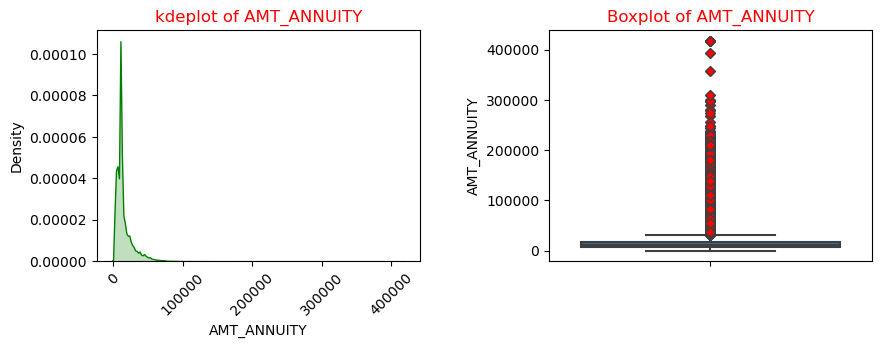

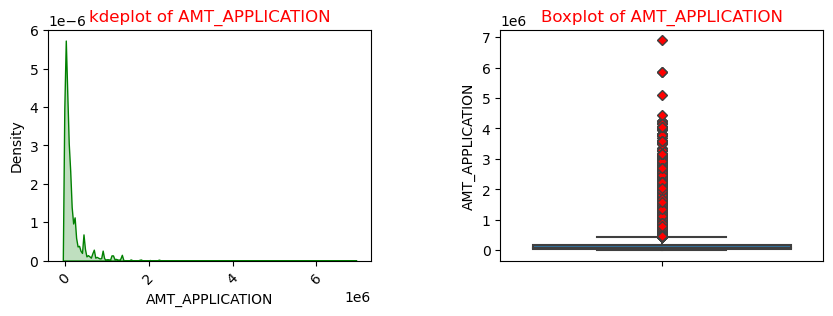

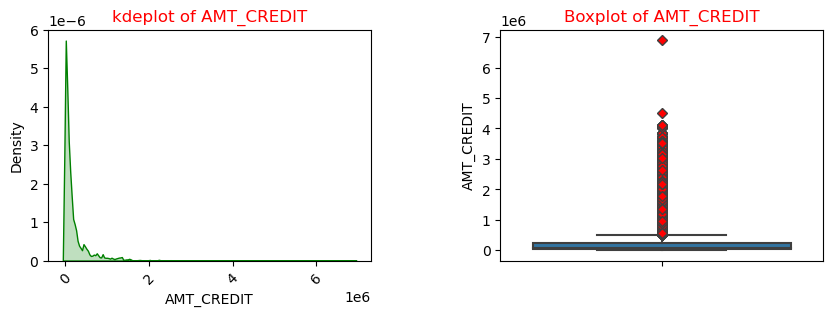

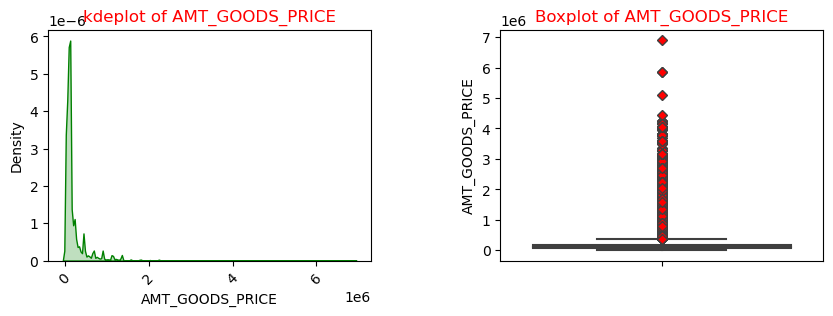

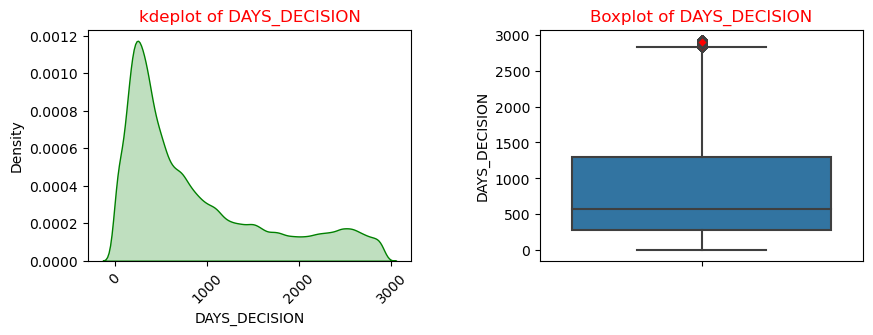

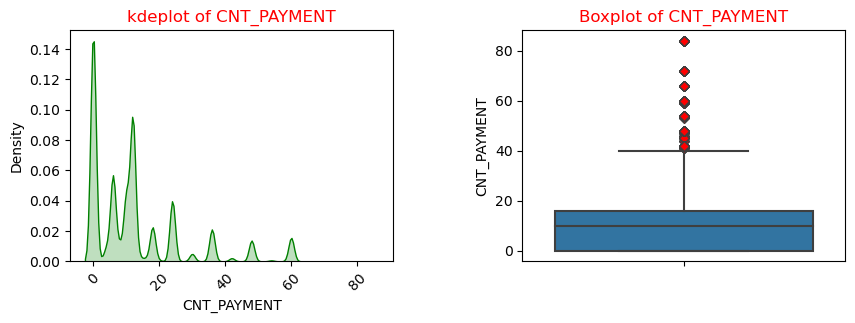

In [171]:
# Using pre-defined function to check for outliers visually
poutlier_columns = ['AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE', 'DAYS_DECISION','CNT_PAYMENT']
for i in poutlier_columns:
    kde_box_fn(pdf,i) 

In [172]:
pdf[poutlier_columns].describe()

,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,DAYS_DECISION,CNT_PAYMENT
count,1670214.0000,1670214.0000,1670213.0000,1670214.0000,1670214.0000,1670214.0000
mean,14906.5062,175233.8604,196114.0212,201181.5352,880.6797,12.4762
std,13177.5141,292779.7624,318574.6165,280862.8572,779.0997,14.4759
min,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
25%,7547.0963,18720.0000,24160.5000,67500.0000,280.0000,0.0000
50%,11250.0000,71046.0000,80541.0000,112320.0000,581.0000,10.0000
75%,16824.0263,180360.0000,216418.5000,180405.0000,1300.0000,16.0000
max,418058.1450,6905160.0000,6905160.0000,6905160.0000,2922.0000,84.0000


## Observations:
 - 'AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE' have huge number of outliers.
 - 'DAYS_DECISION' has comparatively very less outliers
 - Outliers can be handled using Capping and Flooring method.

In [173]:
pdf.nunique().sort_values(ascending=False)

SK_ID_PREV                     1670214
AMT_ANNUITY                     357959
SK_ID_CURR                      338857
AMT_APPLICATION                  93885
AMT_GOODS_PRICE                  93885
AMT_CREDIT                       86803
DAYS_DECISION                     2922
CNT_PAYMENT                         49
NAME_GOODS_CATEGORY                 28
NAME_CASH_LOAN_PURPOSE              25
HOUR_APPR_PROCESS_START             24
PRODUCT_COMBINATION                 18
NAME_SELLER_INDUSTRY                11
CODE_REJECT_REASON                   9
CHANNEL_TYPE                         8
WEEKDAY_APPR_PROCESS_START           7
NAME_PORTFOLIO                       5
NAME_YIELD_GROUP                     5
NAME_PAYMENT_TYPE                    4
NAME_CONTRACT_TYPE                   4
NAME_CONTRACT_STATUS                 4
NAME_CLIENT_TYPE                     3
NAME_PRODUCT_TYPE                    3
NFLAG_LAST_APPL_IN_DAY               2
FLAG_LAST_APPL_PER_CONTRACT          2
dtype: int64

In [174]:
pdf.nunique().sort_values(ascending=False).index

Index(['SK_ID_PREV', 'AMT_ANNUITY', 'SK_ID_CURR', 'AMT_APPLICATION',
       'AMT_GOODS_PRICE', 'AMT_CREDIT', 'DAYS_DECISION', 'CNT_PAYMENT',
       'NAME_GOODS_CATEGORY', 'NAME_CASH_LOAN_PURPOSE',
       'HOUR_APPR_PROCESS_START', 'PRODUCT_COMBINATION',
       'NAME_SELLER_INDUSTRY', 'CODE_REJECT_REASON', 'CHANNEL_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'NAME_PORTFOLIO', 'NAME_YIELD_GROUP',
       'NAME_PAYMENT_TYPE', 'NAME_CONTRACT_TYPE', 'NAME_CONTRACT_STATUS',
       'NAME_CLIENT_TYPE', 'NAME_PRODUCT_TYPE', 'NFLAG_LAST_APPL_IN_DAY',
       'FLAG_LAST_APPL_PER_CONTRACT'],
      dtype='object')

## Segregating the columns into Categorical, Continuous and ID columns.

In [175]:
# The below are the categorical columns. Categorical columns are the columns which have very less unique values.
p_cat_cols=['CNT_PAYMENT',
       'NAME_GOODS_CATEGORY', 'NAME_CASH_LOAN_PURPOSE',
       'HOUR_APPR_PROCESS_START', 'PRODUCT_COMBINATION',
       'NAME_SELLER_INDUSTRY', 'CODE_REJECT_REASON', 'CHANNEL_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'NAME_PORTFOLIO', 'NAME_YIELD_GROUP',
       'NAME_PAYMENT_TYPE', 'NAME_CONTRACT_TYPE', 'NAME_CONTRACT_STATUS',
       'NAME_CLIENT_TYPE', 'NAME_PRODUCT_TYPE', 'NFLAG_LAST_APPL_IN_DAY',
       'FLAG_LAST_APPL_PER_CONTRACT']
#The below are the Continuous/Numerical columns. Numerical columns can have a very high unique values.
p_cont_cols =['AMT_ANNUITY', 'SK_ID_CURR', 'AMT_APPLICATION',
       'AMT_GOODS_PRICE', 'AMT_CREDIT', 'DAYS_DECISION']
# As the no of unique values in 'SK_ID_PREV' is equal to the total no of rows, it can be considered to be ID column.
p_id_col = ['SK_ID_PREV']

## Previous Application Data Analysis

In [176]:
# Let's define a Reusable function to create countplot for Univariate Analysis-Categorical Columns
def p_uni_countplot(column, log_y=False, rot_ticks=False):
    plt.figure(figsize = [6,7])
    palt = sns.color_palette("bright")
    ax = sns.countplot(x = column, data = pdf, order = sorted(pdf[column].unique(), reverse = True), palette = palt)
    plt.title('Countplot of '+ column, fontsize = 12, color = 'g')
    total = len(pdf[column])
    
    for p in ax.patches: 
        percentage='{:.2f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2
        y = p.get_height()
        ax.annotate(percentage,(x,y), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
        
    # We can use Logarithmic Scale if the plot isn't readable
    if log_y:
        plt.yscale('log')
        plt.ylabel("Count on log scale", fontsize = 12)
    
    # Let's rotate x-ticks whenever it is required.
    if rot_ticks:
        plt.xticks(rotation=90)
        plt.xlabel('')
        
    plt.tight_layout(pad = 4)
    plt.show()

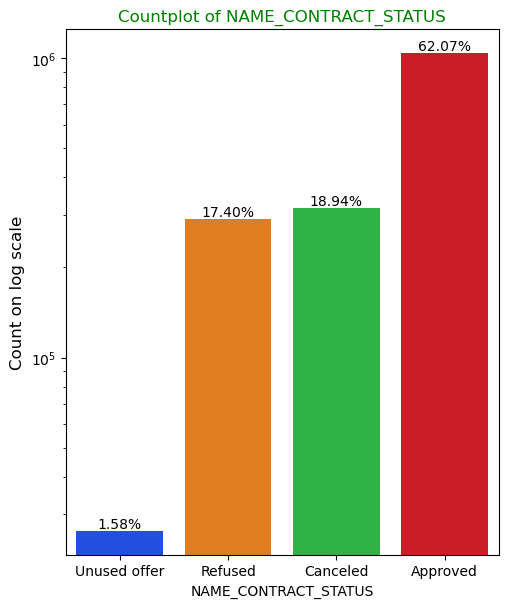

In [177]:
p_uni_countplot('NAME_CONTRACT_STATUS', True)

# Inferences:
 - Almost 62.07% of the applications have been approved.
 - Only 1.58% loans have been cancelled by the client but at different stages of the process.

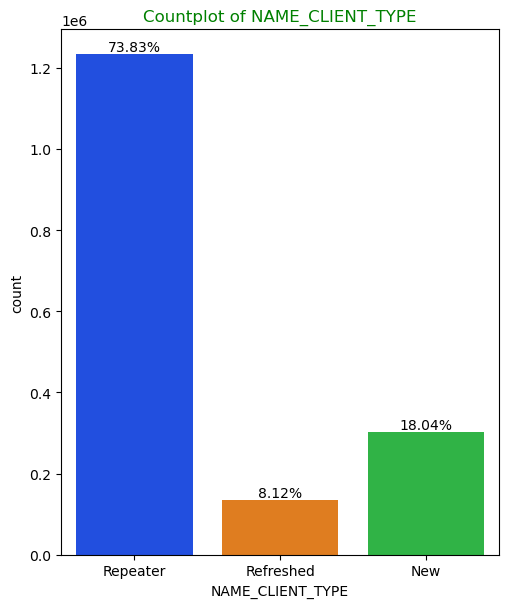

In [178]:
p_uni_countplot('NAME_CLIENT_TYPE')

## Inferences:
 - Almost 73.83% are Repeaters, 18.04% are New applicants and only 8.12% are Refreshed applications

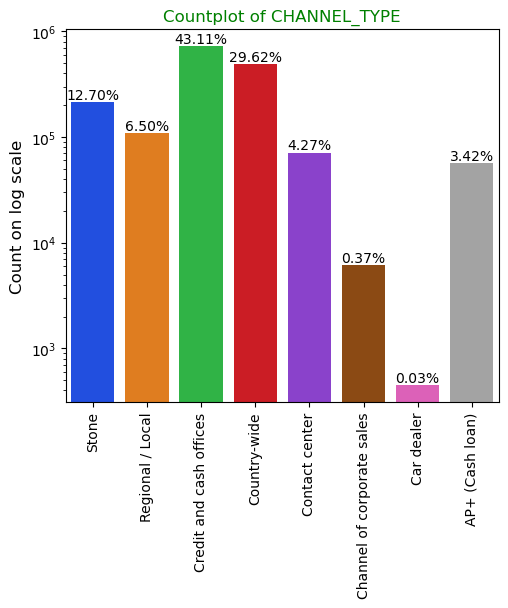

In [179]:
p_uni_countplot('CHANNEL_TYPE',True, True)

## Inferences:
 - Majority of the applications(43.11%) have been acquired from Credit and cash offices.
 - Minority of the applications(0.03%) have been acquired from Car Dealers

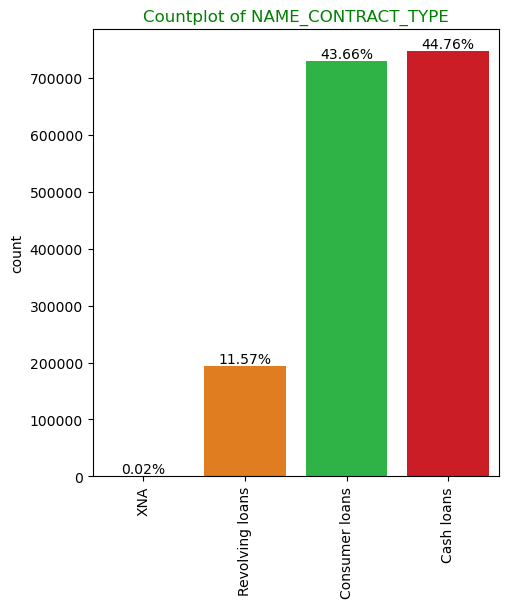

In [180]:
p_uni_countplot('NAME_CONTRACT_TYPE',False, True)

## Inferences:
 - Majority of the applications(44.76%) are of cash loans.

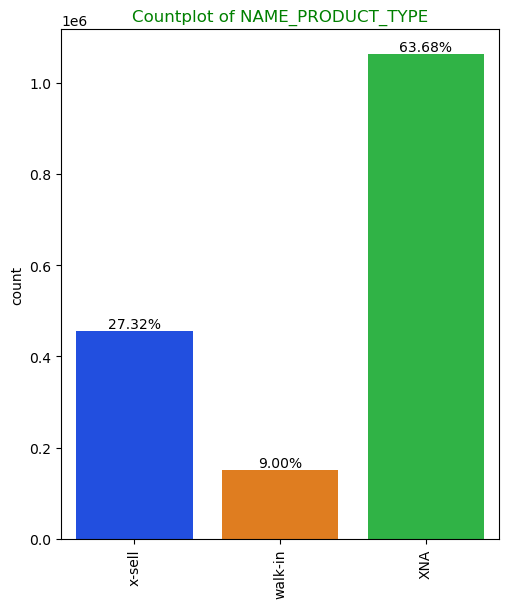

In [181]:
p_uni_countplot('NAME_PRODUCT_TYPE',False, True)

## Observations:
 - For most of the applications, Product Type isn't mentioned.

# Bi/Multivariate Analysis

In [182]:
num_list = ['AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_GOODS_PRICE', 'AMT_CREDIT', 'DAYS_DECISION']

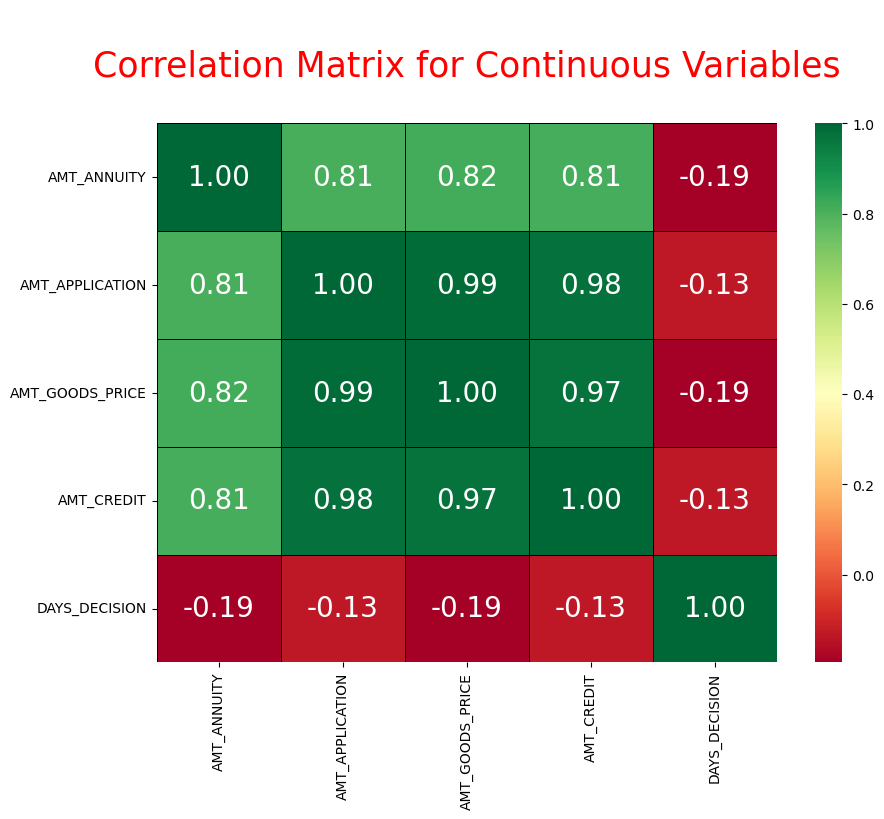

In [183]:
#Correlation Plot among Amt variables
plt.figure(figsize=[10,7])
sns.heatmap(pdf[num_list].corr(), cmap="RdYlGn", annot=True, 
                 annot_kws = {'size':20, 'fontweight': 40}, 
                linewidth = 0.5, linecolor ='black', fmt='.2f')
plt.title("\nCorrelation Matrix for Continuous Variables\n", fontsize = 25, fontweight = 20, color = 'red')

plt.show()

## Insights
 - Credit Amount, Goods Price  and Application Amount are highly correlated.
 - No of days taken for decision on loan is not at all related to any other variable.

# Merging of the two datasets

In [184]:
merged_df = pd.merge(df, pdf, how='inner', on='SK_ID_CURR')
merged_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_INCOME_GRP,AMT_CREDIT_x,AMT_CREDIT_GRP,...,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,Y,0,202500.0000,200K-300K,406597.5000,400K-500K,...,XAP,New,Vehicles,POS,XNA,Stone,Auto technology,24.0000,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,0,270000.0000,200K-300K,1293502.5000,1M+,...,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,XNA,12.0000,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,0,270000.0000,200K-300K,1293502.5000,1M+,...,XAP,Refreshed,Furniture,POS,XNA,Stone,Furniture,6.0000,middle,POS industry with interest
3,100003,0,Cash loans,F,N,0,270000.0000,200K-300K,1293502.5000,1M+,...,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,Consumer electronics,12.0000,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,0,67500.0000,0-100K,135000.0000,100K-200K,...,XAP,New,Mobile,POS,XNA,Regional / Local,Connectivity,4.0000,middle,POS mobile without interest


In [185]:
#Checking the Shape of the merged DataFrame
merged_df.shape

(1413701, 70)

In [186]:
# understanding information and dtypes 
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 70 columns):
 #   Column                       Non-Null Count    Dtype   
---  ------                       --------------    -----   
 0   SK_ID_CURR                   1413701 non-null  int64   
 1   TARGET                       1413701 non-null  int64   
 2   NAME_CONTRACT_TYPE_x         1413701 non-null  object  
 3   CODE_GENDER                  1413701 non-null  object  
 4   FLAG_OWN_REALTY              1413701 non-null  object  
 5   CNT_CHILDREN                 1413701 non-null  int64   
 6   AMT_INCOME_TOTAL             1413701 non-null  float64 
 7   AMT_INCOME_GRP               1413683 non-null  category
 8   AMT_CREDIT_x                 1413701 non-null  float64 
 9   AMT_CREDIT_GRP               1413701 non-null  category
 10  AMT_ANNUITY_x                1413701 non-null  float64 
 11  AMT_GOODS_PRICE_x            1413701 non-null  float64 
 12  AMT_GOODS_PRICE_GRP         

In [187]:
# Getting the description of the merged DataFrame
merged_df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_ID_PUBLISH,...,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,CNT_PAYMENT
count,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,...,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413700.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000,1413701.0000
mean,278481.2875,0.0866,0.4049,173316.0437,587553.6727,27016.8765,527652.1826,44.7152,199.0780,8.3139,...,2.5755,1922744.3306,14840.3223,175243.5937,196354.0861,200655.2352,12.4789,0.9964,880.3670,12.5637
std,102811.7880,0.2812,0.7173,198573.3720,384917.3314,13950.7164,353102.8382,11.9029,392.7051,4.1298,...,2.2688,532715.3353,13163.7043,293622.1931,319481.2507,282018.9444,3.3315,0.0596,783.5402,14.4881
min,100002.0000,0.0000,0.0000,25650.0000,45000.0000,1615.5000,40500.0000,20.5178,0.0000,0.0000,...,0.0000,1000001.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
25%,189364.0000,0.0000,0.0000,112500.0000,270000.0000,16821.0000,238500.0000,34.9014,2.8548,4.8849,...,1.0000,1461346.0000,7406.0550,19750.5000,24880.5000,66375.0000,10.0000,1.0000,271.0000,0.0000
50%,278992.0000,0.0000,0.0000,157500.0000,508495.5000,24925.5000,450000.0000,43.9562,6.5781,9.1233,...,2.0000,1922698.0000,11250.0000,70870.5000,80595.0000,112320.0000,12.0000,1.0000,582.0000,10.0000
75%,367556.0000,0.0000,1.0000,207000.0000,807984.0000,34542.0000,679500.0000,54.7397,17.2959,11.8329,...,4.0000,2384012.0000,16747.9650,180000.0000,215640.0000,180000.0000,15.0000,1.0000,1313.0000,18.0000
max,456255.0000,1.0000,19.0000,117000000.0000,4050000.0000,225000.0000,4050000.0000,69.0438,1000.6658,19.7178,...,25.0000,2845381.0000,418058.1450,5850000.0000,4509688.5000,5850000.0000,23.0000,1.0000,2922.0000,84.0000


In [188]:
mdf1 = merged_df[merged_df["TARGET"]==1]

In [189]:
mdf0 = merged_df[merged_df["TARGET"]==0]

In [190]:
merged_df.nunique().sort_values(ascending = False)

SK_ID_PREV                     1413701
AMT_ANNUITY_y                   329537
SK_ID_CURR                      291057
EXT_SOURCE_2                    117215
AMT_GOODS_PRICE_y                86766
AMT_APPLICATION                  86766
AMT_CREDIT_y                     81730
YEARS_BIRTH                      17448
AMT_ANNUITY_x                    13371
YEARS_EMPLOYED                   12451
YEARS_ID_PUBLISH                  6161
AMT_CREDIT_x                      5496
YEARS_LAST_PHONE_CHANGE           3706
DAYS_DECISION                     2922
AMT_INCOME_TOTAL                  1876
AMT_GOODS_PRICE_x                  986
EXT_SOURCE_3                       810
ORGANIZATION_TYPE                   58
CNT_PAYMENT                         48
OBS_60_CNT_SOCIAL_CIRCLE            33
OBS_30_CNT_SOCIAL_CIRCLE            33
NAME_GOODS_CATEGORY                 27
AMT_REQ_CREDIT_BUREAU_YEAR          25
NAME_CASH_LOAN_PURPOSE              25
AMT_REQ_CREDIT_BUREAU_MON           24
HOUR_APPR_PROCESS_START  

In [191]:
merged_df.nunique().sort_values(ascending = False).index

Index(['SK_ID_PREV', 'AMT_ANNUITY_y', 'SK_ID_CURR', 'EXT_SOURCE_2',
       'AMT_GOODS_PRICE_y', 'AMT_APPLICATION', 'AMT_CREDIT_y', 'YEARS_BIRTH',
       'AMT_ANNUITY_x', 'YEARS_EMPLOYED', 'YEARS_ID_PUBLISH', 'AMT_CREDIT_x',
       'YEARS_LAST_PHONE_CHANGE', 'DAYS_DECISION', 'AMT_INCOME_TOTAL',
       'AMT_GOODS_PRICE_x', 'EXT_SOURCE_3', 'ORGANIZATION_TYPE', 'CNT_PAYMENT',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'NAME_GOODS_CATEGORY', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'NAME_CASH_LOAN_PURPOSE', 'AMT_REQ_CREDIT_BUREAU_MON',
       'HOUR_APPR_PROCESS_START', 'OCCUPATION_TYPE', 'PRODUCT_COMBINATION',
       'CNT_FAM_MEMBERS', 'CNT_CHILDREN', 'AMT_INCOME_GRP',
       'NAME_SELLER_INDUSTRY', 'AMT_CREDIT_GRP', 'AMT_GOODS_PRICE_GRP',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'YEARS_EMPLOYED_RANGE', 'CODE_REJECT_REASON',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'CHANNEL_TYPE', 'AMT_REQ_CREDIT_BUREAU_DAY'

## Segregating the columns into Categorical, Continuous and ID columns.

In [192]:
# The below are the categorical columns. Categorical columns are the columns which have very less unique values.
m_cat_cols=['ORGANIZATION_TYPE', 'CNT_PAYMENT',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'NAME_GOODS_CATEGORY', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'NAME_CASH_LOAN_PURPOSE', 'AMT_REQ_CREDIT_BUREAU_MON',
       'HOUR_APPR_PROCESS_START', 'OCCUPATION_TYPE', 'PRODUCT_COMBINATION',
       'CNT_FAM_MEMBERS', 'CNT_CHILDREN', 'AMT_INCOME_GRP',
       'NAME_SELLER_INDUSTRY', 'AMT_CREDIT_GRP', 'AMT_GOODS_PRICE_GRP',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'YEARS_EMPLOYED_RANGE', 'CODE_REJECT_REASON',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'CHANNEL_TYPE', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'WEEKDAY_APPR_PROCESS_START', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE',
       'NAME_HOUSING_TYPE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_YIELD_GROUP',
       'YEARS_BIRTH_RANGE', 'NAME_PORTFOLIO', 'NAME_PAYMENT_TYPE',
       'NAME_CONTRACT_TYPE_y', 'NAME_CONTRACT_STATUS', 'NAME_CLIENT_TYPE',
       'NAME_PRODUCT_TYPE', 'REGION_RATING_CLIENT_W_CITY',
       'NAME_CONTRACT_TYPE_x', 'LIVE_CITY_NOT_WORK_CITY',
       'REG_CITY_NOT_WORK_CITY', 'REG_REGION_NOT_LIVE_REGION', 'CODE_GENDER',
       'NFLAG_LAST_APPL_IN_DAY', 'FLAG_LAST_APPL_PER_CONTRACT',
       'FLAG_OWN_REALTY', 'REG_CITY_NOT_LIVE_CITY', 'TARGET',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION']
#The below are the Continuous/Numerical columns. Numerical columns can have a very high unique values.
m_cont_cols =['AMT_ANNUITY_y', 'SK_ID_CURR', 'EXT_SOURCE_2',
       'AMT_GOODS_PRICE_y', 'AMT_APPLICATION', 'AMT_CREDIT_y', 'YEARS_BIRTH',
       'AMT_ANNUITY_x', 'YEARS_EMPLOYED', 'YEARS_ID_PUBLISH', 'AMT_CREDIT_x',
       'YEARS_LAST_PHONE_CHANGE', 'DAYS_DECISION', 'AMT_INCOME_TOTAL',
       'AMT_GOODS_PRICE_x', 'EXT_SOURCE_3']
# As the no of unique values in 'SK_ID_CURR' is equal to the total no of rows, it can be considered to be ID column.
m_id_col = ['SK_ID_PREV']

## Univariate Analysis of Merged Dataset:

### Categoriacl Columns:

In [193]:
merged_df['NAME_CONTRACT_STATUS'].value_counts().sort_values(ascending = False)

Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64

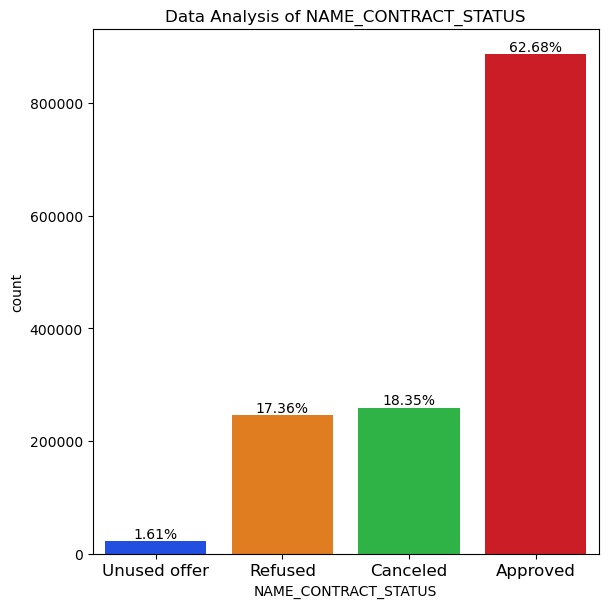

In [194]:
uni_countplot_merge('NAME_CONTRACT_STATUS')

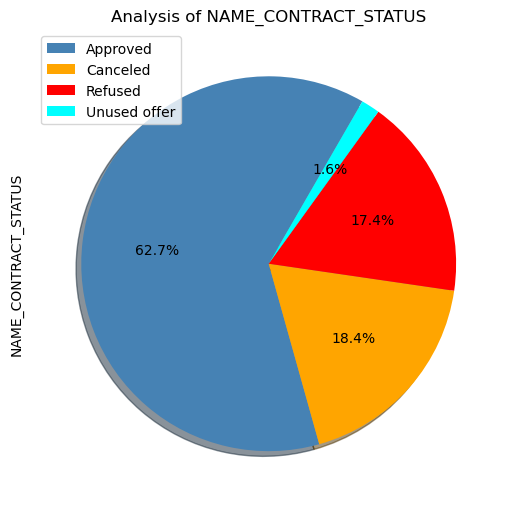

In [195]:
uni_piechart_merge('NAME_CONTRACT_STATUS')

# Inferences:
 - Almost 62.68% of the applications have been approved.
 - Only 1.61% loans have been cancelled by the client but at different stages of the process.

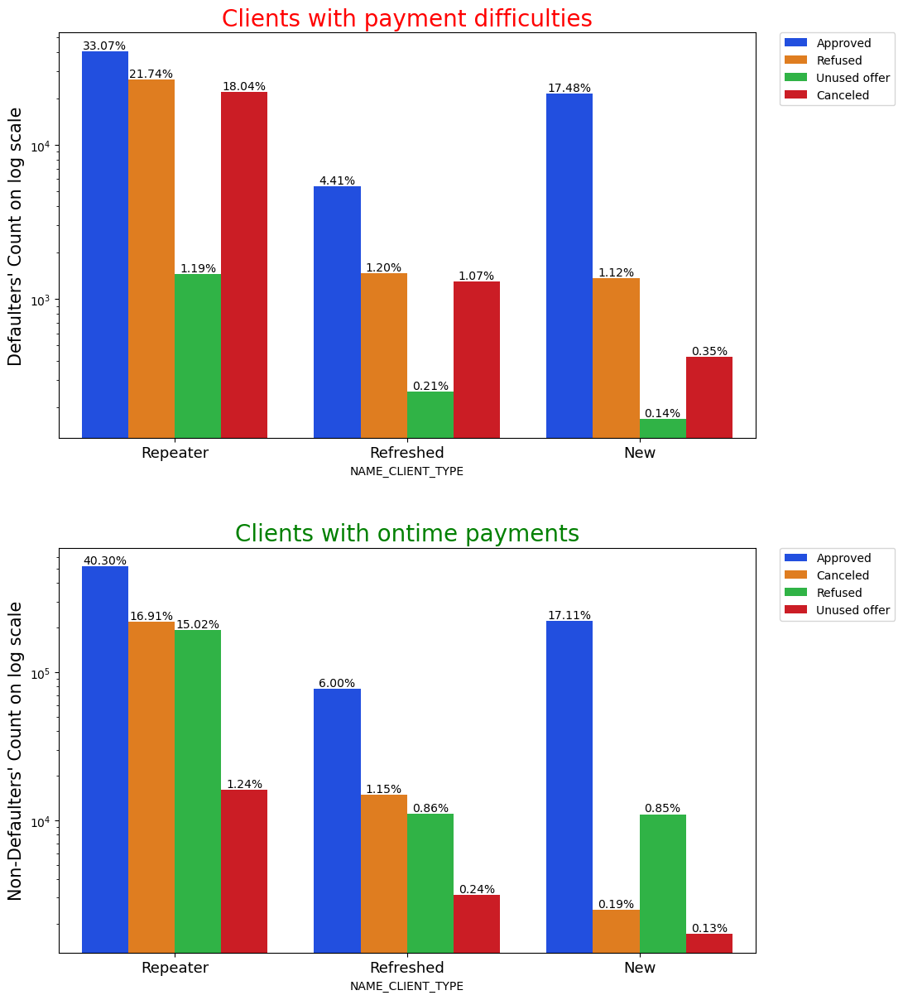

In [196]:
uni_countplot2_merged('NAME_CLIENT_TYPE', True, False, True)

## Observations:
 - Most of the applications are of Repeaters. Repeaters are making ontime payements rather than facing difficulties. Most of the Repeaters' applications have been canceled or refused.
 - Most of the applications have been cancelled by the Repeaters but at different stages of the process when compared to the other two types of clients.
 - Even Refreshed applicants are also making ontime payments rather than facing difficulties.
 - New applicants are facing Payment difficulties.

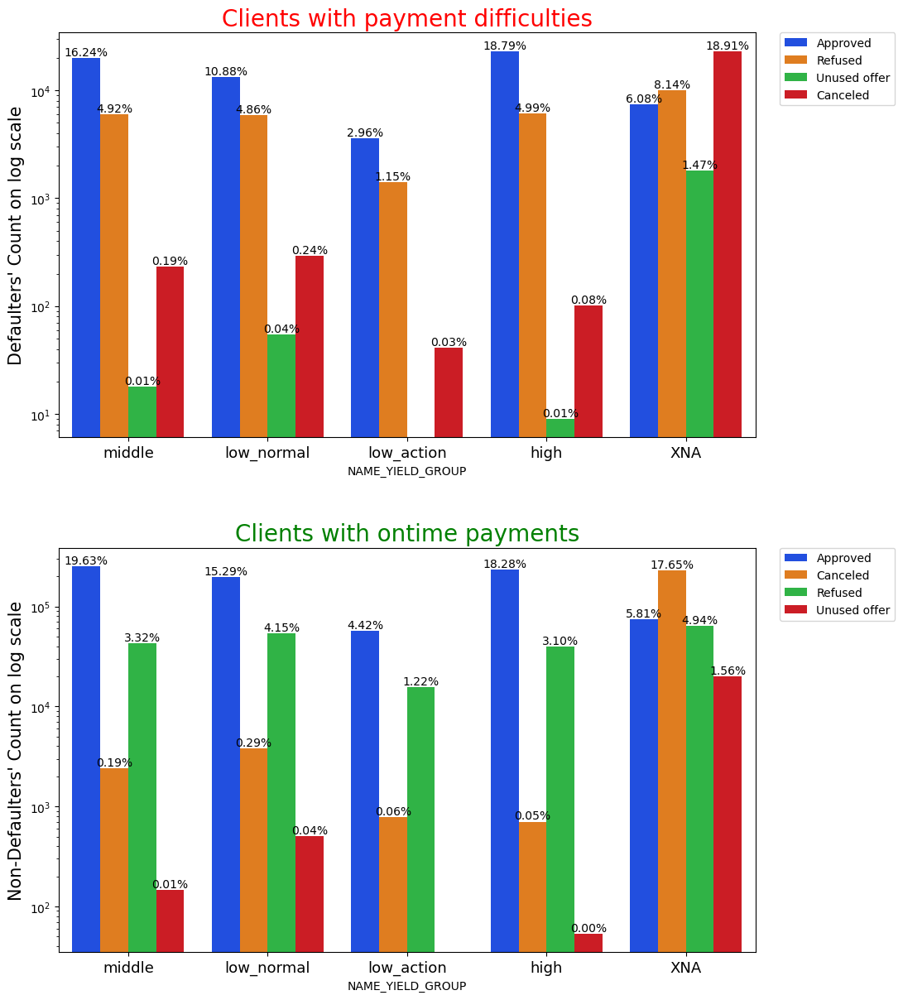

In [197]:
uni_countplot2_merged('NAME_YIELD_GROUP', True, False, True)

## Observations:
 - Default Rate for the loans lent at low interest rate is high. So, we must take action on them. 

In [198]:
merged_df['CHANNEL_TYPE'].value_counts().sort_values(ascending = False)

Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64

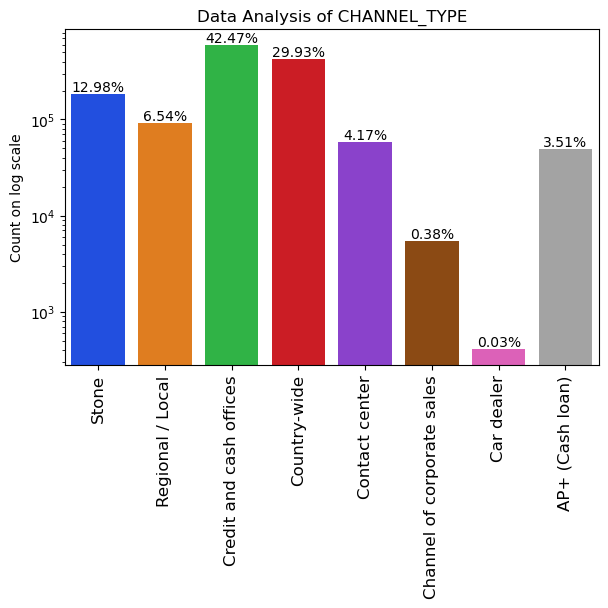

In [199]:
uni_countplot_merge('CHANNEL_TYPE', True, True)

## Inferences:
 - Majority of the applications(42.466%) have been acquired from Credit and cash offices.
 - Minority of the applications(0.029%) have been acquired from Car Dealers

In [200]:
merged_df['NAME_YIELD_GROUP'].value_counts().sort_values(ascending = False)

XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64

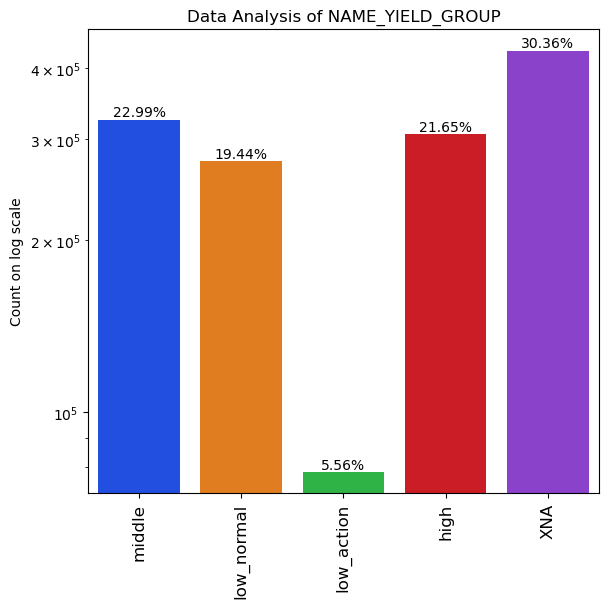

In [201]:
uni_countplot_merge('NAME_YIELD_GROUP', True, True)

## Observations:
- The Interest Rate is mentioned as XNA for most of the applications
- Next majority(22.99%) loans are lent at Medium Interest Rate(neither high nor low) and 21.65% loans are lent at High Interest rate.
- 5.56% loans are lent at very Low Interest Rate and action must be taken.

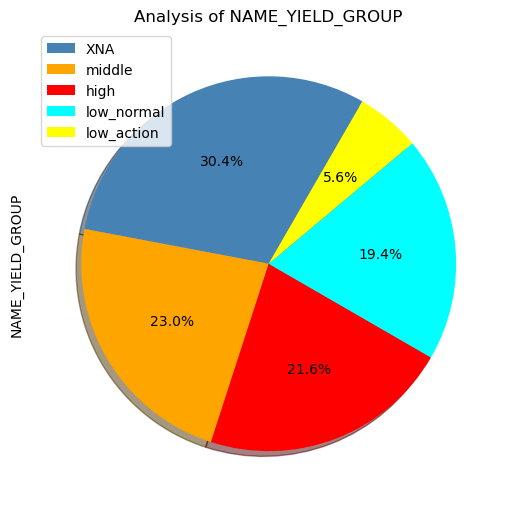

In [202]:
uni_piechart_merge('NAME_YIELD_GROUP')

## Inferences:
 - Grouped Interest Rate Status has been mentioned as XNA (No Status) for majority of the applications(30.4% of the applocations)
 - Grouped Interest Rate is high for almost 21.6% of the applications and medium for 23.0% of the applications.
 - Grouped Interest Rate is low for almost 5.6% of the applications and action must be taken on them.

In [203]:
merged_df['DAYS_DECISION'].value_counts().sort_values(ascending = False)

245     2184
238     2163
210     2103
224     2059
252     2052
        ... 
2760     134
2921     133
2829     133
2902     110
1          1
Name: DAYS_DECISION, Length: 2922, dtype: int64

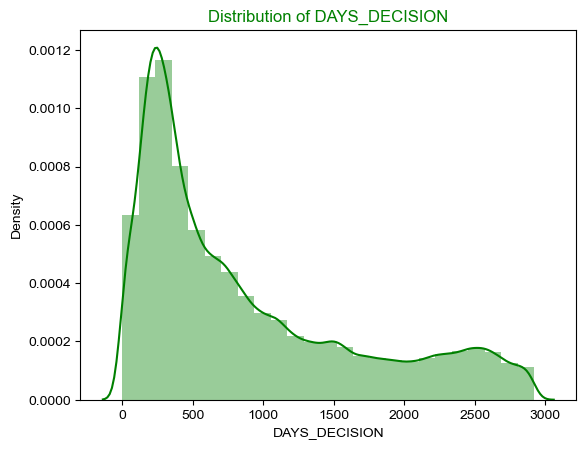

In [204]:
sns.distplot(merged_df.DAYS_DECISION, bins=25, color="g", hist = True)
sns.set_style("dark")
plt.title("Distribution of DAYS_DECISION", fontsize=12, fontweight = 40, color ='g')
plt.show()

## Inferences:
 - It has taken 245 days for majority of the applications to get final decision.
 - Only for 1 application, it has taken 1 day for final decision.

## Correlation Analysis of Numerical Variables

In [205]:
corr_mdf = merged_df[['AMT_ANNUITY_x', 'AMT_APPLICATION','AMT_CREDIT_x', 'AMT_GOODS_PRICE_x',
                    'AMT_ANNUITY_y', 'AMT_CREDIT_y', 'AMT_GOODS_PRICE_y', 'CNT_PAYMENT']].corr()

In [206]:
corr_mdf.head()

,AMT_ANNUITY_x,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE_x,AMT_ANNUITY_y,AMT_CREDIT_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_x,1.0000,0.1121,0.7584,0.7620,0.1782,0.1076,0.1167,-0.0029
AMT_APPLICATION,0.1121,1.0000,0.1188,0.1207,0.8065,0.9757,0.9874,0.7159
AMT_CREDIT_x,0.7584,0.1188,1.0000,0.9861,0.1380,0.1167,0.1221,0.0391
AMT_GOODS_PRICE_x,0.7620,0.1207,0.9861,1.0000,0.1399,0.1172,0.1236,0.0383
AMT_ANNUITY_y,0.1782,0.8065,0.1380,0.1399,1.0000,0.8130,0.8172,0.4161


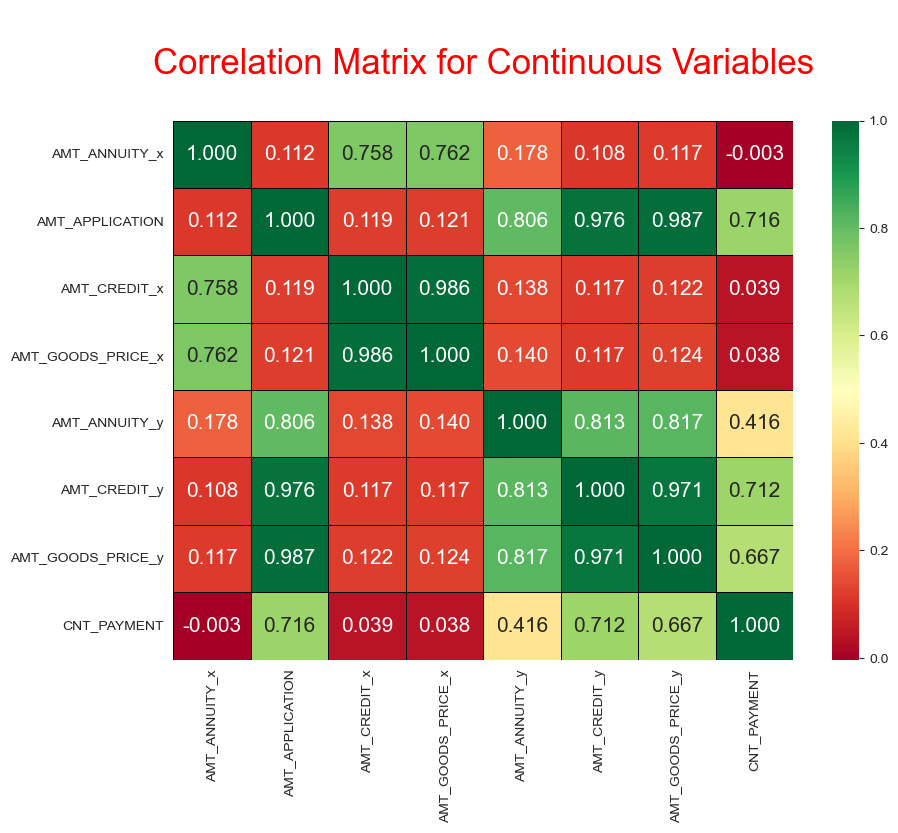

In [207]:
plt.figure(figsize=[10,7])
sns.heatmap(corr_mdf, cmap="RdYlGn", annot=True, 
                 annot_kws = {'size':15, 'fontweight': 40}, 
                linewidth = 0.5, linecolor ='black', fmt='.3f')
plt.title("\nCorrelation Matrix for Continuous Variables\n", fontsize = 25, fontweight = 20, color = 'red')

plt.show()

## Observations
 - AMT_APPLICATION has a high correlation with AMT_CREDIT_y, AMT_GOODS_PRICE_y, AMT_ANNUITY_y, and a fair correlation with CNT_PAYMENT
 - AMT_CREDIT_y has a high correlation with AMT_GOODS_PRICE_y and decent correlation with CNT_PAYMENT
 - AMT_ANNUITY_x has a high correlation with AMT_GOODS_PRICE_y,AMT_CREDIT_y
 - AMT_ANNUITY_x has a high correlation with AMT_GOODS_PRICE_x,AMT_CREDIT_x
 - AMT_CREDIT_x has a high correlation with AMT_GOODS_PRICE_x

## Bi/Multivariate Analysis:

### Categoriacl vs Categorical

### Analysis of YEARS_BIRTH_RANGE vs NAME_CONTRACT_STATUS

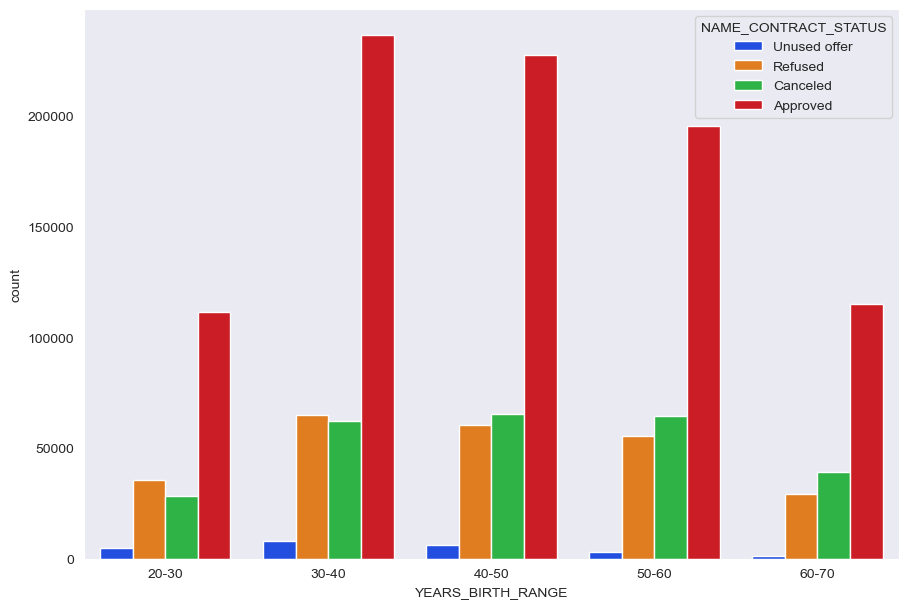

In [208]:
bi_countplot_merge('YEARS_BIRTH_RANGE', 'NAME_CONTRACT_STATUS', False, False, False)

## Observations
 - Clients who are in 30-40 age group have got most approvals followed by those in 40-50 age group.
 - Clients who are in 60-70 age range have received the least refusals followed by 20-30 age range.

### Analysis of NAME_FAMILY_STATUS vs NAME_CONTRACT_STATUS

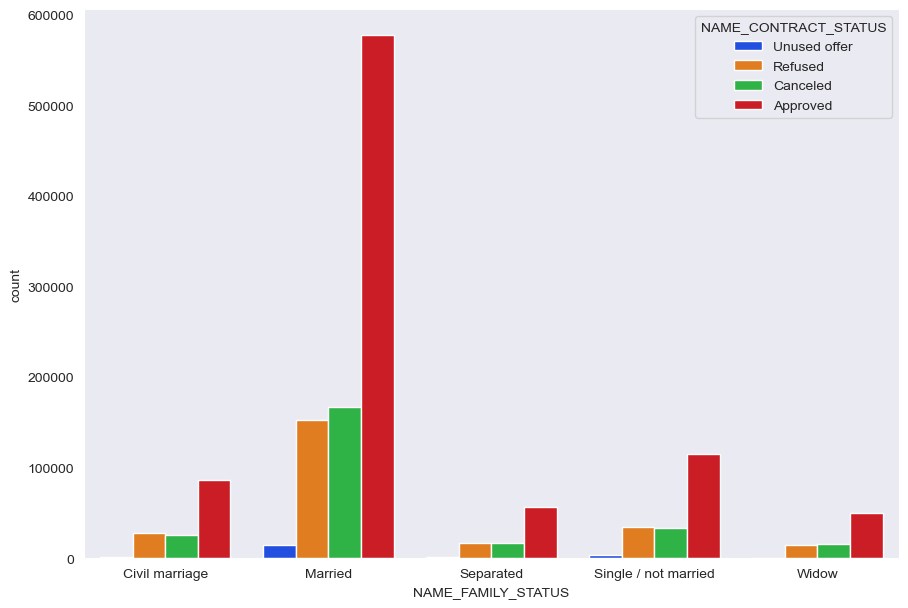

In [209]:
bi_countplot_merge('NAME_FAMILY_STATUS', 'NAME_CONTRACT_STATUS', False, False, False)

## Observations:
 - Married Applicants have got the highest approvals.

### Analysis of NAME_EDUCATION_TYPE vs NAME_CONTRACT_STATUS

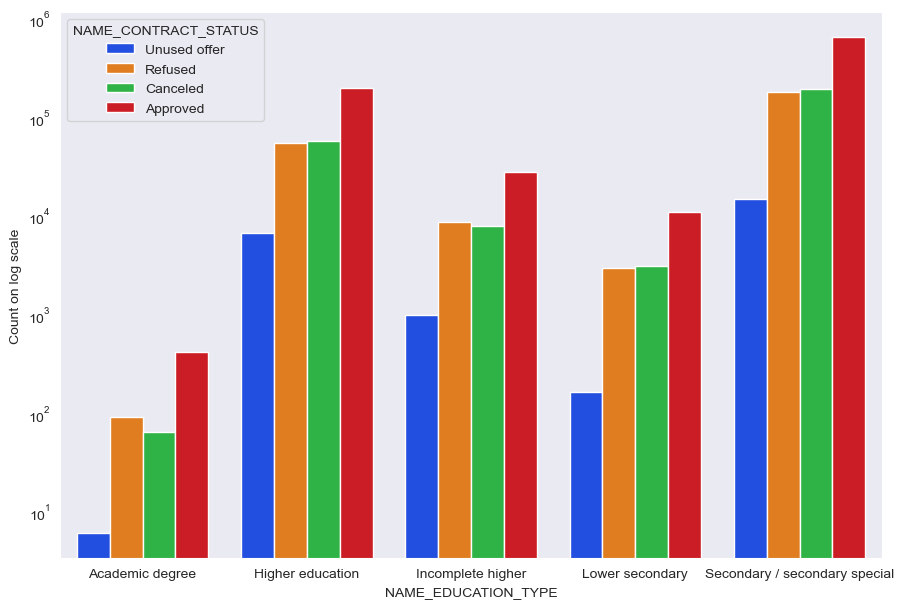

In [210]:
bi_countplot_merge('NAME_EDUCATION_TYPE', 'NAME_CONTRACT_STATUS', True, False, False)

## Observations:
 - Applicants with Secondary/secondary special education have got more approvals

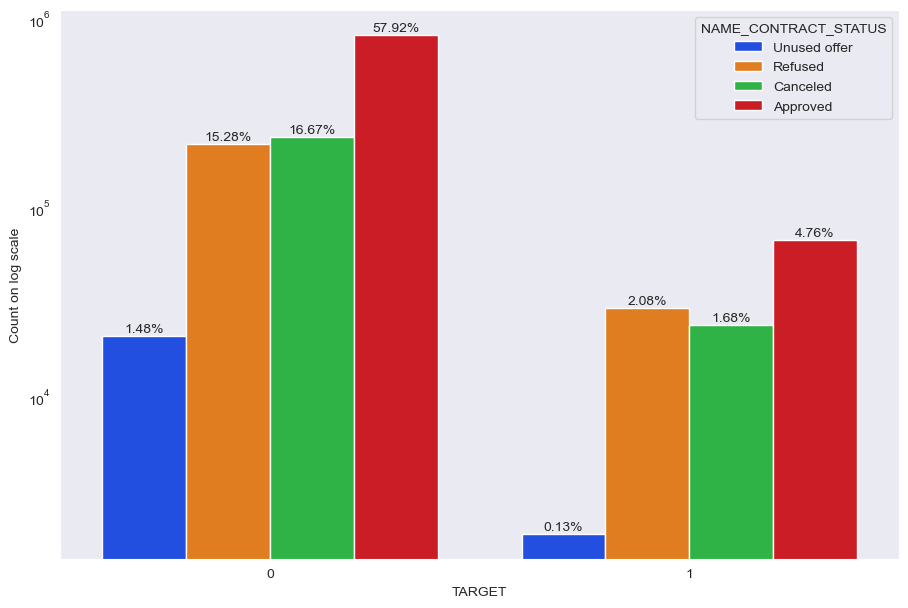

In [211]:
bi_countplot_merge('TARGET', 'NAME_CONTRACT_STATUS', True, False, True)

## Observations:
 - Almost 4.76% of Approved loans are at risk. Because the applicants of these loans are facing payment difficulties.

## Continuous vs Categorical

In [212]:
# Function to plot pointplots on Merged DataFrame
def merged_pointplot(x,y):
    plt.figure(figsize=(8,4))
    sns.pointplot(x=x, 
                  y=y, 
                  hue="TARGET", 
                  data=merged_df,
                  palette =['g','r'])

### Analysis of AMT_INCOME_TOTAL vs NAME_CONTRACT_STATUS for both Repayers and Defaulters

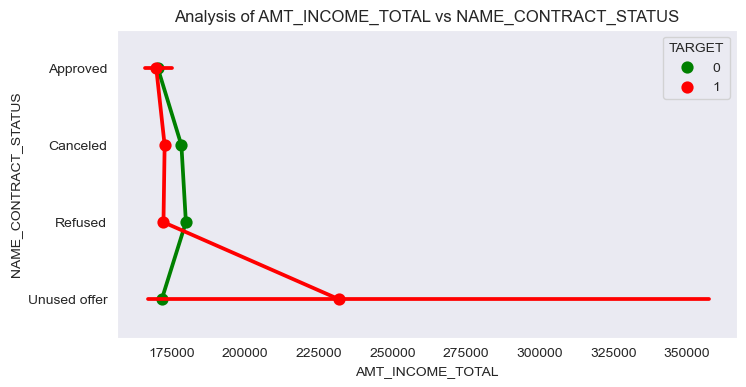

In [213]:
merged_pointplot('AMT_INCOME_TOTAL', 'NAME_CONTRACT_STATUS')
plt.title('Analysis of AMT_INCOME_TOTAL vs NAME_CONTRACT_STATUS')
plt.show()

## Observations:
 - Default rate of the clients, who have cancelled the loan but at different stages of the current process, is high earlier though their income is higher.
 - Surprisingly, default rate of the clients whose applications are either canceled or refused is low.

### Analysis of AMT_APPLICATION vs NAME_CONTRACT_STATUS for both Repayers and Defaulters

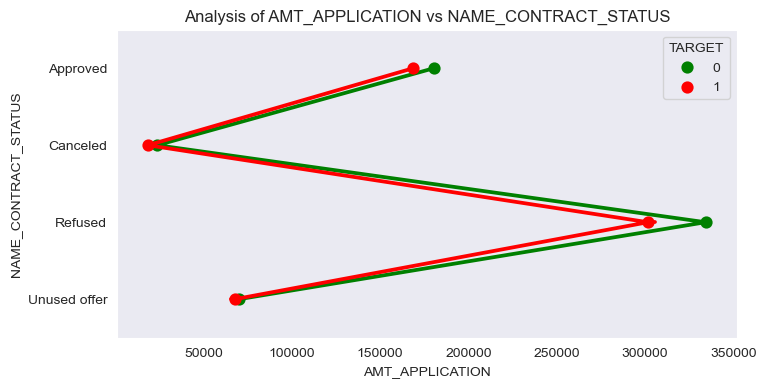

In [214]:
merged_pointplot('AMT_APPLICATION', 'NAME_CONTRACT_STATUS')
plt.title('Analysis of AMT_APPLICATION vs NAME_CONTRACT_STATUS')
plt.show()

## Observations:
 - Most of the applications of the clients who asked for the credit amount b/w 150K and 200K have been approved, and these clients are good repayers.
 - Most of the applications of the clents who asked for the credit amount b/w 300K and 350K have been refused though their repayment status is good. This may be because of the resason that their quoted amount is higher than 50% of their Income range.

### Analysis of AMT_ANNUITY_y vs NAME_CONTRACT_STATUS for both Repayers and Defaulters

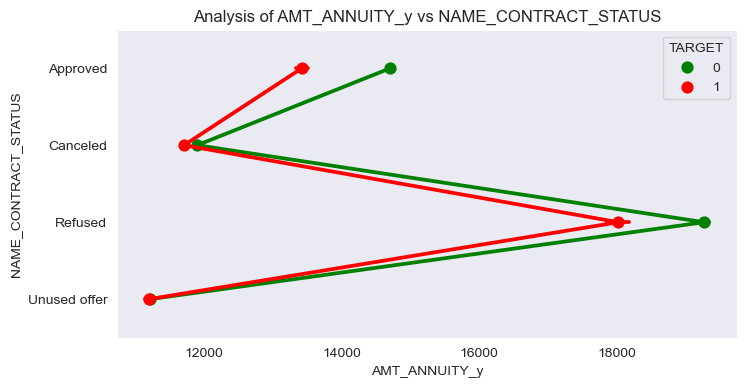

In [215]:
merged_pointplot('AMT_ANNUITY_y', 'NAME_CONTRACT_STATUS')
plt.title('Analysis of AMT_ANNUITY_y vs NAME_CONTRACT_STATUS')
plt.show()

## Observations
 - Most of the loans with annuity b/w 14000 and 16000 have been approved, also clients are making ontime repayments.
 - Most of the loans with annuity b/w 12000 and 14000 have been approved, also clients are facing payment difficulties. 

In [216]:
#Import the plotly libraries
import plotly.express as px

In [217]:
res = merged_df.groupby(["NAME_CONTRACT_STATUS"])[['YEARS_BIRTH']].mean()
res.reset_index(inplace=True)

In [218]:
res

,NAME_CONTRACT_STATUS,YEARS_BIRTH
0,Approved,44.6464
1,Canceled,45.9313
2,Refused,44.1264
3,Unused offer,39.8844


### Analysis of YEARS_BIRTH vs NAME_CONTRACT_STATUS

In [219]:
fig = px.line(res, x="NAME_CONTRACT_STATUS", y="YEARS_BIRTH")
fig.show()

## Observations:
 - Average age of the clients whose loan applications are approved is 44.64636 years
 - Average age of the clients whose loan applications are canceled is 45.9313 years
 - Average age of the clients whose loan applications are refused is 44.12638 years
 -  Average age of the clients who canceled the loan at different stages of the process is 39.88439 years

### Analysis of AMT_ANNUITY_y vs NAME_CONTRACT_STATUS vs CODE_GENDER

In [220]:
max_AMT_CREDIT_y = max_min(merged_df,'AMT_CREDIT_y')

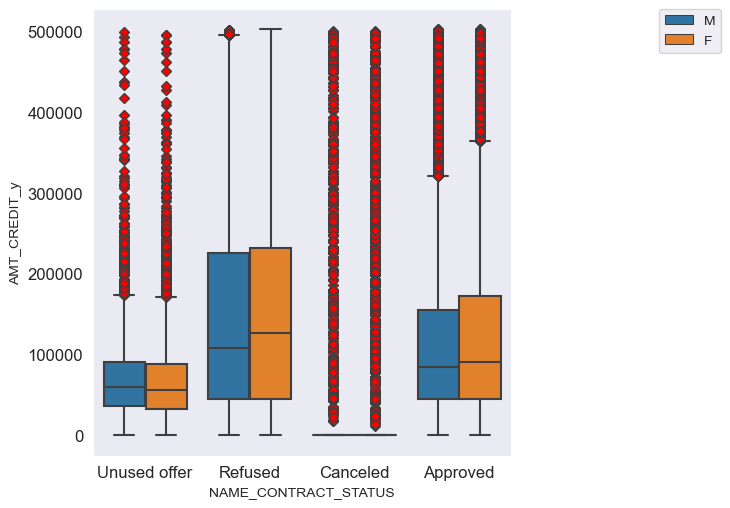

In [221]:
bi_boxplot_merged('NAME_CONTRACT_STATUS','AMT_CREDIT_y', max_AMT_CREDIT_y,'CODE_GENDER')

## Observations:
 - Loan applications of Female clients who applied for higher credit amount have been refused more than those of Male clients.
 - Loan applications of Female clients whose 0.75 quartile of credit amount lies b/w 100K and 200K have been approved more than those of Male clients. 

# 🌻Insights from Analysis:

 ## Decisive Factors:
#### After Analysing the Whole Data follwing is the Summary of key Observations

  - Almost 4.76% of Approved loans are at risk. Because the applicants of these loans are facing payment difficulties.This indicates that approval of these applications may lead to financial loss for the company becasue the applicant is not likely to repay the loan.

  - It was observed that around 31.95% of the loan applications who did not have payment difficulties were refused/canceled. This indicates that Rejection of these applications may lead to loss of business for the company because these applicants are likely to repay the loan.

#### Based on the above observations, to minimise the risk losing money while lending to the customers we try to identify and understand the drving factors behind loan default which are given below.
 - CODE_GENDER:
  - 57.1% of the clients with payment difficulties are females and 42.9% of those are males.
  - Almost 66.6% of the clients with ontime payments are females and 33.4% of those are males.
  - Male Clients have higher chances of not returning their loans.  
 - NAME_INCOME_TYPE:
  - Working Clients have the highest payment difficulties and also with the highest ontime payments. So, most of the people who applied for loan are Working people.
  - Commercial Associates, Pensioners and State servants are making timely payments over facing payment difficulties.    
  - Also, we can say that there is higher defaulter rate in the case of Working People
  - We can also observe that Businemen and Students are not facing any payment difficulties. So, it's safe to give more loans to Businessmen. We should think twice for students though they don't have Default record as they don't have income source.
  - Also, Pensioners, State Servants and Commercial Associates are facing comparatively less payment difficulties.
 - NAME_CONTRACT_TYPE:
  - 93.5% of the Clients with payment difficulties and 90.2% of the Clients with ontime payment have taken cash loans.
  - So, we can say that majority of the clients have taken cash loans over revolving loans.
  - Also, we can say that there is higher defaulter rate in the case of the clients who have taken cash loans.
 - NAME_EDUCATION_TYPE:
  - Clients with Secondary/secondary special education have the highest payment difficulties and making the highest ontime payments. So, the clients with Secondary/secondary special have taken more loans.
  - Clients with Higher education are making timely payments. Also, clients with Academic Degree are more likely to repay. So, we can consider Clients with Higher Education and with Academic Degree for loan approval.
 - NAME_FAMILY_STATUS
  - 59.8% of the Clients with Payment difficulties are Married. Even, 64.2% of the Clients with ontime payments are Married. Married Clients are making ontime payments. 
  - Clients who are Single/not married, and Civil marriage clients are facing more payment difficulties rather than making timely payments.
  - Widows also good repayment rate.
 - OCCUPATION_TYPE
  - Majority of the Clients have not disclosed their occupation.
  - Laborers are facing more payment difficulties.
  - We can see that even Drivers, Cooking Staff and Sales staff are facing payment difficulties. But, compared to Laborers, the percentage is a bit lesser.
  - We can see that IT staff, High skill tech staff, HR staff and Secretaries are making timely repayments.
  - We can also see that Managers and Accountants have high repayment rate.
 - YEARS_EMPLOYED_RANGE
  - Most of the applicants are people who have 0-5 years of work experience. Also, they high default rate.
  - With increase of employment experience, default rate is gradually decreasing.
 - AGE GROUP
   - Defaulters were predominantly from lower age group in range 25-40 while non-defaulters were predominantly from higher age group in range 30-45.

## Additional Factors to be considered:

#### After Analysing the Whole Data follwing is the Summary of key Observations

  - Clients who are Sales staff,Laborers,Drivers and have taken Cash loans are facing more Payment difficulties rather than doing ontime repayments.
  
  - Male Clients who have Secondary/Secondary special education have more Payment difficulties rather than having ontime Payment record.
  
  - Female Clients who have Higher education have more On-Time Payments rather than having Payment difficulties
  
  - Clients who are Working and Male have more Payment difficulties rather than having Good repayment record.
  
  - Clients who are Pensioners and Females have more Payment difficulties rather than having Good repayment record.
  
  - Clients who are Businessmen and Students do their payments Ontime though their record count is low.
  
  - Clients who are in 30-40 age group have got most approvals followed by those in 40-50 age group.
  
  - Clients who are in 60-70 age range have received the least refusals followed by 20-30 age range.
  
  - We can find more Defaulters when the Crefit Amount is less than 3M.
  
  - Most of the defaulters have Annuity values less than 100,000.
  
  - We can find less defaulters when the credit amount is greater than 3M and Annuity is greater than or equal to 100,000
  
  - There are more repayers rate when the annuity is more than 100K ,means applicants with 100K annuity will more likely to repay their loans, but their frequency is low.
  
  - For AMT_CREDIT between 250K and approximately 650K, there are more clients with payment difficulties
  
  - For AMT_CREDIT > 750000 , there are more clients with ontime Payments
  
  - For YEARS_BIRTH between 20 and 40, there are more clients with payment difficulties.
  
  - Conversely, for YEARS_BIRTH > 40 , there are more clients with ontime Payments.
  
  - For AMT_GOODS_PRICE between 250K and 550K, there are more clients with Payment difficulties.
  
  - Majority of the applications(43.11%) have been acquired from Credit and cash offices.
  
  - Minority of the applications(0.03%) have been acquired from Car Dealers
  
  - Most of the applications are of Repeaters. Repeaters are making ontime payements rather than facing difficulties. Most of the Repeaters' applications have been canceled or refused.
  
  - Even Refreshed applicants are also making ontime payments rather than facing difficulties.
  
  - New applicants are facing Payment difficulties.
  
  - Most of the loans with annuity b/w 14000 and 16000 have been approved, also clients are making ontime repayments.
  
  - Most of the loans with annuity b/w 12000 and 14000 have been approved, also clients are facing payment difficulties.
  
  - Males as Low-Skill Laborers or Realty agents are risky clients

  - If client's permanent address does not match contact address, the status of that applicant being a defaulter is high

  - Cooking staff, Labours,low-skilled labours, who has Lower secondary Education are the Red Flags ,they can be provided with loans at higher interest as their default rate is high.

## 🌻CONCLUSION AND RECOMMENDATIONS

### SUGGESTIONS TO INCREASE REPAYMENT RATE & DECREASE THE DEFAULT RATE:
 
 - CODE_GENDER
   - Males as Low-Skil Labourers or Realty agents are risky clients and Loan providers should be carefull while giving cash loans. (This insight is from MultiVariate analysis)
   - Bank should make good customer relations with females to increase profit
 
 - NAME_CONTRACT_TYPE
   - Clients who are in IT Staff,Accountants ,Managers with high repay rate when the loan is Revolving type , than cash loan.
 - AMT_INCOME_GROUP
   - About 90% of the clients are under 300K income, they show high default rate. So, they can be given loan at high interest rate.
 
 - NAME_EDUCATION_TYPE 
   - More loan products can be suggested to people with Academic degrees to increase the profit.
 
   - Cooking staff, Labours,low-skilled labours, who has Lower secondary Education are showing high default rate ,they can be provided with loans at higher interest as their default rate is high.
   
 - AMT_CREDIT 
   - For AMT_CREDIT between 250K and approximately 650K, there are more clients with payment difficulties. For AMT_CREDIT > 750000 , there are more clients with ontime Payments. So, these clients can be provided with high rate of interest at these Credit amounts to minimise loss.
 
 - AMT_GOODS_PRICE 
   - For AMT_GOODS_PRICE between 250K and 550K, there are more clients with Payment difficulties. When there are cases of defaulters, we can give them loan at high interest rate.
 
 - YEAR_BIRTH_GROUP 
   - Cleaning staff,Cooking staff ,Low-Skil Labourers are risky clients in 20-30 age group, loan providers should aware them about financial products in good details because financial awareness may not be there.
 
 - If client's permanent address does not match contact address that applicant being a defaulter is high, so bank should Refuse their applications

#### RECOMMENDATIONS:

 - Applicants should be scrutinized with respect to occupation, housing, age, employment and if their credit amount is much greater than annual income as they may face payment difficulties. Hence before approval of loan their cash flow condition should be appropriately checked so that they can make the required payments on time to avoid default.

 - Almost 4.76% of Approved loans are at risk. Because the applicants of these loans are facing payment difficulties.This indicates that approval of these applications may lead to financial loss for the company because the applicant is not likely to repay the loan.

 - It was observed that around 31.95% of the loan applications who did not have payment difficulties were refused/canceled. This indicates that Rejection of these applications may lead to loss of business for the company because these applicants are likely to repay the loan. Hence, documenting the reason for rejection could mitigate the business loss and these clients could be contacted for further loans.

# 🙏Thank You🙏